In [1]:
# train a generative adversarial network on a one-dimensional function
from numpy import hstack
from numpy import zeros
from numpy import ones
from numpy.random import rand
from numpy.random import randn
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from matplotlib import pyplot
import requests
import json
import random
import os
import sys
import importlib
import numpy as np
import matplotlib.pyplot as plt


from bs4 import BeautifulSoup


In [2]:
#deck to vector conversion updated for the new json dictionnary
#New: Testing

file = open("data.json", "r")

cards = json.load(file)

#removes hero classes from json
def remove_impurities(cards):
    i = 0
    j = 0
    fixed = 0
    to_del = []
    for card in cards:
        if 'cost' in card:
            i+=1
        else:
            to_del.append(card)
            print('Removed:', card['name'])
            j +=1
        if card['playerClass'] == 'Neutral' and 'classes' in card:
            card['playerClass'] = card['classes'][0]
            fixed += 1
            print('Fixed playerClass of ', card['name'], ' from Neutral to ', card['classes'][0])
    for elem in to_del:
        cards.remove(elem)
    print('Number of impurities removed: ', j, '/', i+j)
    print('Number of card impurities fixed: ', fixed)
    return cards

def sortby_alphabetical_cost(cards):
    sorted_list = sorted(cards, key=lambda i: (i['cost'],i['name']))
    return reset_index(sorted_list)

def reset_index(cards):
    i=0
    for card in cards:
        card['id'] = i
        i+=1
    return cards

cards = remove_impurities(cards)
cards = sortby_alphabetical_cost(cards)

deck_vector = [32,64,98,1000,1250,1,2,4,5,70,97,12,67,98,33,33,43,54,76,27,65,43,78,32,78,96,12,10,32,6]
deck_vector_2 = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]

def deck_to_vector(deck_cards):
    vect = []
    for elem in deck_cards:
        #print(elem['id'])
        vect.append(elem['id'])
        #print(elem)
        #print(elem in cards)
        #vect.append(cards[elem['id']]['id'])
    return vect
    
def vector_to_deck(deck_vector,cards=cards):
    deck = []
    for elem in deck_vector:
        deck.append(cards[elem-1])
    return deck


deck = vector_to_deck(deck_vector)
deck_vector = deck_to_vector(deck)

print(deck[0])
#print(deck_vector)
#res = vector_to_deck(deck_vector_2)
#print(res)
#print(deck_to_vector(res))



Fixed playerClass of  Guidance  from Neutral to  Druid
Fixed playerClass of  Nitroboost Poison  from Neutral to  Rogue
Fixed playerClass of  Resizing Pouch  from Neutral to  Druid
Fixed playerClass of  Felfire Deadeye  from Neutral to  Hunter
Fixed playerClass of  Imprisoned Phoenix  from Neutral to  Mage
Fixed playerClass of  Hysteria  from Neutral to  Priest
Fixed playerClass of  Luckysoul Hoarder  from Neutral to  Warlock
Fixed playerClass of  Barricade  from Neutral to  Paladin
Fixed playerClass of  Rally!  from Neutral to  Paladin
Fixed playerClass of  Keywarden Ivory  from Neutral to  Mage
Removed: Anduin Wrynn
Removed: Garrosh Hellscream
Removed: Gul'dan
Removed: Illidan Stormrage
Removed: Jaina Proudmoore
Removed: Malfurion Stormrage
Removed: Rexxar
Removed: Thrall
Removed: Uther Lightbringer
Removed: Valeera Sanguinar
Number of impurities removed:  10 / 1299
Number of card impurities fixed:  10
{'cardId': 'DRG_106', 'dbfId': '54906', 'name': 'Arcane Breath', 'cardSet': 'Descen

In [3]:
import numpy as np
import pandas as pd

def concatenate_deck_class(decks, classes):
    concatenated_result = []
    for i in range(len(decks)):
        concatenated_result.append([decks[i],classes[i]])
    return concatenated_result

def read_vector_decks(file):
    df = pd.read_csv(file)
    cards_from_csv = df['cards']
    converted_decks = []
    for cards in cards_from_csv:
        if len(deck) == 30: #len(cards)
            deck_to_convert = []
            cards = cards.strip("[]")
            cards = cards.split(", ")
            for card in cards:
                if card == '':
                    continue
                deck_to_convert.append(int(card)-1)
            converted_decks.append(vector_to_deck(deck_to_convert)) #np.asarray
            class_from_csv = df['class']
            final = concatenate_deck_class(converted_decks, class_from_csv)
    return final
            

deck_list = read_vector_decks("collected_decks_vectored_Warrior.csv")

def read_json_decks(file):
    file = open(file, "r")
    deck_list = json.load(file)
    cleaned_deck_list = []
    for deck in deck_list:
        if len(deck) == 30:
            cleaned_deck_list.append(deck)
    return cleaned_deck_list

deck_list = read_json_decks('data_Warrior.json')


deck_list[0]

[{'cardId': 'BT_121',
  'dbfId': '56508',
  'name': "Imprisoned Gan'arg",
  'cardSet': 'Ashes of Outland',
  'type': 'Minion',
  'rarity': 'Common',
  'cost': 1,
  'attack': 2,
  'health': 2,
  'text': '<b>Dormant</b> for 2 turns.\\nWhen this awakens,\\nequip a 3/2 Axe.',
  'flavor': 'Factory Direct Fiery War Axe. Please allow two turns for delivery.',
  'artist': 'Ivan Fomin',
  'collectible': True,
  'race': 'Demon',
  'playerClass': 'Warrior',
  'img': 'https://d15f34w2p8l1cc.cloudfront.net/hearthstone/b5d2910686d797f3e762ccb4159599e227d594a9d7e5dad864fee508fb259bb9.png',
  'locale': 'enUS',
  'id': 332},
 {'cardId': 'BT_121',
  'dbfId': '56508',
  'name': "Imprisoned Gan'arg",
  'cardSet': 'Ashes of Outland',
  'type': 'Minion',
  'rarity': 'Common',
  'cost': 1,
  'attack': 2,
  'health': 2,
  'text': '<b>Dormant</b> for 2 turns.\\nWhen this awakens,\\nequip a 3/2 Axe.',
  'flavor': 'Factory Direct Fiery War Axe. Please allow two turns for delivery.',
  'artist': 'Ivan Fomin',
  '

In [4]:
#try to get the weights from the generator and use those in random.choices()
#New: testing
import random

def sort_by_class(cl, cards):
    class_cards = []
    for card in cards:
        #check for multiclass cards
        if 'classes' in card and cl in card['classes']:
            #print(card['name'])
            for class_ in card['classes']:
                class_cards.append(card)
        else: 
            if card['playerClass'] == cl: #or card['playerClass'] == 'Neutral' if I want to add Neutrals
                class_cards.append(card)
    return class_cards

#I use 2 separate decks to increase the chances that a class card is picked otherwise there would be an imbalanced dataset
def generate_fake_deck(class_cards, neutral_cards):
    deck = []
    for i in range(30):
        x = random.randint(1,2)
        #print(x)
        if(x % 2 == 0):
            deck.append(random.choice(class_cards))
        else:
            deck.append(random.choice(neutral_cards))
    return deck_to_vector(deck)

class_cards = sort_by_class('Hunter', cards)
neutral_cards = sort_by_class('Neutral', cards)

fake_deck = generate_fake_deck(class_cards,neutral_cards) 

#print([x['name'] for x in fake_deck])
vec = [x for x in fake_deck]
print(vec)
d_vec = vector_to_deck(vec)
print([x['name'] for x in d_vec])
#print(deck_to_vector(fake_deck))

[435, 1017, 1116, 690, 128, 302, 522, 29, 313, 297, 1116, 840, 403, 773, 808, 488, 1099, 822, 128, 668, 1178, 1151, 348, 1106, 1089, 197, 456, 64, 970, 969]
['Subdue', 'Sunreaver Warmage', 'Utgarde Grapplesniper', 'Ticket Master', 'Murmy', 'Foxy Fraud', 'Day at the Faire', 'Aldor Attendant', "Hand of A'dal", 'Feast of Souls', 'Utgarde Grapplesniper', 'Ring Toss', 'Scavenging Hyena', 'Glide', 'Maiev Shadowsong', 'Blistering Rot', 'Sayge, Seer of Darkmoon', 'Occult Conjurer', 'Murmy', 'Shadowlight Scholar', 'Tak Nozwhisker', 'Galakrond, the Wretched', 'Magic Dart Frog', 'Starfire', "Pharaoh's Blessing", 'Toxfin', 'Whirlkick Master', 'Deadly Poison', 'Kobold Stickyfinger', 'Keywarden Ivory']


In [5]:
deck_list[0]

[{'cardId': 'BT_121',
  'dbfId': '56508',
  'name': "Imprisoned Gan'arg",
  'cardSet': 'Ashes of Outland',
  'type': 'Minion',
  'rarity': 'Common',
  'cost': 1,
  'attack': 2,
  'health': 2,
  'text': '<b>Dormant</b> for 2 turns.\\nWhen this awakens,\\nequip a 3/2 Axe.',
  'flavor': 'Factory Direct Fiery War Axe. Please allow two turns for delivery.',
  'artist': 'Ivan Fomin',
  'collectible': True,
  'race': 'Demon',
  'playerClass': 'Warrior',
  'img': 'https://d15f34w2p8l1cc.cloudfront.net/hearthstone/b5d2910686d797f3e762ccb4159599e227d594a9d7e5dad864fee508fb259bb9.png',
  'locale': 'enUS',
  'id': 332},
 {'cardId': 'BT_121',
  'dbfId': '56508',
  'name': "Imprisoned Gan'arg",
  'cardSet': 'Ashes of Outland',
  'type': 'Minion',
  'rarity': 'Common',
  'cost': 1,
  'attack': 2,
  'health': 2,
  'text': '<b>Dormant</b> for 2 turns.\\nWhen this awakens,\\nequip a 3/2 Axe.',
  'flavor': 'Factory Direct Fiery War Axe. Please allow two turns for delivery.',
  'artist': 'Ivan Fomin',
  '

In [6]:
import copy


def groupby_cost(cards):
    sorted_list = sorted(cards, key=lambda i: i['cost'])
    return sorted_list    

def groupby_class(classes, cards):
    sorted_deck = []
    for class_ in classes:
        class_deck = sort_by_class(class_, cards)
        class_deck = groupby_cost(class_deck)
        sorted_deck.extend(class_deck)
       # print(sorted_deck)
    return sorted_deck

def limit_card_range(cards, new_deck_list, classes):
    #filter the cards to return the selected classes
    new_cards = groupby_class(classes, cards)
    i=0
    #reID every card after filter
    for card in new_cards:
        card['id'] = i
        i+=1
    #reID cards in decks to fit new ID's of the filtered card list
    for deck in new_deck_list:
        print([x['name'] for x in deck])
        for card in deck:
            print(card['name'], card['id'])
            temp = next((new_card for new_card in new_cards if new_card['name'] == card['name']), None)
            if(temp != None):
                print(temp['name'], temp['id'])
                card['id'] = temp['id']            
    return new_cards, new_deck_list

new_deck_list = copy.deepcopy(deck_list)
new_cards = copy.deepcopy(cards)

new_cards, new_deck_list = limit_card_range(new_cards, new_deck_list, ['Warrior', 'Neutral'])

print('Card id: ', cards[0]['id'], new_cards[0]['id'])

#print([x['id'] for x in new_deck_list[0]])
print('Deck list: \n', [x['name'] for x in deck_list[0]],'\n', [x['name'] for x in new_deck_list[0]])
print('Deck id: \n', [x['id'] for x in deck_list[0]],'\n',[x['id'] for x in new_deck_list[0]] )
print(len(cards), len(new_cards))
print(cards[10]['name'], new_cards[10]['name'])

["Imprisoned Gan'arg", "Imprisoned Gan'arg", 'Nitroboost Poison', 'Nitroboost Poison', 'Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Ancharrr', 'Frothing Berserker', 'Frothing Berserker', 'Skybarge', 'Skybarge', "Kor'kron Elite", "Kor'kron Elite", 'Sword Eater', 'Sword Eater', 'Cutting Class', 'Cutting Class', 'Doctor Krastinov', 'Ringmaster Whatley', 'Tent Trasher', 'Tent Trasher', 'Southsea Deckhand', 'Southsea Deckhand', 'Parachute Brigand', 'Parachute Brigand', 'Dread Corsair', 'Dread Corsair', 'Captain Greenskin']
Imprisoned Gan'arg 332
Imprisoned Gan'arg 5
Imprisoned Gan'arg 332
Imprisoned Gan'arg 5
Nitroboost Poison 6
Nitroboost Poison 9
Nitroboost Poison 6
Nitroboost Poison 9
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Upgrade! 942
Upgrade! 18
Upgrade! 942
Upgrade! 18
Ancharrr 536
Ancharrr 40
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Skybarge 558
Skybarge 63
Skybarge 558
Skybarge 63
Kor'kron Elite 1256
Kor'k

Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Nitroboost Poison', 'Nitroboost Poison', 'Sky Raider', 'Sky Raider', 'Spiked Wheel', 'Spiked Wheel', 'Sword and Board', 'Sword and Board', 'Stage Hand', 'Stage Hand', 'EVIL Quartermaster', 'EVIL Quartermaster', 'Ironclad', 'Ironclad', 'Shield Block', 'Shield Block', "Kor'kron Elite", "Kor'kron Elite", 'Restless Mummy', 'Restless Mummy', 'Sword Eater', 'Sword Eater', 'Ringmaster Whatley', 'Troublemaker', 'Troublemaker', 'Armor Vendor', 'Armor Vendor', 'Moonfang', 'Runaway Blackwing', 'Runaway Blackwing']
Nitroboost Poison 6
Nitroboost Poison 9
Nitroboost Poison 6
Nitroboost Poison 9
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Spiked Wheel 12
Spiked Wheel 15
Spiked Wheel 12
Spiked Wheel 15
Sword and Board 342
Sword and Board 17
Sword and Board 342
Sword and Board 17
Stage Hand 51
Stage Hand 37
Stage Hand 51
Stage Hand

Ringmaster Whatley 135
Ringmaster Whatley 89
Scrap Golem 429
Scrap Golem 90
Tent Trasher 136
Tent Trasher 91
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Zephrys the Great 686
Zephrys the Great 224
Circus Amalgam 102
Circus Amalgam 302
Claw Machine 140
Claw Machine 410
Siamat 754
Siamat 450
Strongman 153
Strongman 453
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
C'Thun, the Shattered 165
C'Thun, the Shattered 483
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
Scrapyard Colossus 459
Scrapyard Colossus 490
['Risky Skipper', 'Risky Skipper', 'Shield Slam', 'Shield Slam', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bulwark of Azzinoth', 'Coerce', 'Coerce', 'EVIL Quartermaster', 'EVIL Quartermaster', 'Lord Barov', 'Shield Block', 'Shield Block', 'Sword Eater', 'Sword Eater', 'Brawl', 'Brawl', 'Cutting Class', 'Deathwing, Mad Aspect', 'Rattlegore', 'Soulbound Ashtongue', 'Si

Risky Skipper 10
Stage Dive 13
Stage Dive 16
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Ritual Chopper 530
Ritual Chopper 35
Ritual Chopper 530
Ritual Chopper 35
Ancharrr 536
Ancharrr 40
Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Coerce 221
Coerce 51
Lord Barov 229
Lord Barov 59
Kor'kron Elite 1256
Kor'kron Elite 71
Scion of Ruin 575
Scion of Ruin 77
Scion of Ruin 575
Scion of Ruin 77
Sword Eater 117
Sword Eater 80
Sword Eater 117
Sword Eater 80
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Into the Fray', 'Into t

Upgrade! 942
Upgrade! 18
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Minefield 38
Minefield 32
Minefield 38
Minefield 32
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Coerce 221
Coerce 51
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Doctor Krastinov 266
Doctor Krastinov 87
Blastmaster Boom 879
Blastmaster Boom 94
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Hoard Pillager 571
Hoard Pillager 327
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Hack the System', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', "Ringmaster's Baton", "Ringmaster's Baton", 'Stage Han

Minefield 38
Minefield 32
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Molten Breath 573
Molten Breath 72
Molten Breath 573
Molten Breath 72
Sword Eater 117
Sword Eater 80
Sword Eater 117
Sword Eater 80
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Ringmaster Whatley 135
Ringmaster Whatley 89
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Rattlegore 303
Rattlegore 104
Doomsayer 962
Doomsayer 166
Doomsayer 962
Doomsayer 166
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
Silas Darkmoon 152
Silas Darkmoon 451
C'Thun, the Shattered 165
C'Thun, the Shattered 483
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
Yogg-Saron, Master of Fate 169
Yog

Risky Skipper 10
Risky Skipper 463
Risky Skipper 10
Shield Slam 938
Shield Slam 11
Shield Slam 938
Shield Slam 11
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
E.T.C., God of Metal 27
E.T.C., God of Metal 27
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bulwark of Azzinoth 384
Bulwark of Azzinoth 46
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Sword Eater 117
Sword Eater 80
Sword Eater 117
Sword Eater 80
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Rattlegore 303
Rattlegore 104
Animated Broomstick 175
Animated Broomstick 111
Animated Broomstick 175
Animated Broomstick 111
Pen Flinger 192
Pen

Sword and Board 17
Frightened Flunky 666
Frightened Flunky 29
Frightened Flunky 666
Frightened Flunky 29
Minefield 38
Minefield 32
Minefield 38
Minefield 32
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Coerce 221
Coerce 51
Coerce 221
Coerce 51
Sword Eater 117
Sword Eater 80
Sword Eater 117
Sword Eater 80
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Scrap Golem 429
Scrap Golem 90
Scrap Golem 429
Scrap Golem 90
Armagedillo 741
Armagedillo 92
Infested Goblin 700
Infested Goblin 260
Infested Goblin 700
Infested Goblin 260
Overconfident Orc 394
Overconfident Orc 273
Overconfident Orc 394
Overconfident Orc 273
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
['Into the Fray', 'Into the Fray', 'Sword and Board', 'Sword and Board', 'Minefield', 'Minefield', 'Slam', 'Slam', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth'

Tomb Warden 102
Zephrys the Great 686
Zephrys the Great 224
Circus Amalgam 102
Circus Amalgam 302
Fishy Flyer 248
Fishy Flyer 319
Siamat 754
Siamat 450
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
C'Thun, the Shattered 165
C'Thun, the Shattered 483
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
['Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Bumper Car', 'Bumper Car', "Ringmaster's Baton", "Ringmaster's Baton", 'Stage Hand', 'Stage Hand', 'Skybarge', 'Skybarge', 'Sword Eater', 'Sword Eater', 'Ringmaster Whatley', 'Tent Trasher', 'Tent Trasher', 'Bloodsail Corsair', 'Bloodsail Corsair', 'Southsea Deckhand', 'Southsea Deckhand', 'Faerie Dragon', 'Faerie Dragon', 'Parachute Brigand', 'Parachute Brigand', 'Darkmoon Dirigible', 'Voracious Reader', 'Voracious Reader', 'Circus Amalgam', 'Circus Amalgam']
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Upgrade! 942
Upgrade! 18
Upgrade! 942
Upgrade! 18
Bumper Car 17
Bumper Car 22
Bumper Car 17
Bumper Car 22
R

Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Coerce 221
Coerce 51
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Doctor Krastinov 266
Doctor Krastinov 87
Blastmaster Boom 879
Blastmaster Boom 94
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
C'Thun, the Shattered 165
C'Thun, the Shattered 483
['Athletic Studies', 'Stage Dive', 'Sword and Board', 'Execute', 'Slam', 'Bladestorm', 'Coerce', 'EVIL Quartermaster', 'Livewire Lance', 'Lord Barov', 'Kargath Bladefist', 'Sword Eater', 'Brawl', 'Ringmaster Whatley', 'Deathwing, Mad Aspect', 'Troublemaker', 'Zephrys the Great', 'Circus Amalgam', 'Circus Medic', 'Fleethoof Pearltusk', 'Claw Ma

Hoard Pillager 327
Big Ol' Whelp 585
Big Ol' Whelp 358
Big Ol' Whelp 585
Big Ol' Whelp 358
Claw Machine 140
Claw Machine 410
Claw Machine 140
Claw Machine 410
Evasive Wyrm 609
Evasive Wyrm 413
Evasive Wyrm 609
Evasive Wyrm 413
['Athletic Studies', 'Athletic Studies', 'Shield Slam', 'Shield Slam', 'Stage Dive', 'Stage Dive', 'Corsair Cache', 'Corsair Cache', 'Minefield', 'Minefield', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth', 'Coerce', 'Lord Barov', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Sword Eater', 'Sword Eater', 'Wrenchcalibur', 'Wrenchcalibur', 'Brawl', 'Brawl', 'Ringmaster Whatley', 'Deathwing, Mad Aspect', 'Claw Machine', 'Claw Machine', "N'Zoth, God of the Deep", 'Yogg-Saron, Master of Fate']
Athletic Studies 176
Athletic Studies 1
Athletic Studies 176
Athletic Studies 1
Shield Slam 938
Shield Slam 11
Shield Slam 938
Shield Slam 11
Stage Dive 13
Stage Dive 16
Stage Dive 13
Stage Dive 16
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25


C'Thun, the Shattered 483
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
['Athletic Studies', 'Risky Skipper', 'Shield Slam', 'Sky Raider', 'Stage Dive', 'Sword and Board', 'Minefield', 'Ancharrr', 'Bladestorm', 'Bulwark of Azzinoth', 'Coerce', 'Lord Barov', 'Shield Block', 'Kargath Bladefist', 'Molten Breath', 'Sword Eater', 'Brawl', 'Ringmaster Whatley', 'Deathwing, Mad Aspect', 'Zephrys the Great', 'Darkmoon Dirigible', 'Circus Amalgam', 'Circus Medic', 'Cobalt Spellkin', 'Fleethoof Pearltusk', 'Strongman', "C'Thun, the Shattered", "N'Zoth, God of the Deep", 'Yogg-Saron, Master of Fate', "Y'Shaarj, the Defiler"]
Athletic Studies 176
Athletic Studies 1
Risky Skipper 463
Risky Skipper 10
Shield Slam 938
Shield Slam 11
Sky Raider 513
Sky Raider 14
Stage Dive 13
Stage Dive 16
Sword and Board 342
Sword and Board 17
Minefield 38
Minefield 32
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bulwark of Azzinoth 384
Bulwark of Azzinoth 46
Coerce 221
Coerce 51
Lord Barov 229
Lor

Coerce 51
EVIL Quartermaster 547
EVIL Quartermaster 52
Livewire Lance 701
Livewire Lance 57
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Reaper's Scythe 256
Reaper's Scythe 75
Restless Mummy 720
Restless Mummy 76
Sword Eater 117
Sword Eater 80
Brawl 1079
Brawl 83
Ringmaster Whatley 135
Ringmaster Whatley 89
Scrap Golem 429
Scrap Golem 90
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
The Boom Reaver 905
The Boom Reaver 106
Zephrys the Great 686
Zephrys the Great 224
Fleethoof Pearltusk 125
Fleethoof Pearltusk 372
Claw Machine 140
Claw Machine 410
Khartut Defender 745
Khartut Defender 418
C'Thun, the Shattered 165
C'Thun, the Shattered 483
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
Yogg-Saron, Master of Fate 169
Yogg-Saron, Master of Fate 493
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Shield Slam', 'Shield Slam', 'Sword and Board', 'Sword and Board', 'Whirlwind', '

Ringmaster's Baton 44
Ringmaster's Baton 34
Ringmaster's Baton 44
Ringmaster's Baton 34
Stage Hand 51
Stage Hand 37
Stage Hand 51
Stage Hand 37
Ancharrr 536
Ancharrr 40
Skybarge 558
Skybarge 63
Skybarge 558
Skybarge 63
Sword Eater 117
Sword Eater 80
Sword Eater 117
Sword Eater 80
Doctor Krastinov 266
Doctor Krastinov 87
Ringmaster Whatley 135
Ringmaster Whatley 89
Tent Trasher 136
Tent Trasher 91
Tent Trasher 136
Tent Trasher 91
Animated Broomstick 175
Animated Broomstick 111
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Captain 1036
Southsea Captain 284
Southsea Captain 1036
Southsea Captain 284
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
Captain Greenskin 1080
Captain Greenskin 361
Derailed Coaster 122
Derailed Coaster 366
Derailed Coaster 122
Derailed Coaster 366
['Stage Dive', 'Stage Dive', 'Armorsmith', 'Armorsmith', 'Frightened Flunky', 'Frightened Flunky', "Ringmaster's Baton", "Ringmaster's Baton

Tent Trasher 136
Tent Trasher 91
Tent Trasher 136
Tent Trasher 91
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Tomb Warden 761
Tomb Warden 102
Southsea Captain 1036
Southsea Captain 284
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
Evasive Feywing 565
Evasive Feywing 316
Hoard Pillager 571
Hoard Pillager 327
Captain Greenskin 1080
Captain Greenskin 361
Evasive Wyrm 609
Evasive Wyrm 413
N'Zoth, God of the Deep 167
N'Zoth, God of the Deep 489
['Into the Fray', 'Into the Fray', 'Sword and Board', 'Sword and Board', 'Frightened Flunky', 'Frightened Flunky', 'Bladestorm', 'Bladestorm', 'Feat of Strength', 'Feat of Strength', 'Lord Barov', 'Shield Block', 'Shield Block', 'Brawl', 'Brawl', 'Armagedillo', 'Tomb Warden', 'Tomb Warden', 'Circus Amalgam', 'Circus Amalgam', 'Evasive Drakonid', 'Evasive Drakonid', 'Strongman', 'Strongman', 'Carnival Clown', 'Carnival Clown', "N'Zoth, God of the Deep", 'Scrapyard Colossus', 'Scrapyard Colossus', "Y'Shaarj, the De

Shield of Honor 195
Shield of Honor 13
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Rampage 985
Rampage 33
Ancharrr 536
Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Lord Barov 229
Lord Barov 59
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Grommash Hellscream 1129
Grommash Hellscream 101
['Sword and Board', 'Whirlwind', 'Corsair Cache', 'Bladestorm', 'Clockwork Goblin', 'Coerce', 'EVIL Q

Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Commencement 290
Commencement 97
Commencement 290
Commencement 97
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Dimensional Ripper 901
Dimensional Ripper 105
Dimensional Ripper 901
Dimensional Ripper 105
Wrapped Golem 756
Wrapped Golem 458
Plagued Protodrake 298
Plagued Protodrake 466
Plagued Protodrake 298
Plagued Protodrake 466
['Athletic Studies', 'Athletic Studies', "Imprisoned Gan'arg", "Imprisoned Gan'arg", 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Upgrade!', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Ancharrr', 'Frothing Berserker', 'Frothing Berserker', 'Lord Barov', "Reaper's Scythe", "Reaper's Scythe", 'Steeldancer', 'Steeldancer', 'Cutting Class', 'Cutting Class', 'Doctor Krastinov', 'Bloodboil Brute', 'Bloodboil Brute', 'Galakrond, the Unbreakable', 'Deathwing, Mad Aspect', 'Grommash Hellscream', 'Captain Greenskin']
Athletic

Doctor Krastinov 87
Bloodsail Corsair 918
Bloodsail Corsair 116
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Deckhand 940
Southsea Deckhand 141
Bloodsail Raider 954
Bloodsail Raider 156
Bloodsail Raider 954
Bloodsail Raider 156
Parachute Brigand 528
Parachute Brigand 197
Parachute Brigand 528
Parachute Brigand 197
Southsea Captain 1036
Southsea Captain 284
Southsea Captain 1036
Southsea Captain 284
Dread Corsair 1055
Dread Corsair 314
Dread Corsair 1055
Dread Corsair 314
Captain Greenskin 1080
Captain Greenskin 361
['Athletic Studies', 'Risky Skipper', 'Shield Slam', 'Sky Raider', 'Sword and Board', 'Whirlwind', 'Armorsmith', 'Battle Rage', 'Corsair Cache', 'Execute', 'Frightened Flunky', 'Ancharrr', 'Bladestorm', 'Bomb Wrangler', 'Coerce', 'EVIL Quartermaster', 'Lord Barov', 'Shield Block', 'Kargath Bladefist', "Reaper's Scythe", 'Restless Mummy', 'Brawl', 'Plague of Wrath', 'Deathwing, Mad Aspect', 'Troublemaker', 'Rattlegore', 'Zephrys the Great', "Headmaster Kel'Thuzad", 'K

Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Frothing Berserker 1013
Frothing Berserker 55
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Reaper's Scythe 256
Reaper's Scythe 75
Steeldancer 260
Steeldancer 79
Steeldancer 260
Steeldancer 79
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Grommash Hellscream 1129
Grommash Hellscream 101
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Blazing Battlemage 498
Blazing Battlemage 115
Rocket Augmerchant 338
Rocket Augmerchant 136
Captain Greenskin 1080
Captain Greenskin 361
Faceless Corruptor 592
Faceless Corruptor 368
['Shield Slam', 'Shield Slam', 'Sword and Board', 'Sword and Board', 'Corsair Cache', 'Corsair Cache', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth

Doctor Krastinov 87
Blastmaster Boom 879
Blastmaster Boom 94
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
Maiev Shadowsong 410
Maiev Shadowsong 330
Captain Greenskin 1080
Captain Greenskin 361
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
['Hack the System', 'Risky Skipper', 'Sky Raider', 'Upgrade!', 'Armorsmith', 'Corsair Cache', 'Frightened Flunky', 'Ancharrr', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Clockwork Goblin', 'EVIL Quartermaster', 'Livewire Lance', 'Lord Barov', 'Arathi Weaponsmith', 'Kargath Bladefist', "Reaper's Scythe", 'Wrenchcalibur', 'Brawl', 'Cutting Class', 'Doctor Krastinov', 'Armored Goon', 'Blastmaster Boom', 'Deathwing, Mad Aspect', 'Zephrys the Great', 'Hoard Pillager', "Sky Gen'ral Kragg", 'Barista Lynchen', 'Captain Greenskin', 'Dragonqueen Alexstrasza']
Hack the System 642
Hack the System 4
Risky Skipper 463
Risky Skipper 10
Sky Raider 513
Sky Raider 14
Upgrade! 942
Up

Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Doctor Krastinov 266
Doctor Krastinov 87
Blastmaster Boom 879
Blastmaster Boom 94
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Hoard Pillager 571
Hoard Pillager 327
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Shield Slam', 'Shield Slam', 'Sword and Board', 'Sword and Board', 'Whirlwind', 'Corsair Cache', 'Corsair Cache', 'Bladestorm', 'Bladestorm', 'Clockwork Goblin', 'Clockwork Goblin', 'Coerce', 'Lord Barov', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Wrenchcalibur', 'Wrenchcalibur', 'Brawl', 'Brawl', 'Cutting Class', 'Cutting Class', 'Doctor Krastinov', 'Blastmaster Boom', 'Galakrond, the Unbreakable', 'Youthful Brewmaster', 'Youthful Brewmaster', 'Hoard Pillager', "Headmaster Kel'Thuzad", 'Kronx Dragonhoof']
Shield Slam 938
Shield Slam 11
Shield Slam 938
Shield Slam 11
Sword and Board 342
Sword and Board 17
Sword and Board 342

Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Rattlegore 303
Rattlegore 104
Dimensional Ripper 901
Dimensional Ripper 105
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Athletic Studies', 'Sky Raider', 'Sword and Board', 'Whirlwind', 'Corsair Cache', 'Corsair Cache', 'Awaken!', 'Awaken!', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth', 'Coerce', 'Coerce', 'Lord Barov', 'Ramming Speed', 'Ramming Speed', 'Shield Block', 'Shield Block', 'Wrenchcalibur', 'Wrenchcalibur', 'Brawl', 'Brawl', 'Plague of Wrath', 'Blastmaster Boom', 'Galakrond, the Unbreakable', 'Deathwing, Mad Aspect', 'Hoard Pillager', 'Hoard Pillager', 'Magtheridon', 'Kronx Dragonhoof']
Athletic Studies 176
Athletic Studies 1
Sky Raider 513
Sky Raider 14
Sword and Board 342
Sword and Board 17
Whirlwind 1192
Whirlwind 19
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Awaken! 537
Awaken! 41
Awaken! 537
Awaken

Cutting Class 85
Doctor Krastinov 266
Doctor Krastinov 87
Blastmaster Boom 879
Blastmaster Boom 94
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
Captain Greenskin 1080
Captain Greenskin 361
['Risky Skipper', 'Risky Skipper', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Rampage', 'Rampage', 'Bladestorm', 'Bladestorm', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Bomb Wrangler', 'Lord Barov', 'Shield Block', 'Shield Block', 'Restless Mummy', 'Restless Mummy', 'Guardian Augmerchant', 'Guardian Augmerchant', 'Potion Vendor', 'Potion Vendor', 'Bonechewer Brawler', 'Bonechewer Brawler', 'Spitting Camel', 'Gurubashi Berserker', 'Gurubashi Berserker', 'Underbelly Ooze', 'Underbelly Ooze']
Risky Skipper 463
Risky Skipper 10
Risky Skipper 463
Risky Skipper 10
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Ram

Sky Raider 14
Sky Raider 513
Sky Raider 14
Sword and Board 342
Sword and Board 17
Sword and Board 342
Sword and Board 17
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Blastmaster Boom 879
Blastmaster Boom 94
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Grommash Hellscream 1129
Grommash Hellscream 101
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
['Athletic Studies', 'Shield Slam', 'Sword and Board', 'Whirlwind', 'Corsair Cache', 'Execute', 'Fright

Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bonechewer Raider 383
Bonechewer Raider 45
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Warmaul Challenger 400
Warmaul Challenger 64
Kargath Bladefist 407
Kargath Bladefist 70
Scion of Ruin 575
Scion of Ruin 77
Scion of Ruin 575
Scion of Ruin 77
Armagedillo 741
Armagedillo 92
Armored Goon 742
Armored Goon 93
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', 'Heroic Strike', 'Heroic Strike', 'Ancharrr', 'Skybarge', 'Skybarge', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Mortal Strike', "Reaper's Scythe", "Reaper's Scythe", 'Cuttin

Scrapyard Colossus 490
['Athletic Studies', 'Athletic Studies', 'Sword and Board', 'Sword and Board', 'Minefield', 'Minefield', 'Bladestorm', 'Bladestorm', 'Coerce', 'Coerce', 'Livewire Lance', 'Livewire Lance', 'Shield Block', 'Shield Block', "Reaper's Scythe", "Reaper's Scythe", 'Brawl', 'Brawl', 'Commencement', 'Commencement', 'Deathwing, Mad Aspect', 'Troublemaker', 'Troublemaker', 'Rattlegore', 'Dimensional Ripper', 'Dimensional Ripper', 'Archmage Vargoth', "C'Thun, the Shattered", 'Scrapyard Colossus', 'Scrapyard Colossus']
Athletic Studies 176
Athletic Studies 1
Athletic Studies 176
Athletic Studies 1
Sword and Board 342
Sword and Board 17
Sword and Board 342
Sword and Board 17
Minefield 38
Minefield 32
Minefield 38
Minefield 32
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Coerce 221
Coerce 51
Coerce 221
Coerce 51
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Reaper's Scy

EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Lord Barov 229
Lord Barov 59
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Reaper's Scythe 256
Reaper's Scythe 75
Reaper's Scythe 256
Reaper's Scythe 75
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Plague of Wrath 738
Plague of Wrath 88
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Rattlegore 303
Rattlegore 104
Harrison Jones 1088
Harrison Jones 376
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
['Inner Rage', 'Athletic Studies', 'Athletic Studies', 'Shield Slam', 'Shield Slam', 'Sword and Board', 'Sword and Board', 'Slam', 'Bladestorm', 'Bladestorm', 'Ceremonial Maul', 'Ceremonial Maul', 'Lord Barov', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Brawl', 'Brawl', 'Bloodboil Brute', 'Bloodboil Brute', 'Commencement', 'Commencement', 'Deathwing, Mad Aspect', 'Troublemaker', 'Troublemaker', 'Rattlegore', 'Dimensional Ripp

Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Doctor Krastinov 266
Doctor Krastinov 87
Vulpera Scoundrel 707
Vulpera Scoundrel 292
Vulpera Scoundrel 707
Vulpera Scoundrel 292
Captain Greenskin 1080
Captain Greenskin 361
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
Onyx Magescribe 286
Onyx Magescribe 422
Onyx Magescribe 286
Onyx Magescribe 422
["Imprisoned Gan'arg", "Imprisoned Gan'arg", 'Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', 'Ancharrr', 'Livewire Lance', 'Livewire Lance', 'Skybarge', 'Skybarge', 'Steeldancer', 'Steeldancer', 'Cutting Class', 'Cutting Class', 'Doctor Krastinov', 'Southsea Deckhand', 'Southsea Deckhand', 'Bloodsail Raider', 'Bloodsail Raider', 'Parachute Brigand', 'Parachute Brigand', 'Southsea Captain', 'Southsea Captain', 'Dread Corsair', 'Dread Corsair', 'Hoard Pillager', 'Captain Greenskin']
Imprisoned Gan'arg 332
Imprisoned Gan'arg 5
Imprisoned Gan'arg 332
Imprisoned Gan'arg 5
Sky Raider 5

Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Coerce 221
Coerce 51
Coerce 221
Coerce 51
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Lord Barov 229
Lord Barov 59
Ramming Speed 554
Ramming Speed 61
Ramming Speed 554
Ramming Speed 61
Kargath Bladefist 407
Kargath Bladefist 70
Reaper's Scythe 256
Reaper's Scythe 75
Reaper's Scythe 256
Reaper's Scythe 75
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Cutting Class 265
Cutting Class 85
Cutting Class 265
Cutting Class 85
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Transfer Student 215
Transfer Student 215
Transfer Student 215
Transfer Student 215
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
Vectus 279
Vectus 400
Siamat 754
Siamat 450
['Athletic Studies', 'Athletic Studies', "Imprisoned Gan'arg", 'Risky Skipper', 'Risky Skipper', 'Shield of Honor', 'Shield of Honor', 'Armorsmith', 'Armorsmith', 'Rampage', 'Rit

Hoard Pillager 571
Hoard Pillager 327
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
['Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Livewire Lance', 'Livewire Lance', "Reaper's Scythe", "Reaper's Scythe", 'Steeldancer', 'Steeldancer', 'Cutting Class', 'Cutting Class', 'Doctor Krastinov', 'Bloodboil Brute', 'Bloodboil Brute', 'Dread Corsair', 'Dread Corsair', 'Hoard Pillager', 'Captain Greenskin']
Risky Skipper 463
Risky Skipper 10
Risky Skipper 463
Risky Skipper 10
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Upgrade! 942
Upgrade! 18
Upgrade! 942
Upgrade! 18
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Ancharrr 536
Ancharrr 40
Bloodsworn Merc

Coerce 221
Coerce 51
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Reaper's Scythe 256
Reaper's Scythe 75
Reaper's Scythe 256
Reaper's Scythe 75
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Commencement 290
Commencement 97
Commencement 290
Commencement 97
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Rattlegore 303
Rattlegore 104
Dimensional Ripper 901
Dimensional Ripper 105
Dimensional Ripper 901
Dimensional Ripper 105
The Boom Reaver 905
The Boom Reaver 106
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Risky Skipper', 'Risky Skipper', 'Shield Slam', 'Shield Slam', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Execute', 'Execute', 'Ancharrr', 'Bladestorm', 'EVIL Quartermaster', 'EVIL Quartermaster', 'Lord Barov', 'Shield Block', 'Sh

Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Rattlegore 303
Rattlegore 104
Dimensional Ripper 901
Dimensional Ripper 105
Dimensional Ripper 901
Dimensional Ripper 105
Burly Shovelfist 898
Burly Shovelfist 473
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Inner Rage', 'Athletic Studies', 'Athletic Studies', 'Sword and Board', 'Sword and Board', 'Whirlwind', 'Whirlwind', 'Execute', 'Slam', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Brawl', 'Brawl', 'Bloodboil Brute', 'Bloodboil Brute', 'Commencement', 'Commencement', 'Deathwing, Mad Aspect', 'Troublemaker', 'Troublemaker', 'Rattlegore', 'Dimensional Ripper', 'Dimensional Ripper', 'Archmage Vargoth', "Kael'thas Sunstrider", 'Colossus of the Moon']
Inner Rage 907
Inner Rage 0
Athletic Studies 176
Athletic Studies 1
Athletic Studies 176
Athletic Studies 1
Swo

Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Blastmaster Boom 879
Blastmaster Boom 94
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', 'Heroic Strike', 'Heroic Strike', 'Ancharrr', 'Livewire Lance', 'Livewire Lance', 'Skybarge', 'Skybarge', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Mortal Strike', 'Southsea Deckhand', 'Southsea Deckhand', 'Bloodsail Raider', 'Bloodsail Raider', 'Parachute Brigand', 'Parachute Brigand', 'Southsea Captain', 'Southsea Captain', 'D

Corsair Cache 25
Execute 1199
Execute 28
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Bulwark of Azzinoth 384
Bulwark of Azzinoth 46
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Ramming Speed 554
Ramming Speed 61
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Molten Breath 573
Molten Breath 72
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Plague of Wrath 738
Plague of Wrath 88
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Dimensional Ripper 901
Dimensional Ripper 105
Dimensional Ripper 901
Dimensional Ripper 105
The Boom Reaver 905
The Boom Reaver 106
Archmage Vargoth 833
Archmage Vargoth 296
Bonechewer Vanguard 442
Bonechewer Vanguard 440
Bonechewer Vanguard 442
Bonechewer Vanguard 440
Evasive Drakonid 617
Evasive Drakonid 443
Evasive Drakonid 617
Evasive Drakonid 443
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Frightened Flunky', 'Molten Breath', 'Molten Breath', 'Deathwin

Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Blastmaster Boom 879
Blastmaster Boom 94
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Grommash Hellscream 1129
Grommash Hellscream 101
Captain Greenskin 1080
Captain Greenskin 361
['Hack the System', "Imprisoned Gan'arg", 'Shield Slam', 'Upgrade!', 'Whirlwind', 'Corsair Cache', 'Execute', 'Frightened Flunky', 'Slam', 'Ancharrr', 'EVIL Quartermaster', 'Livewire Lance', 'Shield Block', "Dr. Boom's Scheme", 'Kargath Bladefist', 'Molten Breath', 'Omega Devastator', 'Arcanite Reaper', 'Brawl', 'Scra

Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Clockwork Goblin 817
Clockwork Goblin 49
Clockwork Goblin 817
Clockwork Goblin 49
Warmaul Challenger 400
Warmaul Challenger 64
Mortal Strike 1065
Mortal Strike 73
Wrenchcalibur 853
Wrenchcalibur 81
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Teron Gorefiend 396
Teron Gorefiend 287
['Hack the System', 'Shield Slam', 'Shield Slam', 'Upgrade!', 'Whirlwind', 'Corsair Cache', 'Corsair Cache', 'Slam', 'Clockwork Goblin', 'Clockwork Goblin', 'EVIL Quartermaster', 'EVIL Quartermaster', 'Livewire Lance', 'Livewire Lance', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Wrenchcalibur', 'Wrenchcalibur', 'Brawl', 'Brawl', 'Scrap Golem', 'Scrap Golem', 'Armored Goon', 'Blastmaster Boom', 'Grand Lackey Erkh', 'Hoard Pillager', 'Hoard Pillager', "Sky Gen'ral Kragg", 'Ca

Corsair Cache 25
Rampage 985
Rampage 33
Rampage 985
Rampage 33
Ancharrr 536
Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kor'kron Elite 1256
Kor'kron Elite 71
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Grommash Hellscream 1129
Grommash Hellscream 101
Serpent Egg 679
Serpent Egg 206
Teron Gorefiend 396
Teron Gorefiend 287
Captain Greenskin 1080
Captain Greenskin 361
['Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', 'Heroic Strike', 'Heroic Strike', 'Ancharrr', 'Livewire Lance', 'Livewire Lance', 'Skybarge', 'Skybarge', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Mortal Strike', 'Blazing Battlemage', 'Blazing Batt

Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Rampage 985
Rampage 33
Rampage 985
Rampage 33
Ancharrr 536
Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Livewire Lance 701
Livewire Lance 57
Livewire Lance 701
Livewire Lance 57
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kor'kron Elite 1256
Kor'kron Elite 71
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Grommash Hellscream 1129
Grommash Hellscream 101
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Teron Gorefiend 396
Teron Gorefiend 287
['Inner Rage', 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Ritual Chopper', 'Ritual Chopper', 'Ancharrr', 'Awaken!', 'Awaken!', 'Bloodsworn Mercena

Shield Block 62
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kargath Bladefist 407
Kargath Bladefist 70
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Blastmaster Boom 879
Blastmaster Boom 94
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
['Inner Rage', 'Inner Rage', 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Rampage', 'Rampage', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Bomb Wrangler', 'Livewire Lance', 'Livewire Lance', 'Warmaul Challenger', 'Warmaul Challenger', "Kor'kron Elite", "Kor'kron Elite", 'Bloodboil Brute', 'Bloodboil Brute', 'Grommash Hellscream', "Injured Tol'vir",

Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Rampage 985
Rampage 33
Rampage 985
Rampage 33
Ancharrr 536
Ancharrr 40
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Frothing Berserker 1013
Frothing Berserker 55
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Blastmaster Boom 879
Blastmaster Boom 94
Injured Tol'vir 669
Injured Tol'vir 178
Injured Tol'vir 669
Injured Tol'vir 178
Captain Greenskin 1080
Captain Greenskin 361
['Inner Rage', 'Inner Rage', 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Bat

Sword and Board 342
Sword and Board 17
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Execute 1199
Execute 28
Frightened Flunky 666
Frightened Flunky 29
Ancharrr 536
Ancharrr 40
Bladestorm 379
Bladestorm 42
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Clockwork Goblin 817
Clockwork Goblin 49
Livewire Lance 701
Livewire Lance 57
Shield Block 1239
Shield Block 62
Warmaul Challenger 400
Warmaul Challenger 64
Kargath Bladefist 407
Kargath Bladefist 70
Restless Mummy 720
Restless Mummy 76
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Plague of Wrath 738
Plague of Wrath 88
Armagedillo 741
Armagedillo 92
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Tomb Warden 761
Tomb Warden 102
Zephrys the Great 686
Zephrys the Great 224
Overconfident Orc 394
Overconfident Orc 273
Khartut Defender 745
Khartut Defender 418
Siamat 754
Siamat 450
Archivist Elysiana 897
Archivist Elysiana 472
Dragonqueen Alexs

Armagedillo 92
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Tomb Warden 761
Tomb Warden 102
Tomb Warden 761
Tomb Warden 102
Injured Tol'vir 669
Injured Tol'vir 178
Injured Tol'vir 669
Injured Tol'vir 178
Infested Goblin 700
Infested Goblin 260
Infested Goblin 700
Infested Goblin 260
Overconfident Orc 394
Overconfident Orc 273
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Inner Rage', 'Inner Rage', 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Rampage', 'Rampage', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Frothing Berserker', 'Frothing Berserker', 'Livewire Lance', 'Warmaul Challenger', 'Warmaul Challenger', "Kor'kron Elite", 'Bloodboil Brute', 'Bloodboil Brute', "Injured Tol'vi

Clockwork Goblin 817
Clockwork Goblin 49
Skybarge 558
Skybarge 63
Skybarge 558
Skybarge 63
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Restless Mummy 720
Restless Mummy 76
Restless Mummy 720
Restless Mummy 76
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Blastmaster Boom 879
Blastmaster Boom 94
Grommash Hellscream 1129
Grommash Hellscream 101
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Deckhand 940
Southsea Deckhand 141
Dread Corsair 1055
Dread Corsair 314
Dread Corsair 1055
Dread Corsair 314
Hoard Pillager 571
Hoard Pillager 327
Maiev Shadowsong 410
Maiev Shadowsong 330
['Inner Rage', 'Inner Rage', 'Hack the System', 'Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Armorsmith', 'Armorsmith', 'Corsair Cache', 'Corsair Cache', 'Rampage', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Frothing Berserker', 'Frothing Berserker', 'Livewire Lance', 'Livewire Lance', 'Warmaul Challenger', 'Warmaul Cha

Upgrade! 18
Whirlwind 1192
Whirlwind 19
Whirlwind 1192
Whirlwind 19
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
Corsair Cache 25
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Clockwork Goblin 817
Clockwork Goblin 49
Clockwork Goblin 817
Clockwork Goblin 49
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Restless Mummy 720
Restless Mummy 76
Restless Mummy 720
Restless Mummy 76
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Plague of Wrath 738
Plague of Wrath 88
Blastmaster Boom 879
Blastmaster Boom 94
Dread Corsair 1055
Dread Corsair 314
Dread Corsair 1055
Dread Corsair 314
Hoard Pillager 571
Hoard Pillager 327
Hoard Pillager 571
Hoard Pillager 327
Captain Greenskin 1080
Captain Greenskin 361
['Inner Rage', 'Inner Rage', 'Ris

Khartut Defender 745
Khartut Defender 418
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Inner Rage', 'Hack the System', 'Execute', 'Execute', 'Slam', 'Slam', 'Awaken!', 'Awaken!', 'Bladestorm', 'Bladestorm', 'Bloodsworn Mercenary', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Scion of Ruin', 'Scion of Ruin', 'Brawl', 'Brawl', 'Plague of Wrath', 'Galakrond, the Unbreakable', 'Deathwing, Mad Aspect', 'Grommash Hellscream', 'Licensed Adventurer', 'Questing Explorer', 'Questing Explorer', 'Devoted Maniac', "Sky Gen'ral Kragg", 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof']
Inner Rage 907
Inner Rage 0
Hack the System 642
Hack the System 4
Execute 1199
Execute 28
Execute 1199
Execute 28
Slam 987
Slam 36
Slam 987
Slam 36
Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bladestorm 379
Bladestorm 42
Bladestorm 379
Bladestorm 42
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Shield Block 1239
Shield Block 62
Shield Block 123

Ritual Chopper 530
Ritual Chopper 35
Ritual Chopper 530
Ritual Chopper 35
Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bladestorm 379
Bladestorm 42
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bonechewer Raider 383
Bonechewer Raider 45
Bonechewer Raider 383
Bonechewer Raider 45
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Warmaul Challenger 400
Warmaul Challenger 64
Kargath Bladefist 407
Kargath Bladefist 70
Scion of Ruin 575
Scion of Ruin 77
Bloodboil Brute 441
Bloodboil Brute 95
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Bonechewer Brawler 349
Bonechewer Brawler 158
Bonechewer Brawler 349
Bonechewer Brawler 158
Devoted Maniac 562
Devoted Maniac 309
Gurubashi Berserker 1278
Gurubashi Berserker 374
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Inner Rage', 'Inner Rage', 'Risky Skipper', 'R

Wrenchcalibur 81
Blastmaster Boom 879
Blastmaster Boom 94
Frozen Shadoweaver 386
Frozen Shadoweaver 250
Faceless Corruptor 592
Faceless Corruptor 368
Faceless Corruptor 592
Faceless Corruptor 368
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Corsair Cache', 'Corsair Cache', 'Ancharrr', 'Bladestorm', 'Bladestorm', 'EVIL Quartermaster', 'EVIL Quartermaster', 'Livewire Lance', 'Livewire Lance', 'Skybarge', 'Skybarge', 'Brawl', 'Brawl', 'Southsea Deckhand', 'Southsea Deckhand', 'Bloodsail Raider', 'Bloodsail Raider', 'Parachute Brigand', 'Parachute Brigand', 'Southsea Captain', 'Southsea Captain', 'Dread Corsair', 'Dread Corsair', 'Hoard Pillager', 'Hoard Pillager', 'Captain Greenskin']
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Upgrade! 942
Upgrade! 18
Upgrade! 942
Upgrade! 18
Corsair Cache 350
Corsair Cache 25
Corsair Cache 350
C

Grommash Hellscream 1129
Grommash Hellscream 101
Frenzied Felwing 481
Frenzied Felwing 320
Frenzied Felwing 481
Frenzied Felwing 320
Hoard Pillager 571
Hoard Pillager 327
['Hack the System', 'Into the Fray', 'Into the Fray', 'Frightened Flunky', 'Frightened Flunky', 'Ritual Chopper', 'Ritual Chopper', 'Awaken!', 'Awaken!', 'Livewire Lance', 'Kargath Bladefist', 'Restless Mummy', 'Restless Mummy', 'Scion of Ruin', 'Scion of Ruin', 'Brawl', 'Brawl', 'Scrap Golem', 'Scrap Golem', 'Armagedillo', 'Galakrond, the Unbreakable', 'Deathwing, Mad Aspect', 'Tomb Warden', 'Tomb Warden', 'Overconfident Orc', 'Overconfident Orc', 'Devoted Maniac', 'Devoted Maniac', 'Shield of Galakrond', 'Shield of Galakrond']
Hack the System 642
Hack the System 4
Into the Fray 643
Into the Fray 7
Into the Fray 643
Into the Fray 7
Frightened Flunky 666
Frightened Flunky 29
Frightened Flunky 666
Frightened Flunky 29
Ritual Chopper 530
Ritual Chopper 35
Ritual Chopper 530
Ritual Chopper 35
Awaken! 537
Awaken! 41
Awake

Risky Skipper 463
Risky Skipper 10
Risky Skipper 463
Risky Skipper 10
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Frightened Flunky 666
Frightened Flunky 29
Frightened Flunky 666
Frightened Flunky 29
Ritual Chopper 530
Ritual Chopper 35
Ritual Chopper 530
Ritual Chopper 35
Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Restless Mummy 720
Restless Mummy 76
Restless Mummy 720
Restless Mummy 76
Scion of Ruin 575
Scion of Ruin 77
Scion of Ruin 575
Scion of Ruin 77
Armagedillo 741
Armagedillo 92
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Tomb Warden 761
Tomb Warden 102
Tomb Warden 761
Tomb Warden 102
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Maiev Shadowsong 410
Maiev Shadowsong 330
Shield of Galakron

Bladestorm 379
Bladestorm 42
Livewire Lance 701
Livewire Lance 57
Ramming Speed 554
Ramming Speed 61
Shield Block 1239
Shield Block 62
Kargath Bladefist 407
Kargath Bladefist 70
Molten Breath 573
Molten Breath 72
Restless Mummy 720
Restless Mummy 76
Scion of Ruin 575
Scion of Ruin 77
Brawl 1079
Brawl 83
Bloodboil Brute 441
Bloodboil Brute 95
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Zephrys the Great 686
Zephrys the Great 224
Brightwing 1001
Brightwing 232
Devoted Maniac 562
Devoted Maniac 309
Frizz Kindleroost 568
Frizz Kindleroost 321
Twilight Drake 1073
Twilight Drake 347
Wing Commander 580
Wing Commander 350
Big Ol' Whelp 585
Big Ol' Whelp 358
Cobalt Spellkin 588
Cobalt Spellkin 363
Harrison Jones 1088
Harrison Jones 376
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Twin Tyrant 630
Twin Tyrant 468
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Risky Skipper'

Warmaul Challenger 400
Warmaul Challenger 64
Kor'kron Elite 1256
Kor'kron Elite 71
Restless Mummy 720
Restless Mummy 76
Scion of Ruin 575
Scion of Ruin 77
Arcanite Reaper 1269
Arcanite Reaper 82
Bloodboil Brute 441
Bloodboil Brute 95
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Grommash Hellscream 1129
Grommash Hellscream 101
Guardian Augmerchant 330
Guardian Augmerchant 122
Amani Berserker 946
Amani Berserker 151
Temple Berserker 683
Temple Berserker 214
Zephrys the Great 686
Zephrys the Great 224
Devoted Maniac 562
Devoted Maniac 309
Dread Corsair 1055
Dread Corsair 314
Frenzied Felwing 481
Frenzied Felwing 320
Maiev Shadowsong 410
Maiev Shadowsong 330
Faceless Corruptor 592
Faceless Corruptor 368
Shield of Galakrond 598
Shield of Galakrond 390
Siamat 754
Siamat 450
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Inner Rage', 'Inner Rage', "Imprisoned Gan'arg", "Imprisoned Gan'arg", 'Risky Skipper', 'Risky Skipper', 'Whirlwind', 'Corsair Cache', 'Corsair Cac

Plague of Wrath 88
Plague of Wrath 738
Plague of Wrath 88
Scrap Golem 429
Scrap Golem 90
Scrap Golem 429
Scrap Golem 90
Armagedillo 741
Armagedillo 92
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Tomb Warden 761
Tomb Warden 102
Tomb Warden 761
Tomb Warden 102
Overconfident Orc 394
Overconfident Orc 273
Overconfident Orc 394
Overconfident Orc 273
Hippogryph 570
Hippogryph 326
Hippogryph 570
Hippogryph 326
Ruststeed Raider 428
Ruststeed Raider 389
Ruststeed Raider 428
Ruststeed Raider 389
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Bonechewer Vanguard 442
Bonechewer Vanguard 440
Bonechewer Vanguard 442
Bonechewer Vanguard 440
Scrapyard Colossus 459
Scrapyard Colossus 490
['Risky Skipper', 'Risky Skipper', 'Sky Raider', 'Sky Raider', 'Upgrade!', 'Upgrade!', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Ancharrr', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', '

Bloodsworn Mercenary 688
Bloodsworn Mercenary 43
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
Kargath Bladefist 407
Kargath Bladefist 70
Scion of Ruin 575
Scion of Ruin 77
Scion of Ruin 575
Scion of Ruin 77
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Inner Rage', "Imprisoned Gan'arg", "Imprisoned Gan'arg", 'Risky Skipper', 'Risky Skipper', 'Armorsmith', 'Armorsmith', 'Battle Rage', 'Battle Rage', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Bomb Wrangler', 'Clockwork Goblin', 'Clockwork Goblin', 'Warmaul Challenger', 'Warmaul Challenger', 'Kargath Bladefist', "Kor'kron Elite", "Kor'kron Elite", 'Restless Mummy', 'Restless Mummy', 'Wrenchcalibur', 'Wrenchcalibur', 'Blastmaster Boom', 'Bloodboil Brute', 'Bloodboil Brute', 'Imprisoned Vil

Imprisoned Vilefiend 360
Imprisoned Vilefiend 177
Imprisoned Vilefiend 360
Imprisoned Vilefiend 177
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Magtheridon 409
Magtheridon 329
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
['Inner Rage', 'Inner Rage', 'Risky Skipper', 'Risky Skipper', 'Upgrade!', 'Upgrade!', 'Battle Rage', 'Battle Rage', 'Corsair Cache', 'Corsair Cache', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Bomb Wrangler', 'Frothing Berserker', 'Frothing Berserker', 'Restless Mummy', 'Restless Mummy', 'Arcanite Reaper', 'Arcanite Reaper', 'Bloodboil Brute', 'Bloodboil Brute', 'Gorehowl', 'Guardian Augmerchant', 'Guardian Augmerchant', 'Temple Berserker', 'Temple Berserker', 'Hoard Pillager', 'Hoard Pillager', 'Captain Greenskin']
Inner Rage 907
Inner Rage 0
Inner Rage 907
Inner Rage 0
Risky Skipper 463
Risky Skipper 10
Risky Skipper 463

Scrap Golem 429
Scrap Golem 90
Scrap Golem 429
Scrap Golem 90
Armored Goon 742
Armored Goon 93
Armored Goon 742
Armored Goon 93
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Maiev Shadowsong 410
Maiev Shadowsong 330
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Captain Greenskin 1080
Captain Greenskin 361
['Inner Rage', 'Into the Fray', 'Into the Fray', 'Upgrade!', 'Corsair Cache', 'Frightened Flunky', 'Frightened Flunky', 'Sweeping Strikes', 'Sweeping Strikes', 'Bladestorm', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bulwark of Azzinoth', 'Shield Block', 'Kargath Bladefist', 'Wrenchcalibur', 'Wrenchcalibur', 'Brawl', 'Scrap Golem', 'Scrap Golem', 'Armagedillo', 'Blastmaster Boom', 'Bonechewer Brawler', 'Infested Goblin', 'Infested Goblin', 'Magtheridon', 'Harrison Jones', 'Ruststeed Raider', 'Ruststeed Raider', 'Bonechewer Vanguard']
Inner Rage 907
Inner Rage 0
Into the Fray 643
Into the Fray 7
Into the Fray 643
Into the Fray 7
Upgrade! 94

Risky Skipper 463
Risky Skipper 10
Sky Raider 513
Sky Raider 14
Sky Raider 513
Sky Raider 14
Armorsmith 950
Armorsmith 20
Armorsmith 950
Armorsmith 20
Battle Rage 951
Battle Rage 21
Battle Rage 951
Battle Rage 21
Frightened Flunky 666
Frightened Flunky 29
Frightened Flunky 666
Frightened Flunky 29
Ritual Chopper 530
Ritual Chopper 35
Ritual Chopper 530
Ritual Chopper 35
Ancharrr 536
Ancharrr 40
Awaken! 537
Awaken! 41
Awaken! 537
Awaken! 41
Bomb Wrangler 475
Bomb Wrangler 44
Bomb Wrangler 475
Bomb Wrangler 44
EVIL Quartermaster 547
EVIL Quartermaster 52
EVIL Quartermaster 547
EVIL Quartermaster 52
Kargath Bladefist 407
Kargath Bladefist 70
Scion of Ruin 575
Scion of Ruin 77
Scion of Ruin 575
Scion of Ruin 77
Galakrond, the Unbreakable 620
Galakrond, the Unbreakable 98
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Barista Lynchen 855
Barista Lynchen 356
Shield of Galakrond 598
Shield of Galakrond 390
Shield

River Crocolisk 1210
River Crocolisk 203
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Gnomish Inventor 1250
Gnomish Inventor 322
Gnomish Inventor 1250
Gnomish Inventor 322
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfist Ogre 407
Stormwind Champion 1294
Stormwind Champion 452
['Whirlwind', 'Whirlwind', 'Cleave', 'Cleave', 'Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Warsong Commander', 'Warsong Commander', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Bluegill Warrior', 'Bluegill Warrior', 'Raid Leader', 'Raid Leader', 'Wolfrider', 'W

Lord of the Arena 1287
Lord of the Arena 420
Lord of the Arena 1287
Lord of the Arena 420
['Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Shield Block', 'Shield Block', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Elven Archer', 'Elven Archer', 'Voodoo Doctor', 'Voodoo Doctor', "Sen'jin Shieldmasta", "Sen'jin Shieldmasta", 'Booty Bay Bodyguard', 'Booty Bay Bodyguard', 'Darkscale Healer', 'Darkscale Healer', 'Stormpike Commando', 'Stormpike Commando', 'Boulderfist Ogre', 'Boulderfist Ogre', 'Lord of the Arena', 'Lord of the Arena', 'Reckless Rocketeer', 'Reckless Rocketeer', 'War Golem', 'War Golem']
Heroic Strike 1203
Heroic Strike 30
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reap

Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reaper 1269
Arcanite Reaper 82
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Razorfen Hunter 1234
Razorfen Hunter 277
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Dragonling Mechanic 1248
Dragonling Mechanic 312
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Frostwolf Warlord 1276
Frostwolf Warlord 373
Frostwolf Warlord 1276
Frostwolf Warlord 373
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfi

Reckless Rocketeer 1288
Reckless Rocketeer 425
['Upgrade!', 'Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Frothing Berserker', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Arcanite Reaper', 'Arcanite Reaper', 'Elven Archer', 'Elven Archer', 'Southsea Deckhand', 'Stonetusk Boar', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Ironfur Grizzly', 'Ironfur Grizzly', 'Raid Leader', 'Shattered Sun Cleric', 'Southsea Captain', 'Wolfrider', 'Wolfrider', 'Dread Corsair', "Sen'jin Shieldmasta", 'Nightblade', 'Reckless Rocketeer']
Upgrade! 942
Upgrade! 18
Execute 1199
Execute 28
Execute 1199
Execute 28
Heroic Strike 1203
Heroic Strike 30
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Mortal Strike 1065
Mortal Strike 73
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite R

Raid Leader 276
Raid Leader 1233
Raid Leader 276
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Wolfrider 1244
Wolfrider 293
Wolfrider 1244
Wolfrider 293
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Nightblade 1279
Nightblade 383
Nightblade 1279
Nightblade 383
Reckless Rocketeer 1288
Reckless Rocketeer 425
['Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Elven Archer', 'Elven Archer', 'Stonetusk Boar', 'Stonetusk Boar', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Bluegill Warrior', 'Ironfur Grizzly', 'Ironfur Grizzly', 'Raid Leader', 'Raid Leader', 'Shattered Sun Cleric', 'Shattered Sun Cleric', 'Wolfrider', 'Wolfrider', "Sen'jin Shieldmasta", "Sen'jin Shieldmasta", 'Nightblade', 'Nightblade', 'Reckless Rocketeer']
Execute 1199
Execute 28
Execute 1199
Execute 28
Her

Frostwolf Grunt 173
Frostwolf Grunt 1202
Frostwolf Grunt 173
Murloc Tidehunter 1208
Murloc Tidehunter 193
Murloc Tidehunter 1208
Murloc Tidehunter 193
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Wolfrider 1244
Wolfrider 293
Wolfrider 1244
Wolfrider 293
Dragonling Mechanic 1248
Dragonling Mechanic 312
Dragonling Mechanic 1248
Dragonling Mechanic 312
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Gurubashi Berserker 1278
Gurubashi Berserker 374
Gurubashi Berserker 1278
Gurubashi Berserker 374
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfist Ogre 407
Lord of the Arena 1287
Lord of the Arena 420
Lord of the Arena 1287
Lord of the Arena 420
['Cleave', 'Cleave', 'Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Shield Block', 'Shield Block', 'Warsong Commander', 'Warsong Commander', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper',

Cruel Taskmaster 958
Cruel Taskmaster 26
Execute 1199
Execute 28
Execute 1199
Execute 28
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Arcanite Reaper 1269
Arcanite Reaper 82
Brawl 1079
Brawl 83
Grommash Hellscream 1129
Grommash Hellscream 101
Abusive Sergeant 912
Abusive Sergeant 109
Abusive Sergeant 912
Abusive Sergeant 109
Argent Squire 914
Argent Squire 112
Argent Squire 914
Argent Squire 112
Mad Bomber 974
Mad Bomber 185
Ironbeak Owl 1019
Ironbeak Owl 262
Ironbeak Owl 1019
Ironbeak Owl 262
Raging Worgen 1031
Raging Worgen 275
Raging Worgen 1031
Raging Worgen 275
['Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Shield Block', 'Shield Block', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Elven Archer', 'Elven Archer', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Bluegill Warrior', 'Bluegill Warrior

Cleave 1198
Cleave 23
Execute 1199
Execute 28
Execute 1199
Execute 28
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reaper 1269
Arcanite Reaper 82
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bloodfen Raptor 1195
Bloodfen Raptor 154
Ironfur Grizzly 1230
Ironfur Grizzly 264
Ironfur Grizzly 1230
Ironfur Grizzly 264
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Gnomish Inventor 1250
Gnomish Inventor 322
Gnomish Inventor 1250
Gnomish Inventor 322
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'

Arathi Weaponsmith 1048
Arathi Weaponsmith 66
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reaper 1269
Arcanite Reaper 82
Bloodsail Corsair 918
Bloodsail Corsair 116
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Deckhand 940
Southsea Deckhand 141
Bloodsail Raider 954
Bloodsail Raider 156
Bloodsail Raider 954
Bloodsail Raider 156
Ironbeak Owl 1019
Ironbeak Owl 262
Ironbeak Owl 1019
Ironbeak Owl 262
Dread Corsair 1055
Dread Corsair 314
Dread Corsair 1055
Dread Corsair 314
Captain Greenskin 1080
Captain Greenskin 361
Spiteful Smith 1092
Spiteful Smith 393
Spiteful Smith 1092
Spiteful Smith 393
['Heroic Strike', 'Heroic Strike', 'Slam', 'Slam', 'Fiery War Axe', 'Fiery War Axe', 'Arathi Weaponsmith', 'Arathi Weaponsmith', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Mortal Strike', 'Arcanite Reaper', 'Arcanite Reaper', 'Abusive Sergeant', 'Abusive Sergeant', 'Leper Gnome', 'Leper Gnome', 'Southsea Deckhand', 'Southsea Deckhand', 'Aci

Rampage 33
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Warsong Commander 1242
Warsong Commander 65
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Gorehowl 1122
Gorehowl 99
Grommash Hellscream 1129
Grommash Hellscream 101
Abusive Sergeant 912
Abusive Sergeant 109
Abusive Sergeant 912
Abusive Sergeant 109
Amani Berserker 946
Amani Berserker 151
Amani Berserker 946
Amani Berserker 151
Bloodmage Thalnos 953
Bloodmage Thalnos 155
Raging Worgen 1031
Raging Worgen 275
Raging Worgen 1031
Raging Worgen 275
['Slam', 'Fiery War Axe', 'Fiery War Axe', 'Frothing Berserker', 'Frothing Berserker', 'Arathi Weaponsmith', 'Arathi Weaponsmith', "Kor'kron Elite", "Kor'kron Elite", 'Mortal Strike', 'Arcanite Reaper', 'Gorehowl', 'Argent Squire', 'Argent Squire', 'Leper Gnome', 'Leper Gnome', 'Amani Berserker', 'Amani Ber

Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Brawl 1079
Brawl 83
Grommash Hellscream 1129
Grommash Hellscream 101
Amani Berserker 946
Amani Berserker 151
Amani Berserker 946
Amani Berserker 151
Harvest Golem 1014
Harvest Golem 255
Harvest Golem 1014
Harvest Golem 255
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Boulderfist Ogre 1284
Boulderfist Ogre 407
['Inner Rage', 'Inner Rage', 'Charge', 'Charge', 'Upgrade!', 'Armorsmith', 'Armorsmith', 'Cleave', 'Cruel Taskmaster', 'Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Frothing Berserker', 'Shield Block', 'Shield Block', 'Warsong Commander', 'Warsong Commander', 'Arathi Weaponsmith', 

Grommash Hellscream 1129
Grommash Hellscream 101
Abusive Sergeant 912
Abusive Sergeant 109
Abusive Sergeant 912
Abusive Sergeant 109
Southsea Deckhand 940
Southsea Deckhand 141
Southsea Deckhand 940
Southsea Deckhand 141
Bloodsail Raider 954
Bloodsail Raider 156
Bloodsail Raider 954
Bloodsail Raider 156
Knife Juggler 969
Knife Juggler 179
Knife Juggler 969
Knife Juggler 179
Mad Bomber 974
Mad Bomber 185
Mad Bomber 974
Mad Bomber 185
Dread Corsair 1055
Dread Corsair 314
Dread Corsair 1055
Dread Corsair 314
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
['Upgrade!', 'Cleave', 'Cleave', 'Cruel Taskmaster', 'Cruel Taskmaster', 'Fiery War Axe', 'Fiery War Axe', 'Arathi Weaponsmith', 'Arathi Weaponsmith', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Brawl', 'Gorehowl', 'Southsea Deckhand', 'Southsea Deckhand', 'Bloodsail Raider', 'Bloodsail Raider', 'Blood Knight', 'Harvest Golem', 'Harvest Golem', 'Shattered Su

Slam 36
Slam 987
Slam 36
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Warsong Commander 1242
Warsong Commander 65
Warsong Commander 1242
Warsong Commander 65
Arathi Weaponsmith 1048
Arathi Weaponsmith 66
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Gorehowl 1122
Gorehowl 99
Grommash Hellscream 1129
Grommash Hellscream 101
Earthen Ring Farseer 1007
Earthen Ring Farseer 242
Earthen Ring Farseer 1007
Earthen Ring Farseer 242
Harvest Golem 1014
Harvest Golem 255
Harvest Golem 1014
Harvest Golem 255
Stampeding Kodo 1093
Stampeding Kodo 394
Cairne Bloodhoof 1102
Cairne Bloodhoof 408
['Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Shield Block', 'Shield Block', 'Arathi Weaponsmith', "Kor'kron Elite", 'Abusive Sergeant', 'Abusive Sergeant', 'Argent Squire', 'Argent Squire', 'Shieldbearer', 'Shieldbearer

Charge 1166
Charge 3
Charge 1166
Charge 3
Whirlwind 1192
Whirlwind 19
Battle Rage 951
Battle Rage 21
Cleave 1198
Cleave 23
Cruel Taskmaster 958
Cruel Taskmaster 26
Cruel Taskmaster 958
Cruel Taskmaster 26
Execute 1199
Execute 28
Execute 1199
Execute 28
Rampage 985
Rampage 33
Rampage 985
Rampage 33
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Warsong Commander 1242
Warsong Commander 65
Warsong Commander 1242
Warsong Commander 65
Arathi Weaponsmith 1048
Arathi Weaponsmith 66
Arathi Weaponsmith 1048
Arathi Weaponsmith 66
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Goldshire Footman 1172
Goldshire Footman 120
Goldshire Footman 1172
Goldshire Footman 120
Amani Berserker 946
Amani Berserker 151
Amani Berserker 946
Amani Berserker 151
Ironbeak Owl 1019
Ironbeak Owl 262
Ironbeak Owl 1019
Ironbeak Owl 262
Questing Adventurer 1030
Questing Adventurer 274
Questing Adventurer 1030
Questing Adventurer 274
Raid Leader 1233
Raid Leader 276
['In

Bloodsail Raider 954
Bloodsail Raider 156
Raging Worgen 1031
Raging Worgen 275
Raging Worgen 1031
Raging Worgen 275
Tauren Warrior 1039
Tauren Warrior 286
['Cleave', 'Cleave', 'Execute', 'Execute', 'Heroic Strike', 'Heroic Strike', 'Fiery War Axe', 'Fiery War Axe', 'Shield Block', 'Shield Block', 'Arathi Weaponsmith', 'Arathi Weaponsmith', "Kor'kron Elite", "Kor'kron Elite", 'Arcanite Reaper', 'Arcanite Reaper', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Loot Hoarder', 'Novice Engineer', 'Novice Engineer', 'Ironfur Grizzly', 'Ironfur Grizzly', 'Spiteful Smith', 'Spiteful Smith', 'Venture Co. Mercenary', 'Boulderfist Ogre', 'Lord of the Arena', 'Lord of the Arena', 'Sunwalker']
Cleave 1198
Cleave 23
Cleave 1198
Cleave 23
Execute 1199
Execute 28
Execute 1199
Execute 28
Heroic Strike 1203
Heroic Strike 30
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Arathi Wea

Amani Berserker 151
Bloodsail Raider 954
Bloodsail Raider 156
Bloodsail Raider 954
Bloodsail Raider 156
Arcane Golem 999
Arcane Golem 226
Ironbeak Owl 1019
Ironbeak Owl 262
Raging Worgen 1031
Raging Worgen 275
Raging Worgen 1031
Raging Worgen 275
Argent Commander 1098
Argent Commander 405
Argent Commander 1098
Argent Commander 405
['Whirlwind', 'Cleave', 'Cruel Taskmaster', 'Execute', 'Fiery War Axe', 'Fiery War Axe', 'Warsong Commander', 'Arathi Weaponsmith', "Kor'kron Elite", 'Brawl', 'Gorehowl', 'Southsea Deckhand', 'Amani Berserker', 'Bloodsail Raider', 'Faerie Dragon', 'Master Swordsmith', 'Harvest Golem', 'Scarlet Crusader', 'Thrallmar Farseer', 'Chillwind Yeti', 'Dark Iron Dwarf', 'Defender of Argus', 'Dragonling Mechanic', 'Dread Corsair', 'Dread Corsair', 'Booty Bay Bodyguard', 'Faceless Manipulator', 'Spiteful Smith', 'Boulderfist Ogre', 'Cairne Bloodhoof']
Whirlwind 1192
Whirlwind 19
Cleave 1198
Cleave 23
Cruel Taskmaster 958
Cruel Taskmaster 26
Execute 1199
Execute 28
Fiery

Bloodsail Raider 954
Bloodsail Raider 156
Faerie Dragon 965
Faerie Dragon 171
Faerie Dragon 965
Faerie Dragon 171
Harvest Golem 1014
Harvest Golem 255
Harvest Golem 1014
Harvest Golem 255
Dark Iron Dwarf 1053
Dark Iron Dwarf 307
Dark Iron Dwarf 1053
Dark Iron Dwarf 307
Nightblade 1279
Nightblade 383
Nightblade 1279
Nightblade 383
Argent Commander 1098
Argent Commander 405
Argent Commander 1098
Argent Commander 405
['Charge', 'Charge', 'Cleave', 'Cleave', 'Commanding Shout', 'Commanding Shout', 'Execute', 'Execute', 'Frothing Berserker', 'Frothing Berserker', 'Warsong Commander', 'Warsong Commander', "Kor'kron Elite", "Kor'kron Elite", 'Grommash Hellscream', 'Bluegill Warrior', 'Bluegill Warrior', 'Knife Juggler', 'Knife Juggler', 'Murloc Tidehunter', 'Murloc Tidehunter', 'Harvest Golem', 'Harvest Golem', 'Razorfen Hunter', 'Dragonling Mechanic', 'Dragonling Mechanic', 'Silver Hand Knight', 'Argent Commander', 'Argent Commander', 'Hogger']
Charge 1166
Charge 3
Charge 1166
Charge 3
Cleav

Brawl 1079
Brawl 83
Brawl 1079
Brawl 83
Deathwing, Mad Aspect 627
Deathwing, Mad Aspect 100
Troublemaker 300
Troublemaker 103
Troublemaker 300
Troublemaker 103
Rattlegore 303
Rattlegore 104
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
Khartut Defender 745
Khartut Defender 418
Siamat 754
Siamat 450
['Athletic Studies', 'Athletic Studies', 'Shield Slam', 'Shield Slam', 'Sword and Board', 'Sword and Board', 'Corsair Cache', 'Corsair Cache', 'Bladestorm', 'Bladestorm', 'Bulwark of Azzinoth', 'Coerce', 'Coerce', 'Livewire Lance', 'Livewire Lance', 'Ramming Speed', 'Shield Block', 'Shield Block', 'Kargath Bladefist', 'Brawl', 'Brawl', 'Commencement', 'Commencement', 'Deathwing, Mad Aspect', 'Troublemaker', 'Troublemaker', 'Dimensional Ripper', 'Dimensional Ripper', 'Archmage Vargoth', 'Scrapyard Colossus']
Athletic Studies 176
Athletic Studies 1
Athletic Studies 176
Athletic Studies 1
Shield Slam 938
Shield Slam 11
Shield Slam 938
Shield Slam 11
Sword and Board 342
Sword and Board 17


Bomb Wrangler 44
Warmaul Challenger 400
Warmaul Challenger 64
Warmaul Challenger 400
Warmaul Challenger 64
Kargath Bladefist 407
Kargath Bladefist 70
Kor'kron Elite 1256
Kor'kron Elite 71
Wrenchcalibur 853
Wrenchcalibur 81
Wrenchcalibur 853
Wrenchcalibur 81
Blastmaster Boom 879
Blastmaster Boom 94
Bloodboil Brute 441
Bloodboil Brute 95
Bloodboil Brute 441
Bloodboil Brute 95
Injured Tol'vir 669
Injured Tol'vir 178
Injured Tol'vir 669
Injured Tol'vir 178
['Risky Skipper', 'Risky Skipper', 'Armorsmith', 'Armorsmith', 'Corsair Cache', 'Corsair Cache', 'Rampage', 'Rampage', 'Bladestorm', 'Bloodsworn Mercenary', 'Bloodsworn Mercenary', 'Bomb Wrangler', 'Bomb Wrangler', 'Clockwork Goblin', 'Clockwork Goblin', 'Kargath Bladefist', "Kor'kron Elite", "Kor'kron Elite", 'Restless Mummy', 'Wrenchcalibur', 'Wrenchcalibur', 'Blastmaster Boom', 'Gorehowl', 'Deathwing, Mad Aspect', 'Grommash Hellscream', 'Teron Gorefiend', 'Hoard Pillager', 'Gurubashi Berserker', 'Reckless Rocketeer', 'Reckless Rockete

Execute 28
Heroic Strike 1203
Heroic Strike 30
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reaper 1269
Arcanite Reaper 82
Elven Archer 1170
Elven Archer 118
Elven Archer 1170
Elven Archer 118
Stonetusk Boar 1187
Stonetusk Boar 143
Stonetusk Boar 1187
Stonetusk Boar 143
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bluegill Warrior 1196
Bluegill Warrior 157
Ironfur Grizzly 1230
Ironfur Grizzly 264
Ironfur Grizzly 1230
Ironfur Grizzly 264
Raid Leader 1233
Raid Leader 276
Raid Leader 1233
Raid Leader 276
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Wolfrider 1244
Wolfrider 293
Wolfrider 1244
Wolfrider 293
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Ni

Execute 1199
Execute 28
Execute 1199
Execute 28
Heroic Strike 1203
Heroic Strike 30
Heroic Strike 1203
Heroic Strike 30
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Shield Block 1239
Shield Block 62
Shield Block 1239
Shield Block 62
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Arcanite Reaper 1269
Arcanite Reaper 82
Arcanite Reaper 1269
Arcanite Reaper 82
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bloodfen Raptor 1195
Bloodfen Raptor 154
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Gnomish Inventor 1250
Gnomish Inventor 322
Gnomish Inventor 1250
Gnomish Inventor 322
Darkscale Healer 1275
Darkscale Healer 365
Darkscale Healer 1275

Cleave 1198
Cleave 23
Cruel Taskmaster 958
Cruel Taskmaster 26
Cruel Taskmaster 958
Cruel Taskmaster 26
Execute 1199
Execute 28
Execute 1199
Execute 28
Slam 987
Slam 36
Slam 987
Slam 36
Fiery War Axe 1225
Fiery War Axe 54
Fiery War Axe 1225
Fiery War Axe 54
Frothing Berserker 1013
Frothing Berserker 55
Frothing Berserker 1013
Frothing Berserker 55
Warsong Commander 1242
Warsong Commander 65
Warsong Commander 1242
Warsong Commander 65
Arathi Weaponsmith 1048
Arathi Weaponsmith 66
Kor'kron Elite 1256
Kor'kron Elite 71
Kor'kron Elite 1256
Kor'kron Elite 71
Leper Gnome 927
Leper Gnome 128
Leper Gnome 927
Leper Gnome 128
Faerie Dragon 965
Faerie Dragon 171
Loot Hoarder 972
Loot Hoarder 183
Tauren Warrior 1039
Tauren Warrior 286
Tauren Warrior 1039
Tauren Warrior 286
Defender of Argus 1054
Defender of Argus 308
Defender of Argus 1054
Defender of Argus 308
Gurubashi Berserker 1278
Gurubashi Berserker 374
Gurubashi Berserker 1278
Gurubashi Berserker 374
Stormwind Champion 1294
Stormwind Champi

In [7]:

# define the standalone discriminator model
def define_discriminator(n_inputs=30):
    model = Sequential()
    model.add(Dense(30, activation='relu', kernel_initializer='he_uniform', input_dim=n_inputs))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

# define the standalone generator model
def define_generator(latent_dim, n_outputs=30):
    model = Sequential()
    #input layer
    model.add(Dense(200, activation='relu', kernel_initializer='he_uniform', input_dim=latent_dim))
    #activation layers
    model.add(Dense(200, activation='relu'))
    model.add(Dense(200, activation='relu'))
    #droupput to prevent overfitting
    model.add(Dropout(0.3))
    #output layer
    model.add(Dense(n_outputs, activation='linear'))
    model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
    return model



In [8]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(generator, discriminator):
    # make weights in the discriminator not trainable
    discriminator.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(generator)
    # add the discriminator
    model.add(discriminator)
    # compile model
    model.compile(loss='binary_crossentropy', optimizer='adam')
    return model


In [9]:

#recode this function to format new deck data
def generate_deck_samples_old(n, class_):
    samples = []
    #labels = []
    size = len(class_dictionary[class_])
    for i in range(n):
        if i > size:
            n = size
            break
        else:
            index = random.randint(0,size-1)
            #print(index)
            #print(class_dictionary[class_][index][0])
            samples.append(np.asarray(deck_to_vector(class_dictionary[class_][index][0]))) #!!!!
            
    labels = ones((len(samples), 1))        
    return np.asarray(samples), labels

def generate_deck_samples(n, class_, deck_list):
    samples = []
    size = len(deck_list)
    for i in range(n):
        if i > size:
            n=size
            break
        else:
            index = random.randint(0, size-1)
            samples.append(deck_to_vector(deck_list[index]))
    labels = ones((len(samples), 1))
    return np.asarray(samples), labels
        
    
    
real_X, real_Y = generate_deck_samples(5, 'Hunter', new_deck_list)
print(real_X.shape)
print(real_Y.shape)


latent_space = []
for x in real_X:
    for y in x:
        latent_space.append(y)
print(real_X)

print(type(real_X))
print(type(real_Y))



def generate_random_deck():
    deck = []
    for i in range(30):
        x = random.randint(1,maximum)
        deck.append(x)
    return deck

def generate_random_deck(cards):
    deck=[]
    for i in range(30):
        x = random.randint(1, len(cards))
        deck.append(cards[x-1]['id'])
    return deck
#improve by limiting cards        
def generate_fake_decks(generator, n, cards):
    fake_decks = []
    for i in range(n):
        fake_decks.append(generate_random_deck(cards)) #fake deck for class/neutral split cards
    fake_decks = np.asarray(fake_decks)
    X = np.round(generator.predict(fake_decks))
    y = zeros((n,1))
    return X, y

def generate_fake_sample(generator,cards):
    fake_decks = []
    fake_decks.append(generate_random_deck(cards))
    fake_decks = np.asarray(fake_decks)
    X = np.round(generator.predict(fake_decks))
    y = ones((1,1))
    return X, y


(5, 30)
(5, 1)
[[  0  10  10  14  14  25  25  36  36  40  44  44  49  49  63  63  71  71
   76  76  81  81  94 101 141 141 314 314 327 330]
 [ 30  30  54  54  62  62  71  71  82  82 118 118 146 146 339 339 360 360
  365 365 396 396 407 407 420 420 425 425 456 456]
 [ 28  28  30  30  54  54  71  71  82  82 150 150 157 157 203 203 277 277
  281 281 293 293 301 301 322 322 339 339 407 407]
 [  0   0   1   1  10  10  13  13  14  14  20  20  21  21  25  40  43  43
   52  52  59  64  64  71  75  75  85  85  95  95]
 [ 18  18  21  21  25  25  29  29  46  62  62  83  83  90  90  92 102 102
  222 222 285 285 296 314 314 327 327 361 363 363]]
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [10]:
# evaluate the discriminator and plot real and fake points
def summarize_performance_gan(epoch, generator, discriminator, class_, cards, deck_list, n=1):
    # prepare real samples
    x_real, y_real = generate_deck_samples(n, class_, deck_list)
    # evaluate discriminator on real examples
    _, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_decks(generator, n, cards)
    # evaluate discriminator on fake examples
    _, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print(epoch, acc_real, acc_fake)
    # scatter plot real and fake data points
    real = []
    fake = []
    for i in x_real:
        #pyplot.scatter(i[:], i[:], color='red')
        for d in i:
            real.append(d)
    for x in x_fake:
        #pyplot.scatter(x[:], x[:], color='blue')
        for d in x:
            fake.append(d)
    #real = np.asarray(real)
    #fake = np.asarray(fake)
    print(len(real))
    print(len(fake))
    real.sort()
    fake.sort()
    plt.plot(real, color='red')
    plt.plot(fake, color='blue')
    plt.show()
    
    return x_fake


In [11]:
#change functions to take new_deck_list

# train the generator and discriminator
def train(g_model, d_model, gan_model, latent_dim, class_, deck_list ,n_epochs=10000, n_batch=128, n_eval=1000, n=100):
    # determine half the size of one batch, for updating the discriminator
    print("Training a",class_, "deck")
    final_decks = []
    final_gans = []
    #limit deck list and card list to chosen class
    new_cards, new_deck_list = limit_card_range(copy.deepcopy(cards), copy.deepcopy(deck_list), [class_, 'Neutral'])
    # manually enumerate epochs
    for i in range(n_epochs):
        # prepare real samples
        x_real, y_real = generate_deck_samples(n, class_, new_deck_list)
        # prepare fake examples
        x_fake, y_fake = generate_fake_decks(g_model, n, new_cards)
        # update discriminator
        d_model.train_on_batch(x_real, y_real)
        d_model.train_on_batch(x_fake, y_fake)
        # prepare points in latent space as input for the generator
        x_gan, y_gan = generate_fake_sample(g_model, new_cards)
        # update the generator via the discriminator's error
        gan_model.train_on_batch(x_gan, y_gan)
        # evaluate the model every n_eval epochs
        if (i+1) % n_eval == 0:
            final_decks.append(summarize_performance_gan(i, g_model, d_model, class_, new_cards, new_deck_list))
            #print(created_deck)
            print("GAN:")
            print(x_gan)
            final_gans.append(x_gan)
    return final_decks, final_gans, new_cards, new_deck_list



In [133]:
classes = ['Warrior', 'Mage', 'Hunter', 'Priest', 'Druid', 'Rogue', 'Shaman', 'Warlock', 'Paladin', 'Demon Hunter']
i = 1
for class_ in classes:
    message = "{}. {}".format(i, class_)
    print(message)
    i+=1

choice = input("Enter which class you want to make a deck for (number or name): ")

try:
    
    if choice in classes:
        print("You have chosen:", choice)
    elif int(choice)-1 < len(classes) and int(choice) > 0:
        choice = classes[int(choice)-1]
        print("You have chosen:", choice)
    else:
        raise Exception('Invalid Choice: ' + choice)
except ValueError:
    #print("Invalid Choice")
    raise Exception('Invalid Choice: '+ choice)

print(choice)
deck_list = read_json_decks('data_'+choice+'.json')

print(deck_list[0])


1. Warrior
2. Mage
3. Hunter
4. Priest
5. Druid
6. Rogue
7. Shaman
8. Warlock
9. Paladin
10. Demon Hunter
Enter which class you want to make a deck for (number or name): 8
You have chosen: Warlock
Warlock
[{'cardId': 'SCH_700', 'dbfId': '59724', 'name': 'Spirit Jailer', 'cardSet': 'Scholomance Academy', 'type': 'Minion', 'rarity': 'Common', 'cost': 1, 'attack': 1, 'health': 3, 'text': '<b>Battlecry:</b> Shuffle 2 Soul Fragments into your deck.', 'flavor': '"Sure, they\'re in your deck, but the mind is like, the REAL prison."', 'artist': 'Ben Olson', 'collectible': True, 'race': 'Demon', 'playerClass': 'Warlock', 'multiClassGroup': 'Warlock Demon Hunter', 'classes': ['Warlock', 'Demon Hunter'], 'img': 'https://d15f34w2p8l1cc.cloudfront.net/hearthstone/8860bcef61dafcdc0059f1b472902f2f56343cd37809ca2933c8fedd20dcefbf.png', 'locale': 'enUS', 'mechanics': [{'name': 'Battlecry'}], 'id': 197}, {'cardId': 'SCH_700', 'dbfId': '59724', 'name': 'Spirit Jailer', 'cardSet': 'Scholomance Academy', '

Training a Warlock deck
['Spirit Jailer', 'Spirit Jailer', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Free Admission', 'Free Admission', "Man'ari Mosher", "Man'ari Mosher", 'School Spirits', 'School Spirits', 'Cascading Disaster', 'Cascading Disaster', 'Fire Breather', 'Fire Breather', 'The Dark Portal', 'The Dark Portal', 'Void Drinker', 'Void Drinker', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Tickatus', 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Twisting Nether', 'Twisting Nether', 'Imprisoned Vilefiend', "C'Thun, the Shattered", "Y'Shaarj, the Defiler"]
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Free Admission 71
Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Cascading D

Soulciologist Malicia 96
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Felosophy', 'Mortal Coil', 'Mortal Coil', 'Plague of Flames', 'Plague of Flames', 'Supreme Archaeology', 'Kanrethad Ebonlocke', 'Plot Twist', 'Plot Twist', 'Dark Skies', 'Dark Skies', 'Hysteria', 'Hysteria', 'Sense Demons', 'Hellfire', 'Hellfire', 'Envoy Rustwix', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Twisting Nether', 'Twisting Nether', 'Armor Vendor', 'Armor Vendor', 'Tour Guide', 'Tour Guide', 'Questing Explorer', 'Questing Explorer', "Sky Gen'ral Kragg", 'Vectus', 'Khartut Defender']
Felosophy 184
Felosophy 8
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Plague of Flames 649
Plague of Flames 12
Plague of Flames 649
Plague of Flames 12
Supreme Archaeology 653
Supreme Archaeology 19
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark S

Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
Ironbeak Owl 1019
Ironbeak Owl 262
['Spirit Jailer', 'Spirit Jailer', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Hysteria', 'Hysteria', 'Luckysoul Hoarder', 'Luckysoul Hoarder', 'School Spirits', 'School Spirits', 'Sense Demons', 'Cascading Disaster', 'Cascading Disaster', 'Envoy Rustwix', 'Tickatus', 'Soulciologist Malicia', 'Twisting Nether', 'Twisting Nether', 'Armor Vendor', 'Armor Vendor', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Khartut Defender', 'Khartut Defender', 'Strongman', 'Strongman', 'Alexstrasza', "Y'Shaarj, the Defiler"]
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Ski

Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Envoy Rustwix 123
Envoy Rustwix 79
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Tickatus 147
Tickatus 91
Soulciologist Malicia 294
Soulciologist Malicia 96
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
C'Thun, the Shattered 165
C'Thun, the Shattered 483
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Spirit Jailer', 'Spirit Jailer', 'Supreme Archaeology', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Luckysoul Hoarder', 'Luckysoul Hoarder', 'School Spirits', 'School Spirits', 'Cascading Disaster', 'Cascading Disaster', 'Envoy Rustwix', 'Void Drinker', 'Void Drinker', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Tickatus', 'Soulciologist Malicia', 'Valdris F

Raise Dead 1
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Backfire 57
Backfire 37
Backfire 57
Backfire 37
Luckysoul Hoarder 81
Luckysoul Hoarder 49
Luckysoul Hoarder 81
Luckysoul Hoarder 49
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Envoy Rustwix 123
Envoy Rustwix 79
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Animated Broomstick 175
Animated Broomstick 111
Animated Broomstick 175
Animated Broomstick 111
Potion Vendor 780
Potion Vendor 135
Crabrider 22
Crabrider 161
Crabrider 22
Crabrider 161
Vilefiend 684
Vilefiend 217
Ironbeak Owl 1019
Ironbeak Owl 262
Moonfang 133
Moonfang 38

Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Hysteria 74
Hysteria 46
Luckysoul Hoarder 81
Luckysoul Hoarder 49
Luckysoul Hoarder 81
Luckysoul Hoarder 49
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Envoy Rustwix 123
Envoy Rustwix 79
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Tickatus 147
Tickatus 91
Soulciologist Malicia 294
Soulciologist Malicia 96
Twisting Nether 1134
Twisting Nether 103
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Siamat 754
Siamat 450
C'Thun, the Shattered 165
C'Thun, the Shattered 483
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Raise Dead', 'Raise 

Envoy Rustwix 123
Envoy Rustwix 79
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Tickatus 147
Tickatus 91
Soulciologist Malicia 294
Soulciologist Malicia 96
Archwitch Willow 295
Archwitch Willow 98
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Armor Vendor 0
Armor Vendor 113
Armor Vendor 0
Armor Vendor 113
Strongman 153
Strongman 453
Strongman 153
Strongman 453
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Felosophy', 'Felosophy', 'Mortal Coil', 'Supreme Archaeology', 'Unstable Felbolt', 'Unstable Felbolt', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Sense Demons', 'Cascading Disaster', 'Cascading Disaster', 'The Dark Portal', 'The Dark Portal', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Siphon Soul', '

Dragonblight Cultist 544
Dragonblight Cultist 40
Dragonblight Cultist 544
Dragonblight Cultist 40
Free Admission 71
Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Ring Matron 145
Ring Matron 89
Tickatus 147
Tickatus 91
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Silas Darkmoon 152
Silas Darkmoon 451
Strongman 153
Strongman 453
Strongman 153
Strongman 453
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Demonic Studies', 'De

Cascading Disaster 61
Veiled Worshipper 579
Veiled Worshipper 75
Veiled Worshipper 579
Veiled Worshipper 75
Void Drinker 280
Void Drinker 80
Tickatus 147
Tickatus 91
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Soulciologist Malicia 294
Soulciologist Malicia 96
Twisting Nether 1134
Twisting Nether 103
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Kobold Stickyfinger 593
Kobold Stickyfinger 378
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Soulfire', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'Darkglare', 'Darkglare', 'Expired Merchant', 'Expired Merchant', 'Kanrethad Ebonlocke', "Man'ari Mosher", 'Revenant Rascal', 'Revenant Rascal', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Flesh Giant', 'Fle

Soulciologist Malicia 96
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
['Demonic Studies', 'Demonic Studies', 'Flame Imp', 'Flame Imp', 'Spirit Jailer', 'Spirit Jailer', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Kanrethad Ebonlocke', 'Midway Maniac', 'Midway Maniac', 'Soul Shear', 'Soul Shear', 'Free Admission', 'Free Admission', "Man'ari Mosher", "Man'ari Mosher", 'School Spirits', 'School Spirits', 'Fire Breather', 'Fire Breather', 'Void Drinker', 'Void Drinker', 'Siphon Soul', 'Siphon Soul', 'Soulciologist Malicia', 'Archwitch Willow', 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Twisting Nether']
Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Midway Maniac 37
Midwa

Voidwalker 1190
Voidwalker 21
Wicked Whispers 15
Wicked Whispers 22
Wicked Whispers 15
Wicked Whispers 22
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Felstalker 1200
Felstalker 28
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Cascading Disaster 101
Cascading Disaster 61
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Riftcleaver 748
Riftcleaver 88
Portal Keeper 844
Portal Keeper 334
Portal Keeper 844
Portal Keeper 334
['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Soulfire', 'Soulfire', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'Wicked Whispers', 'Wicked Whispers', 'Darkglare', 'Darkglare', 'Expired Merchant', 'Expired Merchant', 'Kanrethad Ebonlocke', 'Midway Maniac', 'Midway

Cobalt Spellkin 363
Kobold Stickyfinger 593
Kobold Stickyfinger 378
Khartut Defender 745
Khartut Defender 418
Siamat 754
Siamat 450
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
C'Thun, the Shattered 165
C'Thun, the Shattered 483
['Sacrificial Pact', 'Sacrificial Pact', 'Plague of Flames', 'Sinister Deal', 'Sinister Deal', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Nether Breath', 'Soul Shear', 'Twisted Knowledge', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Fiendish Rites', 'Hellfire', 'Veiled Worshipper', 'Dark Pharaoh Tekahn', 'Galakrond, the Wretched', 'Serpent Egg', 'Serpent Egg', 'Devoted Maniac', 'Devoted Maniac', 'Grand Lackey Erkh', 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof']
Sacrificial Pact 1161
Sacrificial Pact 2
Sacrificial Pact 1161
Sacrificial Pact 2
Plague of Flames 649
Plague of Flames 12
Sinister Deal 652
Sinister Deal 

Ring Matron 145
Ring Matron 89
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Harvest Golem 1014
Harvest Golem 255
Teron Gorefiend 396
Teron Gorefiend 287
Cairne Bloodhoof 1102
Cairne Bloodhoof 408
Claw Machine 140
Claw Machine 410
Claw Machine 140
Claw Machine 410
['Demonic Studies', 'Demonic Studies', 'Plague of Flames', 'Plague of Flames', 'Sinister Deal', 'Sinister Deal', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Dark Skies', 'Dark Skies', 'EVIL Recruiter', 'EVIL Recruiter', 'Sense Demons', 'Sense Demons', 'Fiendish Rites', 'Fiendish Rites', 'Dark Pharaoh Tekahn', 'Siphon Soul', 'Siphon Soul', 'Tickatus', 'Galakrond, the Wretched', 'Archmage Vargoth', 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof', 'Yogg-Saron, Master of Fate']
Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Plague

Sense Demons 55
Sense Demons 1033
Sense Demons 55
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Tickatus 147
Tickatus 91
Fel Lord Betrug 889
Fel Lord Betrug 100
Twisting Nether 1134
Twisting Nether 103
Imprisoned Vilefiend 360
Imprisoned Vilefiend 177
Mo'arg Artificer 365
Mo'arg Artificer 192
Mo'arg Artificer 365
Mo'arg Artificer 192
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
C'Thun, the Shattered 165
C'Thun, the Shattered 483
['Demonic Studies', 'Demonic Studies', 'Felosophy', 'Twisted Knowledge', 'Twisted Knowledge', 'Dark Skies', 'Dark Skies', 'Summoning Portal', 'Abyssal Summoner', 'Abyssal Summoner', 'Deck of Chaos', "Keli'dan the Breaker", 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Zzeraku the Warped', 'Lord Jaraxxus', 'Shieldbearer', 'Sphere of Sapience', 'Darkmoon Statue', 'Skydiving Instructor', 'Skydiving Instructor', 'Bone W

Keli'dan the Breaker 436
Keli'dan the Breaker 87
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Strongman 153
Strongman 453
Strongman 153
Strongman 453
Batterhead 887
Batterhead 460
Batterhead 887
Batterhead 460
Carnival Clown 162
Carnival Clown 474
Carnival Clown 162
Carnival Clown 474
Sathrovarr 633
Sathrovarr 480
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Plague of Flames', 'Plague of Flames', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Midway Maniac', 'Midway Maniac', 'Soul Shear', 'Soul Shear', 'Dragonblight Cultist', 'Dragonblight Cultist', 'School Spirits', 'School Spirits', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Cascading Disaster', 'Fiendish Rites', 'Fiendish Rites', 'Veiled Worshipper', 'Veiled Worshipper', 'Void Drinker', 'Void Drinker', 'Galakrond, the Wretched', 'Soulciologist Malicia'

Flesh Giant 102
Twisting Nether 1134
Twisting Nether 103
Mo'arg Artificer 365
Mo'arg Artificer 192
Zephrys the Great 686
Zephrys the Great 224
Frozen Shadoweaver 386
Frozen Shadoweaver 250
Circus Medic 103
Circus Medic 303
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
Strongman 153
Strongman 453
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
C'Thun, the Shattered 165
C'Thun, the Shattered 483
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Spirit Jailer', 'Spirit Jailer', 'Nether Breath', 'Nether Breath', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Free Admission', 'Free Admission', "Man'ari Mosher", "Man'ari Mosher", 'Cascading Disaster', 'Cascading Disaster', 'Fire Breather', 'Fire Breather', 'Crazed Netherwing', 'Void Drinker', 'Void Drinker', 'Tickatus', 'Soulciologist Malicia', 'Twisting Nether', 'Imprisoned Vilefiend', 'Imprisoned Vilefiend', "Mo'arg Artificer", "Mo'arg Artificer", 'Circus Amalgam', 'Circus Amalgam', 'Alexstrasza', "Y'Shaarj, the Defil

Spirit Jailer 18
Voidwalker 1190
Voidwalker 21
Demonfire 960
Demonfire 25
Demonfire 960
Demonfire 25
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Midway Maniac 37
Midway Maniac 31
Midway Maniac 37
Midway Maniac 31
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Free Admission 71
Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Sense Demons 1033
Sense Demons 55
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Soulciologist Malicia 294
Soulciologist Malicia 96
['Plague of Flames', 'Plague of Flames', 'Spirit Jailer', 'Spirit Jailer', 'Nether Breath', 'Nether

Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
Manafeeder Panthara 209
Manafeeder Panthara 189
Manafeeder Panthara 209
Manafeeder Panthara 189
Novice Engineer 1209
Novice Engineer 196
Novice Engineer 1209
Novice Engineer 196
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Circus Medic 103
Circus Medic 303
Circus Medic 103
Circus Medic 303
C'Thun, the Shattered 165
C'Thun, the Shattered 483
['Raise Dead', 'Raise Dead', 'Supreme Archaeology', 'Unstable Felbolt', 'Unstable Felbolt', 'Kanrethad Ebonlocke', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Free Admission', 'School Spirits', 'School Spirits', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Aranasi Broodmother', 'Aranasi Broodmother', "Keli'dan the Breaker", 'Tickatus', 'Soulciologist Malicia', 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Fel Lord Betrug', 'Bone Wraith', 'Bone Wraith', 'Khartut Defender', 'Khartut Defender', "C'Thun, th

Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Tickatus 147
Tickatus 91
Soulciologist Malicia 294
Soulciologist Malicia 96
Valdris Felgorge 626
Valdris Felgorge 97
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Doomsayer 962
Doomsayer 166
Doomsayer 962
Doomsayer 166
Bone Wraith 712
Bone Wraith 299
Bone Wraith 712
Bone Wraith 299
Siamat 754
Siamat 450
Strongman 153
Strongman 453
Strongman 153
Strongman 453
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Felosophy', 'Felosophy', 'Supreme Archaeology', 'Nether B

Sacrificial Pact 2
Plague of Flames 649
Plague of Flames 12
Plague of Flames 649
Plague of Flames 12
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Dragonblight Cultist 544
Dragonblight Cultist 40
Dragonblight Cultist 544
Dragonblight Cultist 40
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Veiled Worshipper 579
Veiled Worshipper 75
Veiled Worshipper 579
Veiled Worshipper 75
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Tickatus 147
Tickatus 91
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Mo'arg Artificer 365
Mo'arg Artificer 192
Zephrys the Great 686
Zephrys the Great 224
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield

Plot Twist 33
Twisted Knowledge 472
Twisted Knowledge 36
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Hellfire 1252
Hellfire 68
Shadowflame 1068
Shadowflame 72
Deck of Chaos 141
Deck of Chaos 84
Siphon Soul 1110
Siphon Soul 90
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Horrendous Growth 32
Horrendous Growth 176
Darkmoon Statue 62
Darkmoon Statue 237
Circus Amalgam 102
Circus Amalgam 302
Circus Amalgam 102
Circus Amalgam 302
Fantastic Firebird 105
Fantastic Firebird 317
Fishy Flyer 248
Fishy Flyer 319
Fishy Flyer 248
Fishy Flyer 319
Fleethoof Pearltusk 125
Fleethoof Pearltusk 372
Fleethoof Pearltusk 125
Fleethoof Pearltusk 372
Evasive Drakonid 617
Evasive Drakonid 443
Evasive Drakonid 617
Evasive Drakonid 443
Siamat 754
Siamat 450
Strongman 153
Strongman 453
Carnival Clown 162
Carnival Clown 474
C'Thun, the Shattered 165
C'Thun, the Shattered 483
N'Zoth, G

Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Ring Matron 145
Ring Matron 89
Ring Matron 145
Ring Matron 89
Imprisoned Vilefiend 360
Imprisoned Vilefiend 177
Imprisoned Vilefiend 360
Imprisoned Vilefiend 177
Frenzied Felwing 481
Frenzied Felwing 320
Frenzied Felwing 481
Frenzied Felwing 320
['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Soulfire', 'Soulfire', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'Darkglare', 'Darkglare', 'Expired Merchant', 'Expired Merchant', 'Kanrethad Ebonlocke', "Man'ari Mosher", "Man'ari Mosher", 'Diseased Vulture', 'Diseased Vulture', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Flesh Giant', 'Flesh Giant', 'Tour Guide', 'To

Keli'dan the Breaker 87
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Zephrys the Great 686
Zephrys the Great 224
Circus Medic 103
Circus Medic 303
Circus Medic 103
Circus Medic 303
Crimson Hothead 245
Crimson Hothead 305
Crimson Hothead 245
Crimson Hothead 305
Alexstrasza 1135
Alexstrasza 470
C'Thun, the Shattered 165
C'Thun, the Shattered 483
['Spirit Jailer', 'Spirit Jailer', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Cascading Disaster', 'Cascading Disaster', 'Fire Breather', 'Tickatus', 'Soulciologist Malicia', 'Twisting Nether', 'Twisting Nether', 'Darkmoon Dirigible', 'Darkmoon Dirigible', 'Circus Medic', 'Circus Medic', 'Fleethoof Pearltusk', 'Fleethoof Pearltusk', 'Khartut Defender', 'Khartut Defender', 'Strongm

Voidwalker 21
Wicked Whispers 15
Wicked Whispers 22
Wicked Whispers 15
Wicked Whispers 22
Demonfire 960
Demonfire 25
Demonfire 960
Demonfire 25
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Midway Maniac 37
Midway Maniac 31
Midway Maniac 37
Midway Maniac 31
Chaos Gazer 476
Chaos Gazer 38
Chaos Gazer 476
Chaos Gazer 38
Free Admission 71
Free Admission 44
Free Admission 71
Free Admission 44
Man'ari Mosher 83
Man'ari Mosher 50
Man'ari Mosher 83
Man'ari Mosher 50
Sense Demons 1033
Sense Demons 55
Sense Demons 1033
Sense Demons 55
Fire Breather 107
Fire Breather 67
Fire Breather 107
Fire Breather 67
Ring Matron 145
Ring Matron 89
Ring Matron 145
Ring Matron 89
Lord Jaraxxus 1138
Lord Jaraxxus 105
['Felosophy', 'Kanrethad Ebonlocke', 'Midway Maniac', 'Midway Maniac', 'Soul Shear', 'Soul Shear', 'Free Admission', 'Free Admission', "Man'ari Mosher", "Man'ari Mosher", 'School Spirits', 'Cascading 

Mortal Coil 1180
Mortal Coil 11
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Supreme Archaeology 653
Supreme Archaeology 19
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Free Admission 71
Free Admission 44
Free Admission 71
Free Admission 44
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Cascading Disaster 101
Cascading Disaster 61
Cascading Disaster 101
Cascading Disaster 61
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Twisting Nether 1134
Twisting Nether 103
Manafeeder Panthara 209
Manafeeder Panthara 189
Manafeeder Panthara 209
Manafeeder Panthara 189
Khartut Defender 745
Khart

Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
['Flame Imp', 'Flame Imp', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Cascading Disaster', 'Fiendish Rites', 'Fiendish Rites', 'Veiled Worshipper', 'Veiled Worshipper', 'Tickatus', 'Galakrond, the Wretched', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'Horrendous Growth', 'Horrendous Growth', 'Devoted Maniac', 'Devoted Maniac', 'Fleethoof Pearltusk', 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof', 'Sea Giant', 'Sea Giant', "Y'Shaarj, the Defiler"]
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Dragonblig

Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Sathrovarr 633
Sathrovarr 480
['Mortal Coil', 'Mortal Coil', 'Soulfire', 'Soulfire', 'Spirit Jailer', 'Spirit Jailer', 'Supreme Archaeology', 'Nether Breath', 'Nether Breath', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Crazed Netherwing', 'Crazed Netherwing', 'Soulciologist Malicia', 'Questing Explorer', 'Questing Explorer', 'Crimson Hothead', 'Crimson Hothead', "Sky Gen'ral Kragg", 'Lorekeeper Polkelt', 'Khartut Defender', 'Khartut Defender', 'Alexstrasza', 'Malygos']
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Supreme Archaeology 653
Supreme Archaeology 19
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Sou

Kronx Dragonhoof 419
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Mortal Coil', 'Mortal Coil', 'Rain of Fire', 'Soulfire', 'Soulfire', 'Supreme Archaeology', 'Nether Breath', 'Nether Breath', 'Plot Twist', 'Plot Twist', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Sense Demons', 'Crazed Netherwing', 'Crazed Netherwing', 'Aranasi Broodmother', 'Aranasi Broodmother', "Keli'dan the Breaker", "Mo'arg Artificer", "Mo'arg Artificer", 'Questing Explorer', 'Questing Explorer', "Sky Gen'ral Kragg", 'Lorekeeper Polkelt', 'Khartut Defender', 'Khartut Defender', 'Alexstrasza', 'Malygos']
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Rain of Fire 509
Rain of Fire 13
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Supreme Archaeology 653
Supreme Archaeology 19
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Dark Skies 542
Dark Skies 3

Soul Shear 35
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Sense Demons 1033
Sense Demons 55
Sense Demons 1033
Sense Demons 55
The Dark Portal 417
The Dark Portal 74
The Dark Portal 417
The Dark Portal 74
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Arch-Villain Rafaam 878
Arch-Villain Rafaam 92
Archwitch Willow 295
Archwitch Willow 98
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
['Flame Imp', 'Flame Imp', 'Sinister Deal', 'Sinister Deal', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Imprisoned Scrap Imp', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Brittlebone Destroyer', 'Fi

Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Arch-Villain Rafaam 878
Arch-Villain Rafaam 92
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Mo'arg Artificer 365
Mo'arg Artificer 192
Mo'arg Artificer 365
Mo'arg Artificer 192
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Demonic Studies', 'Demonic Studies', 'Felosophy', 'Felosophy', 'Shadow Council', 'Shadow Council', 'Spirit Jailer', 'Spirit Jailer', 'Expired Merchant', 'Expired Merchant', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Twisted Knowledge', 'Twisted Knowledge', 'Chaos Gazer', 'Chaos Gazer', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Brittlebone Destroyer', 'Brittlebo

Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Felosophy 184
Felosophy 8
Felosophy 184
Felosophy 8
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Boneweb Egg 204
Boneweb Egg 23
Boneweb Egg 204
Boneweb Egg 23
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Disciplinarian Gandling 246
Disciplinarian Gandling 63
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Teron Gorefiend 

Expired Merchant 27
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Sense Demons 1033
Sense Demons 55
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
The Dark Portal 417
The Dark Portal 74
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Archwitch Willow 295
Archwitch Willow 98
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Animated Broomstick 175
Animated Broomstick 111
Tour Guide 198
Tour Guide 144
Khartut Defender 745
Khartut Defender 418
['Flame Imp', 'Flame Imp'

Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Impbalming 718
Impbalming 69
Impbalming 718
Impbalming 69
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Arch-Villain Rafaam 878
Arch-Villain Rafaam 92
Twisting Nether 1134
Twisting Nether 103
Manafeeder Panthara 209
Manafeeder Panthara 189
Manafeeder Panthara 209
Manafeeder Panthara 189
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
['Mortal Coil', 'Mortal Coil', 'Plague of Flames', 'Plague of Flames', 'Unstable Felbolt', 'Unstable Felbolt', 'Nether Breath', 'Nether Breath', 'Dark Skies', 'Dark Skies', "Rafaam's Scheme", "Rafaam's Scheme", 'The Dark Portal', 'The Dark Portal', 'Crazed Netherwing', 'Crazed Netherwing', 'Darkest H

Sphere of Sapience 196
Sphere of Sapience 142
Mo'arg Artificer 365
Mo'arg Artificer 192
Faceless Manipulator 1085
Faceless Manipulator 370
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
Malygos 1139
Malygos 476
['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Mortal Coil', 'Mortal Coil', 'Spirit Jailer', 'Spirit Jailer', 'Darkglare', 'Darkglare', 'Expired Merchant', 'Expired Merchant', 'Soul Shear', 'Soul Shear', 'Sense Demons', 'Sense Demons', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Flesh Giant', 'Flesh Giant', 'Animated Broomstick', 'Animated Broomstick', 'Pen Flinger', 'Pen Flinger', 'Tour Guide', 'Tour Guide']
Raise Dead 173
Raise Dead 1
Raise Dead 173
Raise Dead 1
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Darkglare 351
Darkglare 24
Darkglare 35

Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Shadowflame 1068
Shadowflame 72
Shadowflame 1068
Shadowflame 72
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Twisting Nether 1134
Twisting Nether 103
Lord Jaraxxus 1138
Lord Jaraxxus 105
Sunfury Protector 992
Sunfury Protector 211
Sunfury Protector 992
Sunfury Protector 211
Defender of Argus 1054
Defender of Argus 308
Defender of Argus 1054
Defender of Argus 308
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
['Raise Dead', 'Raise Dead', 'Plague of Flames', 'Plague of Flames', 'Spirit Jailer', 'Spirit Jailer', 'Expired Merchant', 'Expired Merchant', 'Kanrethad Ebonlocke', 'Soul Shear', 'Soul Shear', 'Dragonblight Cultist', 'Dragonblight Cultist', 'School Spirits', 'School Spirits'

Crazed Netherwing 589
Crazed Netherwing 77
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Archwitch Willow 295
Archwitch Willow 98
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
['Raise Dead', 'Raise Dead', 'Spirit Jailer', 'Spirit Jailer', 'Nether Breath', 'Nether Breath', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Shadowflame', 'Shadowflame', 'Crazed Netherwing', 'Crazed Netherwing', 'Void Drinker', 'Void Drinker', 'Abyssal Summoner', 'Abyssal Summoner', 'Soulciologist Malicia', 'Flesh Giant', 'Flesh Giant', 'Twilight Drake',

['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Soulfire', 'Soulfire', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'Darkglare', 'Darkglare', 'Expired Merchant', 'Expired Merchant', 'Soul Shear', 'Soul Shear', 'Neferset Thrasher', 'Neferset Thrasher', 'Shadowlight Scholar', 'Diseased Vulture', 'Diseased Vulture', 'Nightshade Matron', 'Nightshade Matron', 'Shadowflame', "Hand of Gul'dan", "Hand of Gul'dan", 'Flesh Giant', 'Flesh Giant', 'Tour Guide', 'Tour Guide']
Raise Dead 173
Raise Dead 1
Raise Dead 173
Raise Dead 1
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Darkglare 351
Darkglare 24
Darkglare 351
Darkglare 24
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Neferset Thrasher 703

Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
EVIL Recruiter 693
EVIL Recruiter 42
EVIL Recruiter 693
EVIL Recruiter 42
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Disciplinarian Gandling 246
Disciplinarian Gandling 63
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Soulciologist Malicia 294
Soulciologist Mal

Soulciologist Malicia 294
Soulciologist Malicia 96
Valdris Felgorge 626
Valdris Felgorge 97
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Zzeraku the Warped 631
Zzeraku the Warped 104
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Alexstrasza 1135
Alexstrasza 470
['Demonic Studies', 'Demonic Studies', 'Flame Imp', 'Flame Imp', 'Spirit Jailer', 'Spirit Jailer', 'EVIL Genius', 'EVIL Genius', 'Soul Shear', 'Soul Shear', 'EVIL Recruiter', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Disciplinarian Gandling', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Flesh Giant', 'Flesh Giant', 'Animated Broomstick', 'Animated Broomstick', 'Beaming Sidekick', 'Beaming Sidekick', 'EVIL Cable Rat', 'EVIL Cable Rat', 'Serpent Egg', 'Serpent Egg']
Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 

Nether Breath 32
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Crazed Netherwing 589
Crazed Netherwing 77
Void Drinker 280
Void Drinker 80
Aranasi Broodmother 866
Aranasi Broodmother 82
Soulciologist Malicia 294
Soulciologist Malicia 96
Flesh Giant 296
Flesh Giant 102
Questing Explorer 675
Questing Explorer 201
Zephrys the Great 686
Zephrys the Great 224
Archmage Vargoth 833
Archmage Vargoth 296
Cobalt Spellkin 588
Cobalt Spellkin 363
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
Malygos 1139
Malygos 476
['Mortal Coil', 'Spirit Jailer', 'Spirit Jailer', 'Supreme Archaeology', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Sp

Shadowlight Scholar 57
Disciplinarian Gandling 246
Disciplinarian Gandling 63
Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Dark Pharaoh Tekahn 730
Dark Pharaoh Tekahn 78
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
['Demonic Studies', 'Demonic Studies', 'Flame Imp', 'Flame Imp', 'Sinister Deal', 'Sinister Deal', 'Spirit Jailer', 'Spirit Jailer', 'EVIL Genius', 'EVIL Genius', 'EVIL Recruiter', 'EVIL Recruiter', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Disciplinarian Gandling', 'Dark Pharaoh Tekahn', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'Intrepid Initiate', 'Intrepid Initiate', 'Tour Guide', 'Tour Guide', 'EVIL Cable Rat', 'EVIL Cable Rat', 'Voracious Reader', 'Voracious Reader']
Demonic Studies 180
Demonic 

Mo'arg Artificer 365
Mo'arg Artificer 192
Vectus 279
Vectus 400
['Demonic Studies', 'Demonic Studies', 'Felosophy', 'Felosophy', 'Spirit Jailer', 'Spirit Jailer', 'Supreme Archaeology', 'Kanrethad Ebonlocke', 'Plot Twist', 'Plot Twist', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Aranasi Broodmother', 'Aranasi Broodmother', "Keli'dan the Breaker", 'Soulciologist Malicia', 'Valdris Felgorge', 'Archwitch Willow', 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Fel Lord Betrug', 'Licensed Adventurer', 'Licensed Adventurer', 'Questing Explorer', 'Questing Explorer', "Sky Gen'ral Kragg"]
Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Felosophy 184
Felosophy 8
Felosophy 184
Felosophy 8
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Supreme Archaeology 653
Supreme Archaeology 19
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Soul

Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Hellfire 1252
Hellfire 68
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Soulciologist Malicia 294
Soulciologist Malicia 96
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
Malygos 1139
Malygos 476
['Raise Dead', 'Raise Dead', 'Flame Imp', 'Flame Imp', 'Spirit Jailer', 'Spirit Jailer', 'Voidwalker', 'Voidwalker', 'Boneweb Egg', 'Boneweb Egg', 'Darkglare', 'Darkglare', 'EVIL Genius', 'EVIL Genius', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Flesh Giant', 'Flesh Giant', 'Blazing Battlemage', 'Guardian Augmerchant', 'Guardian Augmerchant', 'Dire Wolf Alpha', 'Dire Wolf Alpha', 'Serpent Egg', 'Serpent Egg', 'Robes of Protection', 'Robes of Protection', 'Teron 

Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Riftcleaver 748
Riftcleaver 88
Soulciologist Malicia 294
Soulciologist Malicia 96
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
Mad Bomber 974
Mad Bomber 185
Mad Bomber 974
Mad Bomber 185
['Fiendish Servant', 'Fiendish Servant', 'Sinister Deal', 'Sinister Deal', 'Spirit Jailer', 'Spirit Jailer', 'EVIL Genius', 'EVIL Genius', 'Soul Shear', 'Soul Shear', 'EVIL Recruiter', 'EVIL Recruiter', 'School Spirits', 'School Spirits', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Disciplinarian Gandling', 'Dark Pharaoh Tekahn', 'Void Drinker', 'Void Drinker', 'Soulciologist Malicia', 'Flesh Giant', 'Flesh Giant', 'Tour Guide', 'Tour Guide', 'EVIL Cable Rat', 'EVIL Cable Rat', 'Magic Carpet', 'Magic Carpet', 'Grand Lackey Erkh']
Fiendish Servant 462
Fiendish Servant 9
Fiendis

Hellfire 68
Hellfire 1252
Hellfire 68
Shadowflame 1068
Shadowflame 72
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Siphon Soul 1110
Siphon Soul 90
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Lord Jaraxxus 1138
Lord Jaraxxus 105
Sunfury Protector 992
Sunfury Protector 211
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
['Raise Dead', 'Raise Dead', 'Mortal Coil', 'Mortal Coil', 'Spirit Jailer', 'Spirit Jailer', 'Nether Breath', 'Nether Breath', 'Soul Shear', 'Soul Shear', 'School Spirits', 'School Spirits', 'Shadowlight Scholar', 'Shadowlight Scholar', 'Brittlebone Destroyer', 'Brittlebone Destroyer', 'Crazed Netherwing', 'Crazed Netherwing', 'Void Drinker', 'Void Drinker', "Keli'dan the Breaker", 'Riftcleaver', 'Riftcleaver', 'Soulciologist Malicia', 'Flesh Giant', 'Flesh Giant', 'Zzeraku the Warped', 'Cult Neophyte', 'L

Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
Neferset Thrasher 703
Neferset Thrasher 51
Neferset Thrasher 703
Neferset Thrasher 51
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Soulciologist Malicia 294
Soulciologist Malicia 96
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Lord Jaraxxus 1138
Lord Jaraxxus 105
Bonechewer Brawler 349
Bonechewer Brawler 158
['Felosophy', 'Felosophy', 'Mortal Coil', 'Mortal Coil', 'Kanrethad Ebonlocke', 'Nether Breath', 'Nether Breath', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'School Spirits', 'School Spirits', 'The Dark Portal', 'The Dark Porta

Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Soul Shear 214
Soul Shear 35
Soul Shear 214
Soul Shear 35
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Soulciologist Malicia 294
Soulciologist Malicia 96
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Lord Jaraxxus 1138
Lord Jaraxxus 105
Zephrys the Great 686
Zephrys the Great 224
Defender of Argus 1054
Defender of Argus 308
Defender of Argus 1054
Defender of Argus 308
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 

Neferset Thrasher 703
Neferset Thrasher 51
Neferset Thrasher 703
Neferset Thrasher 51
Shadowlight Scholar 238
Shadowlight Scholar 57
Shadowlight Scholar 238
Shadowlight Scholar 57
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Brittlebone Destroyer 243
Brittlebone Destroyer 60
Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Void Drinker 280
Void Drinker 80
Void Drinker 280
Void Drinker 80
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
['Fiendish Servant', 'Fiendish Servant', 'Soulfire', 'Soulfire', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Expired Merchant', 'Expired Merchant', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Argent Squire', 'Argent Squire', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'Guardian Augmerchant', 'Shieldbearer

Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Alexstrasza 1135
Alexstrasza 470
Sathrovarr 633
Sathrovarr 480
['Flame Imp', 'Flame Imp', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Fiendish Rites', 'Fiendish Rites', 'Galakrond, the Wretched', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'Guardian Augmerchant', 'Bonechewer Brawler', 'Bonechewer Brawler', 'Hench-Clan Hogsteed', 'Hench-Clan Hogsteed', 'Knife Juggler', 'Knife Juggler', 'Devoted Maniac', 'Devoted Maniac', 'Faceless Corruptor', 'Faceless Corruptor', 'Shield of Galakrond', 'Shield of Galakrond']
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwal

Dark Skies 39
Sense Demons 1033
Sense Demons 55
Sense Demons 1033
Sense Demons 55
Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Zzeraku the Warped 631
Zzeraku the Warped 104
Mo'arg Artificer 365
Mo'arg Artificer 192
Mo'arg Artificer 365
Mo'arg Artificer 192
Zephrys the Great 686
Zephrys the Great 224
Frizz Kindleroost 568
Frizz Kindleroost 321
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
Malygos 1139
Malygos 476
['Sinister Deal', 'Sinister Deal', 'Soulfire', 'Soulfire', 'Supreme Archaeology', 'Unstable Felbolt', 'Unstable Felbolt', 'Nether Breath', 'Nether Breath', 'Plot Twist', 'Plot Twist', 'Twisted Knowledge', 'Twisted Knowledge', 'Dark Skies', 'Dark Skies', 'The Dark Portal', 'The Dark Portal', 'Bane of Doom', 'B

Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Twisting Nether 1134
Twisting Nether 103
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Mo'arg Artificer 365
Mo'arg Artificer 192
Mo'arg Artificer 365
Mo'arg Artificer 192
Zephrys the Great 686
Zephrys the Great 224
Khartut Defender 745
Khartut Defender 418
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
Malygos 1139
Malygos 476
['Fiendish Servant', 'Fiendish Servant', 'Flame Imp', 'Flame Imp', 'Soulfire', 'Soulfire', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Expired Merchant', 'Expired Merchant', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Nightshade Matron', 'Nightshade Matron', "Hand of Gul'dan", "Hand of Gul'dan", 'Abusive Sergeant', 'Abusive Sergeant', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'Stonetusk Boar', 'Stonetusk Boar', 'Zephrys the Great', 'Magic Carpet', 'Magic Carpet', 'Wolfr

Sinister Deal 652
Sinister Deal 15
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Dragonblight Cultist 544
Dragonblight Cultist 40
Dragonblight Cultist 544
Dragonblight Cultist 40
Veiled Worshipper 579
Veiled Worshipper 75
Veiled Worshipper 579
Veiled Worshipper 75
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Dark Pharaoh Tekahn 730
Dark Pharaoh Tekahn 78
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Alexstrasza 1135
Alexstrasz

Siphon Soul 1110
Siphon Soul 90
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Scalerider 555
Scalerider 279
Scalerider 555
Scalerider 279
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Evasive Drakonid 617
Evasive Drakonid 443
Evasive Drakonid 617
Evasive Drakonid 443
Alexstrasza 1135
Alexstrasza 470
['Sacrificial Pact', 'Mortal Coil', 'Mortal Coil', 'Plague of Flames', 'Plague of Flames', 'Rain of Fire', 'Sinister Deal', 'Sinister Deal', 'Soulfire', 'Soulfire', 'Unstable Felbolt', 'Unstable Felbolt', 'Nether Breath', 'Nether Breath', 'Plot Twist', 'Twisted Knowledge', 'Twisted Knowledge', 'Dark Skies', 'Dark Skies', "Rafaam's Scheme", "Rafaam's Scheme", 'Hellfire', 'The Dark Portal', 'The Dark Portal', 'Siphon Soul', 'Siphon Soul', 'Lo

Unstable Felbolt 343
Unstable Felbolt 20
Unstable Felbolt 343
Unstable Felbolt 20
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Siphon Soul 1110
Siphon Soul 90
Siphon Soul 1110
Siphon Soul 90
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Zzeraku the Warped 631
Zzeraku the Warped 104
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Brightwing 1001
Brightwing 232
Ironbeak Owl 1019
Ironbeak Owl 262
Bad Luck Albatross 561
Bad Luck Albatross 297
Bad Luck Albatross 561
Bad Luck Albatross 297
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Sathrovarr 6

Ironforge Rifleman 1229
Ironforge Rifleman 263
Ironforge Rifleman 1229
Ironforge Rifleman 263
Chef Nomi 880
Chef Nomi 441
['Plague of Flames', 'Sinister Deal', 'Sinister Deal', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Twisted Knowledge', 'Twisted Knowledge', 'EVIL Recruiter', 'EVIL Recruiter', 'Eager Underling', 'Eager Underling', 'Impbalming', 'Impbalming', 'Dark Pharaoh Tekahn', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Beaming Sidekick', 'Beaming Sidekick', 'Blazing Battlemage', 'Blazing Battlemage', 'EVIL Cable Rat', 'EVIL Cable Rat', 'Knife Juggler', 'Knife Juggler', 'Rustsworn Cultist', 'Rustsworn Cultist']
Plague of Flames 649
Plague of Flames 12
Sinister Deal 652
Sinister Deal 15
Sinister Deal 652
Sinister Deal 15
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
I

Guardian Augmerchant 330
Guardian Augmerchant 122
Infectious Sporeling 335
Infectious Sporeling 125
Infectious Sporeling 335
Infectious Sporeling 125
Rocket Augmerchant 338
Rocket Augmerchant 136
Rocket Augmerchant 338
Rocket Augmerchant 136
Magic Carpet 826
Magic Carpet 269
Overconfident Orc 394
Overconfident Orc 273
['Mortal Coil', 'Mortal Coil', 'Sinister Deal', 'Sinister Deal', 'Unstable Felbolt', 'EVIL Genius', 'EVIL Genius', 'Expired Merchant', 'Expired Merchant', 'Kanrethad Ebonlocke', 'Nether Breath', 'Nether Breath', 'Dark Skies', 'Dark Skies', 'EVIL Recruiter', 'EVIL Recruiter', 'Nightshade Matron', 'Nightshade Matron', 'Crazed Netherwing', 'Crazed Netherwing', 'Dark Pharaoh Tekahn', "Hand of Gul'dan", "Hand of Gul'dan", 'EVIL Cable Rat', 'EVIL Cable Rat', "Mo'arg Artificer", 'Twilight Drake', 'Twilight Drake', "Big Ol' Whelp", "Big Ol' Whelp"]
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Sinister Deal 652
Sinister Deal 15
Sinister Deal 652
Sinister Deal 15

Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Alexstrasza 1135
Alexstrasza 470
Dragonqueen Alexstrasza 632
Dragonqueen Alexstrasza 475
['Sacrificial Pact', 'Sacrificial Pact', 'Mortal Coil', 'Mortal Coil', 'Plague of Flames', 'Plague of Flames', 'Sinister Deal', 'Imprisoned Scrap Imp', 'Nether Breath', 'Nether Breath', 'Chaos Gazer', 'Dark Skies', 'Dark Skies', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Fiendish Rites', 'Veiled Worshipper', 'Veiled Worshipper', 'Crazed Netherwing', 'Crazed Netherwing', 'Galakrond, the Wretched', 'Acidic Swamp Ooze', 'Zephrys the Great', 'Devoted Maniac', 'Devoted Maniac', 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof', 'Alexstrasza', 'Dragonqueen Alexstrasza']
Sacrificial Pact 1161
Sacrificial Pact 2
Sacrificial Pact 1161
Sacrificial Pact 2
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Plague of Flames 649
Plague of Flames 12
Plague of Flames 649
Plague of Flames 12
S

Devoted Maniac 562
Devoted Maniac 309
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Sea Giant 1145
Sea Giant 491
['Sacrificial Pact', 'Sacrificial Pact', 'Soulfire', 'Soulfire', 'Kanrethad Ebonlocke', 'Nether Breath', 'Nether Breath', 'Dark Skies', 'Crazed Netherwing', 'Crazed Netherwing', 'Abyssal Summoner', 'Abyssal Summoner', 'Valdris Felgorge', 'Enhanced Dreadlord', 'Enhanced Dreadlord', 'Zzeraku the Warped', 'Acidic Swamp Ooze', 'Faerie Dragon', 'Faerie Dragon', 'Scalerider', 'Scalerider', 'Bad Luck Albatross', 'Frizz Kindleroost', 'Twilight Drake', 'Twilight Drake', "Big Ol' Whelp", "Big Ol' Whelp", 'Khartut Defender', 'Khartut Defender', 'Alexstrasza']
Sacrificial Pact 1161
Sacrificial Pact 2
Sacrificial Pact 1161
Sacrificial Pact 2
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether

Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Argent Squire 914
Argent Squire 112
Argent Squire 914
Argent Squire 112
Jar Dealer 644
Jar Dealer 127
Jar Dealer 644
Jar Dealer 127
Youthful Brewmaster 996
Youthful Brewmaster 222
Youthful Brewmaster 996
Youthful Brewmaster 222
Infested Goblin 700
Infested Goblin 260
Infested Goblin 700
Infested Goblin 260
Magic Carpet 826
Magic Carpet 269
Magic Carpet 826
Magic Carpet 269
Ancient Brewmaster 1046
Ancient Brewmaster 294
Maiev Shadowsong 410
Maiev Shadowsong 330
Faceless Corruptor 592
Faceless Corruptor 368
Faceless Corruptor 592
Faceless Corruptor 368
['Sacrificial Pact', 'Mortal Coil', 'Plague of Flames', 'Sinister Deal', 'Unstable Felbolt', 'Kanrethad Ebonlocke', 'Nether Breath', 'Plot Twist', 'Twisted Knowledge', 'Dark Skies', 'Hellfire', 'Shadowflame', 'The Dark Portal', 'Crazed Netherwing', 'Abyssal Summoner', 'Aranasi Broodmother', "Keli'dan the Breaker", 'Enhanced Dreadlord', 'Twisting Nether', 'Lord Jaraxxus', 'Doomsayer'

Nether Breath 32
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Twisted Knowledge 472
Twisted Knowledge 36
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
School Spirits 236
School Spirits 54
Shadowflame 1068
Shadowflame 72
Shadowflame 1068
Shadowflame 72
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Twisting Nether 1134
Twisting Nether 103
Ironbeak Owl 1019
Ironbeak Owl 262
Ironbeak Owl 1019
Ironbeak Owl 262
Kobold Stickyfinger 593
Kobold Stickyfinger 378
Kobold Stickyfinger 593
Kobold Stickyfinger 378
Dragonmaw Sky Stalker 432
Dragonmaw Sky Stalker 411
Archivist Elysiana 897
Archivist Elysiana 472
['Mortal Coil', 'Shado

Soulfire 16
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Darkglare 351
Darkglare 24
Darkglare 351
Darkglare 24
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Chaos Gazer 476
Chaos Gazer 38
Chaos Gazer 476
Chaos Gazer 38
Sense Demons 1033
Sense Demons 55
Sense Demons 1033
Sense Demons 55
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Guardian Augmerchant 330
Guardian Augmerchant 122
Rocket Augmerchant 338
Rocket Augmerchant 136
Rocket Augmerchant 338
Rocket Augmerchant 136
Bonechewer Brawler 349
Bonechewer Brawler 158
Bonechewer Brawler 349
Bonechewer Brawler 158
Vilefiend 684
Vilefiend 217
Frenzied Felwing 481
Frenzied Felwing 320
['Sacrificial Pact', 'Sacrificial Pact', 'Mortal 

Call of the Void 919
Call of the Void 4
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Drain Life 1223
Drain Life 41
Drain Life 1223
Drain Life 41
Rafaam's Scheme 829
Rafaam's Scheme 52
Rafaam's Scheme 829
Rafaam's Scheme 52
Shadow Bolt 1237
Shadow Bolt 56
Shadow Bolt 1237
Shadow Bolt 56
Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
The Dark Portal 417
The Dark Portal 74
The Dark Portal 417
The Dark Portal 74
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Darkest Hour 867
Darkest Hour 83
Darkest Hour 867
Darkest Hour 83
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Jumbo Imp 902
Jumbo Imp 106
Burly Shovelfist 898
Burly Shovelfist 473
Colossus of the Moon 766
Colossus of the Moon 484
Deathwing 1143
Deathwing 486
Living Monument 768
Living

Bone Wraith 712
Bone Wraith 299
Bone Wraith 712
Bone Wraith 299
Magtheridon 409
Magtheridon 329
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Alexstrasza 1135
Alexstrasza 470
['Sacrificial Pact', 'Sacrificial Pact', 'Mortal Coil', 'Mortal Coil', 'Plague of Flames', 'Plague of Flames', 'Nether Breath', 'Nether Breath', 'Dark Skies', 'Dark Skies', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Fiendish Rites', 'Veiled Worshipper', 'Veiled Worshipper', 'Crazed Netherwing', 'Crazed Netherwing', 'Galakrond, the Wretched', 'Acidic Swamp Ooze', 'Acidic Swamp Ooze', 'Zephrys the Great', 'Bad Luck Albatross', 'Bad Luck Albatross', 'Devoted Maniac', 'Devoted Maniac', 'Shield of Galakrond', 'Shield of Galakrond', 'Kronx Dragonhoof', 'Alexstrasza', 'Dragonqueen Alexstrasza']
Sacrificial Pact 1161
Sacrificial Pact 2
Sacrificial Pact 1161
Sacrificial Pact 2
Mortal Coil 1180
Mortal Co

Plot Twist 802
Plot Twist 33
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Siphon Soul 1110
Siphon Soul 90
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Licensed Adventurer 467
Licensed Adventurer 182
Licensed Adventurer 467
Licensed Adventurer 182
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Bone Wraith 712
Bone Wraith 299
Magtheridon 409
Magtheridon 329
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Fien

Imprisoned Scrap Imp 29
Dragonblight Cultist 544
Dragonblight Cultist 40
Dragonblight Cultist 544
Dragonblight Cultist 40
Fiendish Rites 567
Fiendish Rites 66
Fiendish Rites 567
Fiendish Rites 66
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Beaming Sidekick 638
Beaming Sidekick 114
Beaming Sidekick 638
Beaming Sidekick 114
Blazing Battlemage 498
Blazing Battlemage 115
Blazing Battlemage 498
Blazing Battlemage 115
Hench-Clan Hogsteed 794
Hench-Clan Hogsteed 175
Knife Juggler 969
Knife Juggler 179
Knife Juggler 969
Knife Juggler 179
Serpent Egg 679
Serpent Egg 206
Serpent Egg 679
Serpent Egg 206
Shield of Galakrond 598
Shield of Galakrond 390
Shield of Galakrond 598
Shield of Galakrond 390
['Sacrificial Pact', 'Mortal Coil', 'Expired Merchant', 'Imprisoned Scrap Imp', 'Kanrethad Ebonlocke', 'Nether Breath', 'Plot Twi

Fiendish Servant 462
Fiendish Servant 9
Fiendish Servant 462
Fiendish Servant 9
Flame Imp 923
Flame Imp 10
Flame Imp 923
Flame Imp 10
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
EVIL Genius 793
EVIL Genius 26
EVIL Genius 793
EVIL Genius 26
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Argent Squire 914
Argent Squire 112
Argent Squire 914
Argent Squire 112
Beaming Sidekick 638
Beaming Sidekick 114
Beaming Sidekick 638
Beaming Sidekick 114
Blazing Battlemage 498
Blazing Battlemage 115
Blazing Battlemage 498
Blazing Battlemage 115
Guardian Augmerchant 330
Guardian Augmerc

Nether Breath 527
Nether Breath 32
Plot Twist 802
Plot Twist 33
Dark Skies 542
Dark Skies 39
Sense Demons 1033
Sense Demons 55
Hellfire 1252
Hellfire 68
The Dark Portal 417
The Dark Portal 74
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Valdris Felgorge 626
Valdris Felgorge 97
Depth Charge 501
Depth Charge 117
Loot Hoarder 972
Loot Hoarder 183
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Big Ol' Whelp 585
Big Ol' Whelp 358
Big Ol' Whelp 585
Big Ol' Whelp 358
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Archivist Elysiana 897
Archivist Elysiana 472
['Flame Imp', 'Flame Imp', 'Sinister Deal', 'Sinister Deal', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVI

Plot Twist 802
Plot Twist 33
Plot Twist 802
Plot Twist 33
Dark Skies 542
Dark Skies 39
Dark Skies 542
Dark Skies 39
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Keli'dan the Breaker 436
Keli'dan the Breaker 87
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Fel Lord Betrug 889
Fel Lord Betrug 100
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Zzeraku the Warped 631
Zzeraku the Warped 104
Licensed Adventurer 467
Licensed Adventurer 182
Licensed Adventurer 467
Licensed Adventurer 182
Questing Explorer 675
Questing Explorer 201
Questing Explorer 675
Questing Explorer 201
Magtheridon 409
Magtheridon 329
Sky Gen'ral Kragg 483
Sky Gen'ral Kragg 341
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Sathrovarr 633
Sathrovarr 480
['Fiendish Servant', 'Fiendis

Voidwalker 1190
Voidwalker 21
Darkglare 351
Darkglare 24
Darkglare 351
Darkglare 24
Expired Merchant 664
Expired Merchant 27
Expired Merchant 664
Expired Merchant 27
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Neferset Thrasher 703
Neferset Thrasher 51
Neferset Thrasher 703
Neferset Thrasher 51
Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Terrorguard Escapee 397
Terrorguard Escapee 288
Terrorguard Escapee 397
Terrorguard Escapee 288
Frenzied Felwing 481
Frenzied Felwing 320
Frenzied Felwing 481
Frenzied Felwing 320
Maiev Shadowsong 410
Maiev Shadowsong 330
Sea Giant 1145
Sea Giant 491
Sea Giant 1145
Sea Giant 491
['Sacrificial Pact', 'Sacrificial Pact', 'Fiendish Servant', 'Fiendish Servan

EVIL Recruiter 42
EVIL Recruiter 693
EVIL Recruiter 42
Neferset Thrasher 703
Neferset Thrasher 51
Neferset Thrasher 703
Neferset Thrasher 51
Diseased Vulture 714
Diseased Vulture 64
Diseased Vulture 714
Diseased Vulture 64
Nightshade Matron 412
Nightshade Matron 70
Nightshade Matron 412
Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Guardian Augmerchant 330
Guardian Augmerchant 122
Guardian Augmerchant 330
Guardian Augmerchant 122
EVIL Cable Rat 791
EVIL Cable Rat 169
EVIL Cable Rat 791
EVIL Cable Rat 169
Maiev Shadowsong 410
Maiev Shadowsong 330
['Sacrificial Pact', 'Sacrificial Pact', 'Flame Imp', 'Flame Imp', 'Plot Twist', 'Chaos Gazer', 'Chaos Gazer', 'Dragonblight Cultist', 'Dragonblight Cultist', 'Fiendish Rites', 'Fiendish Rites', 'Shadowflame', 'Shadowflame', 'Veiled Worshipper', 'Veiled Worshipper', "Keli'dan the Breaker", 'Galakrond, the Wretched', 'Blazing Battlemage', 'Blazing Battlemage', 'Acidic Swamp Ooze', 'Grizzled Wi

Nightshade Matron 70
Hand of Gul'dan 434
Hand of Gul'dan 86
Hand of Gul'dan 434
Hand of Gul'dan 86
Beaming Sidekick 638
Beaming Sidekick 114
Beaming Sidekick 638
Beaming Sidekick 114
Blazing Battlemage 498
Blazing Battlemage 115
Blazing Battlemage 498
Blazing Battlemage 115
Guardian Augmerchant 330
Guardian Augmerchant 122
Guardian Augmerchant 330
Guardian Augmerchant 122
Rocket Augmerchant 338
Rocket Augmerchant 136
Rocket Augmerchant 338
Rocket Augmerchant 136
Knife Juggler 969
Knife Juggler 179
Knife Juggler 969
Knife Juggler 179
Frenzied Felwing 481
Frenzied Felwing 320
Frenzied Felwing 481
Frenzied Felwing 320
['Sacrificial Pact', 'Mortal Coil', 'Mortal Coil', 'Shadow Council', 'Kanrethad Ebonlocke', 'Nether Breath', 'Nether Breath', 'Dark Skies', 'Dark Skies', 'Hellfire', 'Hellfire', 'The Dark Portal', 'The Dark Portal', 'Crazed Netherwing', 'Crazed Netherwing', 'Abyssal Summoner', 'Abyssal Summoner', "Keli'dan the Breaker", 'Siphon Soul', 'Valdris Felgorge', 'Enhanced Dreadlord'

Fiendish Rites 567
Fiendish Rites 66
Veiled Worshipper 579
Veiled Worshipper 75
Veiled Worshipper 579
Veiled Worshipper 75
Galakrond, the Wretched 622
Galakrond, the Wretched 93
Dire Wolf Alpha 961
Dire Wolf Alpha 165
Dire Wolf Alpha 961
Dire Wolf Alpha 165
Knife Juggler 969
Knife Juggler 179
Knife Juggler 969
Knife Juggler 179
Devoted Maniac 562
Devoted Maniac 309
Devoted Maniac 562
Devoted Maniac 309
Kronx Dragonhoof 612
Kronx Dragonhoof 419
Sea Giant 1145
Sea Giant 491
Sea Giant 1145
Sea Giant 491
['Voidwalker', 'Voidwalker', 'Felstalker', 'Felstalker', 'Drain Life', 'Drain Life', 'Shadow Bolt', 'Shadow Bolt', 'Hellfire', 'Hellfire', 'Murloc Raider', 'Murloc Raider', 'Voodoo Doctor', 'Voodoo Doctor', 'Kobold Geomancer', 'Kobold Geomancer', 'River Crocolisk', 'River Crocolisk', 'Wolfrider', 'Wolfrider', 'Chillwind Yeti', 'Chillwind Yeti', 'Ogre Magi', 'Ogre Magi', 'Darkscale Healer', 'Darkscale Healer', 'Reckless Rocketeer', 'Reckless Rocketeer', 'War Golem', 'War Golem']
Voidwalker 

Chillwind Yeti 301
Ogre Magi 1259
Ogre Magi 333
Ogre Magi 1259
Ogre Magi 333
Darkscale Healer 1275
Darkscale Healer 365
Darkscale Healer 1275
Darkscale Healer 365
Reckless Rocketeer 1288
Reckless Rocketeer 425
Reckless Rocketeer 1288
Reckless Rocketeer 425
War Golem 1295
War Golem 456
War Golem 1295
War Golem 456
['Mortal Coil', 'Mortal Coil', 'Soulfire', 'Voidwalker', 'Voidwalker', 'Felstalker', 'Felstalker', 'Shadow Bolt', 'Shadow Bolt', 'Hellfire', 'Hellfire', 'Dread Infernal', 'Dread Infernal', 'Elven Archer', 'Elven Archer', 'Acidic Swamp Ooze', 'Kobold Geomancer', 'Kobold Geomancer', 'Novice Engineer', 'Novice Engineer', 'Dalaran Mage', 'Dalaran Mage', 'Wolfrider', 'Wolfrider', 'Gnomish Inventor', 'Gnomish Inventor', 'Nightblade', 'Nightblade', 'Stormpike Commando', 'Stormpike Commando']
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Soulfire 1186
Soulfire 16
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Felstalker 1200
Felstalker 28
Felstalker 1200

Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Dread Infernal 1285
Dread Infernal 85
Dread Infernal 1285
Dread Infernal 85
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bloodfen Raptor 1195
Bloodfen Raptor 154
Murloc Tidehunter 1208
Murloc Tidehunter 193
Murloc Tidehunter 1208
Murloc Tidehunter 193
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Ironforge Rifleman 1229
Ironforge Rifleman 263
Ironforge Rifleman 1229
Ironforge Rifleman 263
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Frostwolf Warlord 1276
Frostwolf Warlord 373
Frostwolf Warlord 1276
Frostwolf Warlord 373
Stormpike Commando 1281
Stormpike Commando 396
Stormpike Commando 1281
Stormpike Commando 396
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfist Ogre 407
Stormwind Champion 1294
Sto

Stonetusk Boar 1187
Stonetusk Boar 143
Voodoo Doctor 1191
Voodoo Doctor 146
Voodoo Doctor 1191
Voodoo Doctor 146
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Murloc Tidehunter 1208
Murloc Tidehunter 193
Murloc Tidehunter 1208
Murloc Tidehunter 193
Novice Engineer 1209
Novice Engineer 196
Novice Engineer 1209
Novice Engineer 196
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Raid Leader 1233
Raid Leader 276
Raid Leader 1233
Raid Leader 276
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Frostwolf Warlord 1276
Frostwolf Warlord 373
Frostwolf Warlord 1276
Frostwolf Warlord 373
Reckless Rocketeer 1288
Reckless Rocketeer 425
['Voidwalker', 'Voidwalker', 'Felstalker', 'Felstalker', 'Drain Life', 'Drain 

Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Shadow Bolt 1237
Shadow Bolt 56
Shadow Bolt 1237
Shadow Bolt 56
Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Dread Infernal 1285
Dread Infernal 85
Dread Infernal 1285
Dread Infernal 85
Elven Archer 1170
Elven Archer 118
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bloodfen Raptor 1195
Bloodfen Raptor 154
Ironfur Grizzly 1230
Ironfur Grizzly 264
Ironfur Grizzly 1230
Ironfur Grizzly 264
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Ogre Magi 1259
Ogre Magi 333
Ogre Magi 1259
Ogre Magi 333
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Darkscale Healer 1275
Darkscale Healer 365
Darkscale Healer 1275
Darkscale Healer 36

Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bloodfen Raptor 1195
Bloodfen Raptor 154
Bluegill Warrior 1196
Bluegill Warrior 157
Bluegill Warrior 1196
Bluegill Warrior 157
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Ironfur Grizzly 1230
Ironfur Grizzly 264
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Gnomish Inventor 1250
Gnomish Inventor 322
Gnomish Inventor 1250
Gnomish Inventor 322
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Stormwind Knight 1264
Stormwind Knight 343
Frostwolf Warlord 1276
Frostwolf Warlord 373
Frostwolf Warlord 1276
Frostwolf Warlord 373
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfist Ogre 407

Hellfire 1252
Hellfire 68
Dread Infernal 1285
Dread Infernal 85
Lord Jaraxxus 1138
Lord Jaraxxus 105
Elven Archer 1170
Elven Archer 118
Elven Archer 1170
Elven Archer 118
Voodoo Doctor 1191
Voodoo Doctor 146
Voodoo Doctor 1191
Voodoo Doctor 146
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Bloodmage Thalnos 953
Bloodmage Thalnos 155
Novice Engineer 1209
Novice Engineer 196
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
['Blood Imp', 'Mortal Coil', 'Mortal Coil', 'Soulfire', 'Voidwalker', 'Voidwalker', 'Shadow Bolt', 'Shadow Bolt', 'Hellfire', 'Hellfire', 'Dread Infernal', 'Dread Infernal', 'Abusive Sergeant', 'Abusive Sergeant', 'Elven Archer', 'Elven Archer', 'Acidic Swamp Ooze', 'Knife Juggler', 'Kobold Geomancer'

Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Siphon Soul 1110
Siphon Soul 90
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Amani Berserker 946
Amani Berserker 151
Knife Juggler 969
Knife Juggler 179
Murloc Tidehunter 1208
Murloc Tidehunter 193
Murloc Tidehunter 1208
Murloc Tidehunter 193
Harvest Golem 1014
Harvest Golem 255
Harvest Golem 1014
Harvest Golem 255
King Mukla 1021
King Mukla 267
Razorfen Hunter 1234
Razorfen Hunter 277
Razorfen Hunter 1234
Razorfen Hunter 277
Scarlet Crusader 1032
Scarlet Crusader 280
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Wolfrider 1244
Wolfrider 293
Wolfrider 1244
Wolfrider 293
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Frostwolf Warlord 1276
Frostwolf Warlord 373
Stormwind Champion 1294
Stormwind Champion 452
Sea Giant 1145
Sea

Dark Iron Dwarf 307
Argent Commander 1098
Argent Commander 405
Argent Commander 1098
Argent Commander 405
['Mortal Coil', 'Mortal Coil', 'Soulfire', 'Soulfire', 'Voidwalker', 'Voidwalker', 'Demonfire', 'Felstalker', 'Felstalker', 'Shadow Bolt', 'Shadow Bolt', 'Dread Infernal', 'Amani Berserker', 'Amani Berserker', 'Knife Juggler', 'Novice Engineer', 'Novice Engineer', 'Flesheating Ghoul', 'Harvest Golem', 'Raging Worgen', 'Ogre Magi', 'Abomination', 'Darkscale Healer', 'Darkscale Healer', 'Nightblade', 'Nightblade', 'Reckless Rocketeer', 'Reckless Rocketeer', 'Stormwind Champion', 'Onyxia']
Mortal Coil 1180
Mortal Coil 11
Mortal Coil 1180
Mortal Coil 11
Soulfire 1186
Soulfire 16
Soulfire 1186
Soulfire 16
Voidwalker 1190
Voidwalker 21
Voidwalker 1190
Voidwalker 21
Demonfire 960
Demonfire 25
Felstalker 1200
Felstalker 28
Felstalker 1200
Felstalker 28
Shadow Bolt 1237
Shadow Bolt 56
Shadow Bolt 1237
Shadow Bolt 56
Dread Infernal 1285
Dread Infernal 85
Amani Berserker 946
Amani Berserker 1

Twisting Nether 103
Headmaster Kel'Thuzad 267
Headmaster Kel'Thuzad 377
Lorekeeper Polkelt 270
Lorekeeper Polkelt 380
C'Thun, the Shattered 165
C'Thun, the Shattered 483
Y'Shaarj, the Defiler 168
Y'Shaarj, the Defiler 492
['Demonic Studies', 'Demonic Studies', 'Felosophy', 'Felosophy', 'Spirit Jailer', 'Spirit Jailer', 'Nether Breath', 'Nether Breath', 'Soul Shear', 'Soul Shear', 'Dark Skies', 'Dark Skies', 'Free Admission', 'Free Admission', 'Cascading Disaster', 'Cascading Disaster', 'Crazed Netherwing', 'Crazed Netherwing', 'Void Drinker', 'Void Drinker', 'Abyssal Summoner', 'Abyssal Summoner', 'Aranasi Broodmother', 'Aranasi Broodmother', 'Tickatus', 'Soulciologist Malicia', 'Twisting Nether', 'Twisting Nether', 'Alexstrasza', "Y'Shaarj, the Defiler"]
Demonic Studies 180
Demonic Studies 6
Demonic Studies 180
Demonic Studies 6
Felosophy 184
Felosophy 8
Felosophy 184
Felosophy 8
Spirit Jailer 197
Spirit Jailer 18
Spirit Jailer 197
Spirit Jailer 18
Nether Breath 527
Nether Breath 32
N

Soul Shear 35
School Spirits 236
School Spirits 54
School Spirits 236
School Spirits 54
Sense Demons 1033
Sense Demons 55
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Soulciologist Malicia 294
Soulciologist Malicia 96
Valdris Felgorge 626
Valdris Felgorge 97
Flesh Giant 296
Flesh Giant 102
Flesh Giant 296
Flesh Giant 102
Pen Flinger 192
Pen Flinger 134
Pen Flinger 192
Pen Flinger 134
Tour Guide 198
Tour Guide 144
Tour Guide 198
Tour Guide 144
Manafeeder Panthara 209
Manafeeder Panthara 189
Manafeeder Panthara 209
Manafeeder Panthara 189
Mo'arg Artificer 365
Mo'arg Artificer 192
Cobalt Spellkin 588
Cobalt Spellkin 363
Cobalt Spellkin 588
Cobalt Spellkin 363
Sathrovarr 633
Sathrovarr 480
['Sacrificial Pact', 'Sacrificial Pact', 'Call of the Void', 'Call of the Void', 'Shadow Council', 'Shadow Council', 'Voidwalker', 'Voidwalker', 'Darkglare', 'Imprisoned Scrap Imp', 'Imprisoned Scrap Imp', 'Twisted Knowledge', 'Twisted Knowledge', 'Dark Skies', 'F

Zzeraku the Warped 631
Zzeraku the Warped 104
Desert Hare 690
Desert Hare 240
Desert Hare 690
Desert Hare 240
Khartut Defender 745
Khartut Defender 418
Khartut Defender 745
Khartut Defender 418
Evasive Drakonid 617
Evasive Drakonid 443
Evasive Drakonid 617
Evasive Drakonid 443
Colossus of the Moon 766
Colossus of the Moon 484
Scrapyard Colossus 459
Scrapyard Colossus 490
Scrapyard Colossus 459
Scrapyard Colossus 490
['Fiendish Servant', 'Fiendish Servant', 'Flame Imp', 'Flame Imp', 'Plague of Flames', 'Plague of Flames', 'Sinister Deal', 'Sinister Deal', 'Voidwalker', 'Voidwalker', 'EVIL Genius', 'EVIL Genius', 'Expired Merchant', 'EVIL Recruiter', 'EVIL Recruiter', 'Nightshade Matron', 'Nightshade Matron', 'Dark Pharaoh Tekahn', "Hand of Gul'dan", "Hand of Gul'dan", 'Blazing Battlemage', 'Blazing Battlemage', 'EVIL Cable Rat', 'EVIL Cable Rat', 'Knife Juggler', 'Serpent Egg', 'Serpent Egg', 'Magic Carpet', 'Magic Carpet', 'Grand Lackey Erkh']
Fiendish Servant 462
Fiendish Servant 9
Fi

Mortal Coil 11
Imprisoned Scrap Imp 359
Imprisoned Scrap Imp 29
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Dark Skies 542
Dark Skies 39
Shadowflame 1068
Shadowflame 72
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Abyssal Summoner 604
Abyssal Summoner 81
Abyssal Summoner 604
Abyssal Summoner 81
Aranasi Broodmother 866
Aranasi Broodmother 82
Aranasi Broodmother 866
Aranasi Broodmother 82
Siphon Soul 1110
Siphon Soul 90
Siphon Soul 1110
Siphon Soul 90
Twisting Nether 1134
Twisting Nether 103
Twisting Nether 1134
Twisting Nether 103
Mo'arg Artificer 365
Mo'arg Artificer 192
Mo'arg Artificer 365
Mo'arg Artificer 192
Sunfury Protector 992
Sunfury Protector 211
Sunfury Protector 992
Sunfury Protector 211
Scalerider 555
Scalerider 279
Scalerider 555
Scalerider 279
Twilight Drake 1073
Twilight Drake 347
Twilight Drake 1073
Twilight Drake 347
Big Ol' Whelp 585
Big Ol' Whelp 358
Big Ol' Whelp 585
Big Ol' Whelp 358
Twin Tyrant 630

EVIL Genius 26
Kanrethad Ebonlocke 363
Kanrethad Ebonlocke 30
Nether Breath 527
Nether Breath 32
Nether Breath 527
Nether Breath 32
Twisted Knowledge 472
Twisted Knowledge 36
Hellfire 1252
Hellfire 68
Crazed Netherwing 589
Crazed Netherwing 77
Crazed Netherwing 589
Crazed Netherwing 77
Dark Pharaoh Tekahn 730
Dark Pharaoh Tekahn 78
Abyssal Summoner 604
Abyssal Summoner 81
Siphon Soul 1110
Siphon Soul 90
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Enhanced Dreadlord 453
Enhanced Dreadlord 99
Twisting Nether 1134
Twisting Nether 103
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
EVIL Cable Rat 791
EVIL Cable Rat 169
EVIL Cable Rat 791
EVIL Cable Rat 169
Youthful Brewmaster 996
Youthful Brewmaster 222
Scalerider 555
Scalerider 279
Scalerider 555
Scalerider 279
Frizz Kindleroost 568
Frizz Kindleroost 321
Cobalt Spellkin 588
Cobalt Spellkin 363
Cobalt Spellkin 588
Cobalt Spellkin 363
Dragonmaw Sky Stalker 432
Dragonmaw Sky Stalker 411
Evasive Wyrm 609
Evasive Wyrm 413
['Flame Imp', 'Flame Im

Voidwalker 21
Voidwalker 1190
Voidwalker 21
Felstalker 1200
Felstalker 28
Felstalker 1200
Felstalker 28
Drain Life 1223
Drain Life 41
Drain Life 1223
Drain Life 41
Shadow Bolt 1237
Shadow Bolt 56
Shadow Bolt 1237
Shadow Bolt 56
Hellfire 1252
Hellfire 68
Hellfire 1252
Hellfire 68
Murloc Raider 1181
Murloc Raider 131
Murloc Raider 1181
Murloc Raider 131
Voodoo Doctor 1191
Voodoo Doctor 146
Voodoo Doctor 1191
Voodoo Doctor 146
Kobold Geomancer 1206
Kobold Geomancer 180
Kobold Geomancer 1206
Kobold Geomancer 180
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Wolfrider 1244
Wolfrider 293
Wolfrider 1244
Wolfrider 293
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Ogre Magi 1259
Ogre Magi 333
Ogre Magi 1259
Ogre Magi 333
Darkscale Healer 1275
Darkscale Healer 365
Darkscale Healer 1275
Darkscale Healer 365
Reckless Rocketeer 1288
Reckless Rocketeer 425
Reckless Rocketeer 1288
Reckless Rocketeer 425
War Golem 1295
War Golem 456
W

Drain Life 41
Drain Life 1223
Drain Life 41
Shadow Bolt 1237
Shadow Bolt 56
Shadow Bolt 1237
Shadow Bolt 56
Dread Infernal 1285
Dread Infernal 85
Dread Infernal 1285
Dread Infernal 85
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
Acidic Swamp Ooze 1193
Acidic Swamp Ooze 150
River Crocolisk 1210
River Crocolisk 203
River Crocolisk 1210
River Crocolisk 203
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Shattered Sun Cleric 1238
Shattered Sun Cleric 281
Chillwind Yeti 1246
Chillwind Yeti 301
Chillwind Yeti 1246
Chillwind Yeti 301
Oasis Snapjaw 1258
Oasis Snapjaw 332
Oasis Snapjaw 1258
Oasis Snapjaw 332
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Sen'jin Shieldmasta 1263
Sen'jin Shieldmasta 339
Darkscale Healer 1275
Darkscale Healer 365
Darkscale Healer 1275
Darkscale Healer 365
Boulderfist Ogre 1284
Boulderfist Ogre 407
Boulderfist Ogre 1284
Boulderfist Ogre 407
['Blood Imp', 'Mortal Coil', 'Mortal Coil', 'Soulfire', 'Voidwalker', 'Voidwalker', 'Shadow Bolt', 'Shadow Bolt', 'Hellf

999 1.0 1.0
30
30


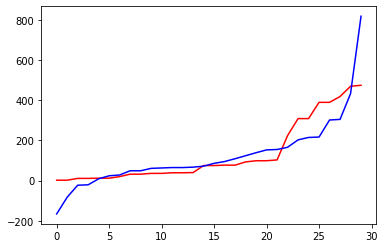

GAN:
[[  9.  78. -58.  52. -13. 156. -13.  72.  -2. 101.  14.  72.  69. 160.
   19.  41. -77. 143. 119.  11. 131. 109. 104. 257. 218. 183. 193. 344.
  371. 673.]]
1999 1.0 0.0
30
30


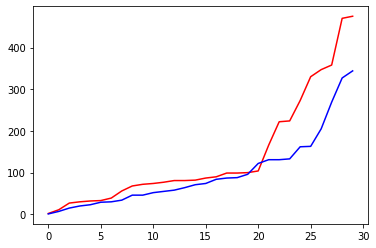

GAN:
[[ 27. -38.  17.  37.  35.  71. -15.  50.   2.  34.   9.  36.  -2.  60.
   71.  45. -10.  63.  54.  70.  33.  67.  86.  72. 131. 124. 143. 168.
  228. 317.]]
2999 1.0 1.0
30
30


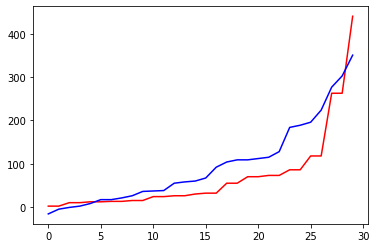

GAN:
[[-16. -17. -28. -17.  53. -23.  23.   4.  21.  16.  85.  93.  76.  67.
   40.  96. 159.  99.  99. 136. 131. 185. 163. 194. 234. 218. 359. 418.
  470. 476.]]
3999 1.0 1.0
30
30


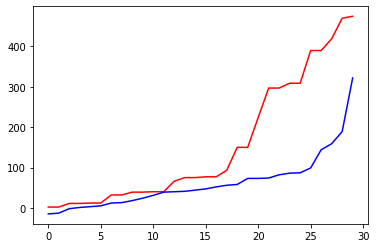

GAN:
[[ 18.  -4.  25.  40.  30.  53. -21.   7.  36.  49.  16.  11.  43.  44.
   53.  67.  -4.  43.  83.  55.  31.  52.  85.  58.  65.  64.  25. 114.
  152. 392.]]
4999 1.0 1.0
30
30


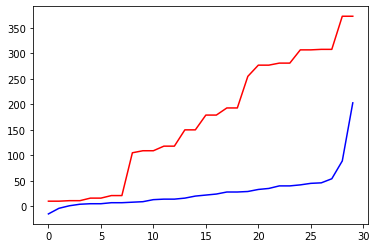

GAN:
[[ -4. -13.   1.   1.   9.  18.  21.   6.  19.  -5.   5.  51.  24.  11.
   43.  47.  75.  47.  24.  41.  35.  54.  56.  46.  98.  78. 169. 132.
  180. 226.]]
5999 1.0 1.0
30
30


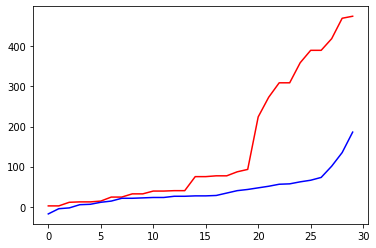

GAN:
[[ 44.   6. -22.  22.  -6.  -3.  14.  25.  28.  16.  27.  46.  24.  79.
   -7.  36.  56.  48.  18.  45.  62.  54.  35.  54.  80.  71.  64. 134.
  164. 224.]]
6999 1.0 1.0
30
30


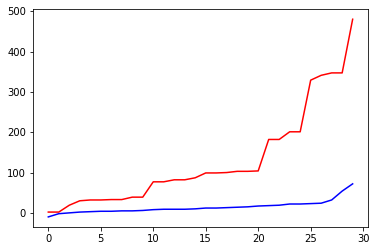

GAN:
[[ 17.  14.  -7.  25. -12. -33.  13. -55.  44.  17.  40. 101.  64.  50.
    2.  38.  60.  62.  53.  63.  45.  83.  66.  92.  98.  64. 118. 167.
  253. 219.]]
7999 1.0 1.0
30
30


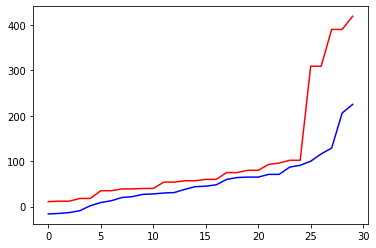

GAN:
[[ -3.   7.  16.  16. -11.   4.   3.  10.  19.  19.   9.  26.  20.  14.
   -3.  23.   6.   9.  20.  49.  17.  41.  44.  49.  23.  40.  23.  56.
  111.  56.]]
8999 1.0 1.0
30
30


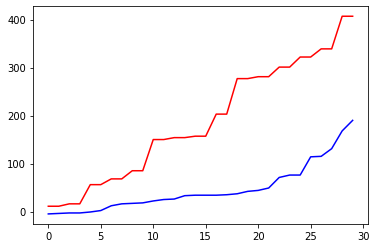

GAN:
[[  9.   8.   9.  -3.  19.  -7.  11.   9.   3.  15.  34.   5.  17.  25.
    7.  17.  39.  26.  30.   9.  14.  23.  19.  73.  33.  55.  58.  58.
  105. 111.]]
9999 1.0 1.0
30
30


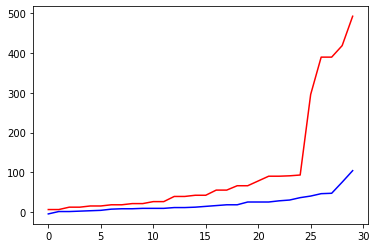

GAN:
[[ -0.   2.  -2.  14.  14.  -1.  11.  15.   6.  20.  39.  27.  25.  32.
    4.  22.  52.  27.  16.  35.  41.  30.  31.  47.  80.  67.  75.  75.
  156. 200.]]


In [134]:

latent_dim =30
# create the discriminator

#try changing activations n such on models
discriminator = define_discriminator()
# create the generator
generator = define_generator(latent_dim)
# create the gan
gan_model = define_gan(generator, discriminator)
# train model
created_decks, created_gans, new_cards, new_deck_list = train(generator, discriminator, gan_model, latent_dim, choice, deck_list)


In [135]:

final_decks = []
for decks in created_gans:
    deck = []
    #check for negative id's
    for card in decks[0]:
        #if absolute of card id is within card list range
        if abs(card) <= len(new_cards):
            deck.append(abs(card))
        else:
            break
    #check if deck has 30 cards
    if(len(deck) == 30):
        final_decks.append(deck)
                      
print(final_decks)

for decks in final_decks:
    print('DECK:')
    #convert float list to int list
    decks = [int(a) for a in decks]
    print(decks)
    print(len(new_cards))
    readable = vector_to_deck(decks, new_cards)
    for card in readable:
        print(card['name'], ',  ' ,card['playerClass'])


[[27.0, 38.0, 17.0, 37.0, 35.0, 71.0, 15.0, 50.0, 2.0, 34.0, 9.0, 36.0, 2.0, 60.0, 71.0, 45.0, 10.0, 63.0, 54.0, 70.0, 33.0, 67.0, 86.0, 72.0, 131.0, 124.0, 143.0, 168.0, 228.0, 317.0], [16.0, 17.0, 28.0, 17.0, 53.0, 23.0, 23.0, 4.0, 21.0, 16.0, 85.0, 93.0, 76.0, 67.0, 40.0, 96.0, 159.0, 99.0, 99.0, 136.0, 131.0, 185.0, 163.0, 194.0, 234.0, 218.0, 359.0, 418.0, 470.0, 476.0], [18.0, 4.0, 25.0, 40.0, 30.0, 53.0, 21.0, 7.0, 36.0, 49.0, 16.0, 11.0, 43.0, 44.0, 53.0, 67.0, 4.0, 43.0, 83.0, 55.0, 31.0, 52.0, 85.0, 58.0, 65.0, 64.0, 25.0, 114.0, 152.0, 392.0], [4.0, 13.0, 1.0, 1.0, 9.0, 18.0, 21.0, 6.0, 19.0, 5.0, 5.0, 51.0, 24.0, 11.0, 43.0, 47.0, 75.0, 47.0, 24.0, 41.0, 35.0, 54.0, 56.0, 46.0, 98.0, 78.0, 169.0, 132.0, 180.0, 226.0], [44.0, 6.0, 22.0, 22.0, 6.0, 3.0, 14.0, 25.0, 28.0, 16.0, 27.0, 46.0, 24.0, 79.0, 7.0, 36.0, 56.0, 48.0, 18.0, 45.0, 62.0, 54.0, 35.0, 54.0, 80.0, 71.0, 64.0, 134.0, 164.0, 224.0], [17.0, 14.0, 7.0, 25.0, 12.0, 33.0, 13.0, 55.0, 44.0, 17.0, 40.0, 101.0, 64.0, 

In [136]:
#final_decks = [[49.0, 19.0, 87.0, 59.0, 15.0, 45.0, 55.0, 86.0, 28.0, 82.0, 102.0, 10.0, 122.0, 63.0, 38.0, 6.0, 94.0, 6.0, 246.0, 112.0, 145.0, 202.0, 65.0, 166.0, 337.0, 238.0, 314.0, 213.0, 437.0, 459.0], [23.0, 20.0, 11.0, 22.0, 102.0, 90.0, 66.0, 16.0, 53.0, 30.0, 27.0, 69.0, 5.0, 73.0, 63.0, 39.0, 33.0, 109.0, 19.0, 84.0, 37.0, 30.0, 78.0, 93.0, 37.0, 71.0, 75.0, 183.0, 285.0, 401.0], [13.0, 6.0, 7.0, 11.0, 53.0, 0.0, 37.0, 35.0, 9.0, 43.0, 68.0, 0.0, 72.0, 26.0, 45.0, 41.0, 68.0, 58.0, 84.0, 73.0, 52.0, 12.0, 71.0, 98.0, 96.0, 100.0, 115.0, 134.0, 269.0, 281.0], [6.0, 12.0, 2.0, 1.0, 32.0, 49.0, 74.0, 1.0, 61.0, 26.0, 27.0, 55.0, 6.0, 68.0, 43.0, 49.0, 38.0, 86.0, 28.0, 53.0, 40.0, 43.0, 69.0, 51.0, 7.0, 52.0, 51.0, 160.0, 235.0, 287.0]]
#final_decks = [[43.0, 6.0, 16.0, 22.0, 25.0, 76.0, 18.0, 34.0, 95.0, 46.0, 15.0, 2.0, 120.0, 112.0, 108.0, 114.0, 95.0, 138.0, 63.0, 135.0, 130.0, 90.0, 208.0, 143.0, 266.0, 205.0, 250.0, 255.0, 230.0, 326.0], [43.0, 63.0, 18.0, 16.0, 3.0, 8.0, 42.0, 12.0, 25.0, 72.0, 124.0, 60.0, 77.0, 37.0, 34.0, 72.0, 87.0, 76.0, 121.0, 89.0, 131.0, 90.0, 155.0, 87.0, 162.0, 212.0, 269.0, 244.0, 300.0, 407.0], [34.0, 41.0, 8.0, 46.0, 28.0, 0.0, 25.0, 7.0, 77.0, 106.0, 123.0, 40.0, 117.0, 51.0, 6.0, 57.0, 55.0, 42.0, 52.0, 98.0, 127.0, 78.0, 150.0, 105.0, 170.0, 146.0, 229.0, 232.0, 219.0, 291.0], [17.0, 21.0, 8.0, 31.0, 6.0, 32.0, 14.0, 3.0, 14.0, 51.0, 36.0, 25.0, 40.0, 0.0, 43.0, 38.0, 23.0, 28.0, 51.0, 48.0, 87.0, 49.0, 100.0, 64.0, 79.0, 84.0, 149.0, 143.0, 184.0, 223.0]]
#new_cards, new_deck_list = limit_card_range(copy.deepcopy(cards), copy.deepcopy(deck_list), [choice, 'Neutral'])

duplicates = []
final = []
to_add = True
for decks in final_decks:
    print('DECK:')
    #convert float list to int list
    decks = [int(a) for a in decks]
    readable = vector_to_deck(decks, new_cards)
    for card in readable:
        #if duplicates of card is superior to 2 then deck is illegal
        if(readable.count(card) > 2): 
            to_add = False
            #final_decks.remove(decks)
        #different duplicate check for legendary cards
        if(card['rarity'] == 'Lengendary'):
            if(card in duplicates):
                to_add = False
                #final_decks.remove(decks)
            else:
                duplicates.append(card)
        print(card['name'], ',  ' ,card['playerClass'])
    if(to_add):
        final.append(decks)

DECK:
EVIL Genius ,   Warlock
Backfire ,   Warlock
Soulfire ,   Warlock
Twisted Knowledge ,   Warlock
Soul Shear ,   Warlock
Nightshade Matron ,   Warlock
Shadow Council ,   Warlock
Luckysoul Hoarder ,   Warlock
Raise Dead ,   Priest
Plot Twist ,   Warlock
Felosophy ,   Warlock
Soul Shear ,   Warlock
Raise Dead ,   Priest
Brittlebone Destroyer ,   Priest
Nightshade Matron ,   Warlock
Free Admission ,   Warlock
Fiendish Servant ,   Warlock
Disciplinarian Gandling ,   Priest
Revenant Rascal ,   Warlock
Impbalming ,   Warlock
Nether Breath ,   Warlock
Fiendish Rites ,   Warlock
Dread Infernal ,   Warlock
Pit Lord ,   Warlock
Mogu Cultist ,   Neutral
Hot Air Balloon ,   Neutral
Sphere of Sapience ,   Neutral
Dragon Breeder ,   Neutral
Arcane Watcher ,   Neutral
Evasive Feywing ,   Neutral
DECK:
Sinister Deal ,   Warlock
Soulfire ,   Warlock
Expired Merchant ,   Warlock
Soulfire ,   Warlock
Rafaam's Scheme ,   Warlock
Wicked Whispers ,   Warlock
Wicked Whispers ,   Warlock
Blood Imp ,   War

In [137]:
print(len(final))
print(final)

3
[[27, 38, 17, 37, 35, 71, 15, 50, 2, 34, 9, 36, 2, 60, 71, 45, 10, 63, 54, 70, 33, 67, 86, 72, 131, 124, 143, 168, 228, 317], [16, 17, 28, 17, 53, 23, 23, 4, 21, 16, 85, 93, 76, 67, 40, 96, 159, 99, 99, 136, 131, 185, 163, 194, 234, 218, 359, 418, 470, 476], [18, 4, 25, 40, 30, 53, 21, 7, 36, 49, 16, 11, 43, 44, 53, 67, 4, 43, 83, 55, 31, 52, 85, 58, 65, 64, 25, 114, 152, 392]]


Neutral Card % in new_cards:  0.7834008097165992


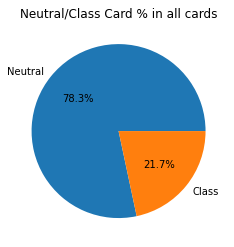

Neutral Card % in all cards  0.1


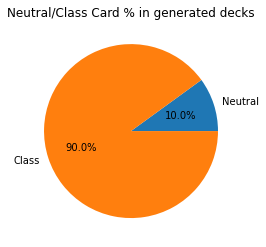

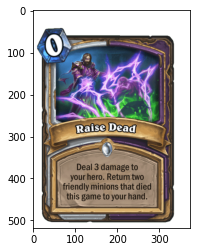

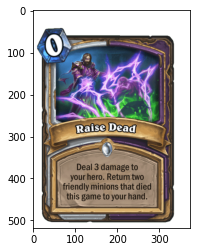

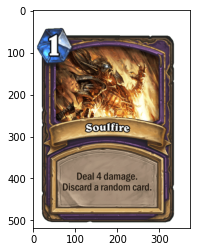

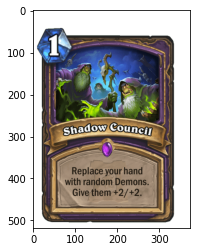

...

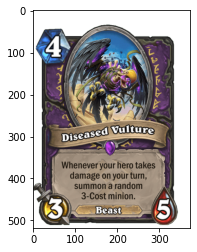

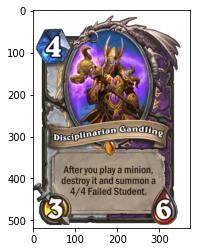

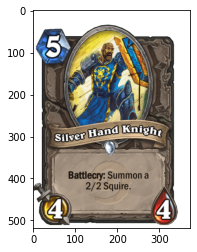

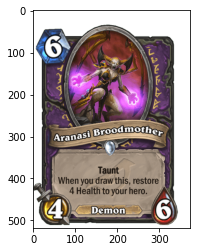

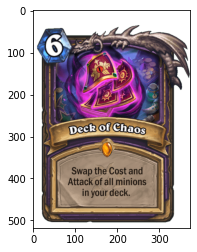

In [138]:
from PIL import Image
import requests
from io import BytesIO

readable_array = []

for final_deck in final:
    show_decks = [int(a) for a in final_deck]
    readable = vector_to_deck(show_decks, new_cards)
    readable = groupby_cost(readable)
    readable_array.append(readable)

res = (len(sort_by_class('Neutral',new_cards))/len(new_cards))
print("Neutral Card % in new_cards: ", (len(sort_by_class('Neutral',new_cards))/len(new_cards)))
plt.pie([res, 1-res], labels=['Neutral', 'Class'], autopct='%1.1f%%')
plt.title('Neutral/Class Card % in all cards')
plt.show()
res = (len(sort_by_class('Neutral',readable))/len(readable))
print("Neutral Card % in all cards ", (len(sort_by_class('Neutral',readable))/len(readable)))
plt.pie([res, 1-res], labels=['Neutral', 'Class'], autopct='%1.1f%%')
plt.title('Neutral/Class Card % in generated decks')
plt.show()



for read in readable_array:
    for card in read:
        response = requests.get(card['img'])
        img = Image.open(BytesIO(response.content)) 
        plt.figure()
        plt.imshow(img)
        plt.show()

[{'Spell': 9, 'Minion': 19, 'Weapon': 2}, {'Spell': 13, 'Minion': 15, 'Weapon': 2}, {'Spell': 10, 'Minion': 19, 'Weapon': 1}, {'Spell': 12, 'Weapon': 3, 'Minion': 15}, {'Spell': 9, 'Minion': 21}, {'Spell': 10, 'Minion': 19, 'Weapon': 1}]


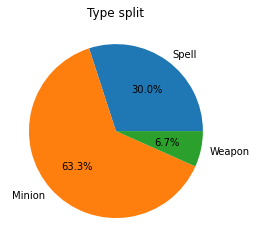

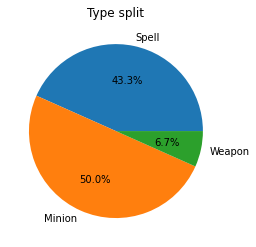

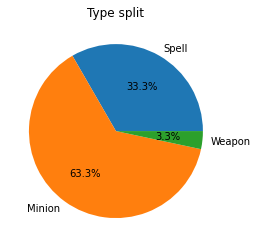

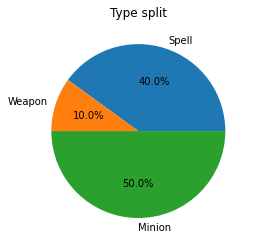

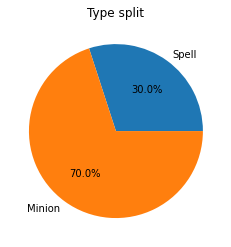

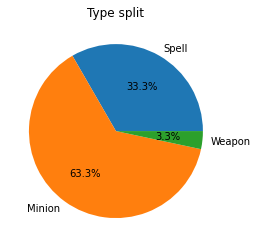

In [118]:
def calculate_type_split(jsonArray):
    decks_type_split = []
    for deck in jsonArray:
        types_in_deck = {}
        for i in range(len(deck)):   
            if deck[i]['type'] in types_in_deck:
                types_in_deck[deck[i]['type']] += 1
            else:
                types_in_deck[deck[i]['type']] = 1
        decks_type_split.append(types_in_deck)
    print(decks_type_split)
    return decks_type_split


def draw_pie_chart(decks_type_split):
    for deck_types in decks_type_split:
        performance = []
        x_pos = []
        for key in deck_types:
            x_pos.append(key)
            performance.append(deck_types[key]/30)
        plt.pie(performance, labels=x_pos, autopct='%1.1f%%')
        plt.title('Type split')
        plt.show()


#generated decks       
decks_type_split = calculate_type_split(readable_array)
draw_pie_chart(decks_type_split)

[{'Spell': 14, 'Weapon': 3, 'Minion': 13}, {'Spell': 14, 'Minion': 14, 'Weapon': 2}, {'Spell': 12, 'Weapon': 2, 'Minion': 16}, {'Spell': 12, 'Minion': 16, 'Weapon': 2}, {'Spell': 1, 'Minion': 27, 'Weapon': 2}, {'Spell': 9, 'Minion': 21}]


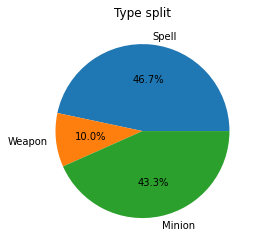

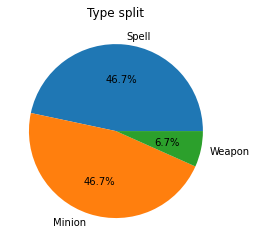

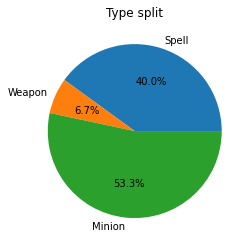

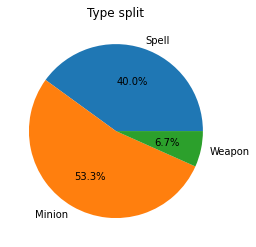

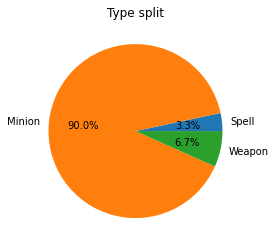

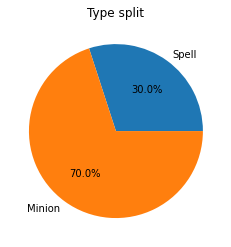

Neutral Card % in new_cards:  0.39444444444444443


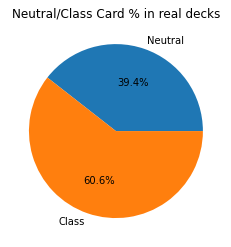

In [119]:

#real decks
read_decks_split = random.sample(new_deck_list, len(decks_type_split))
draw_pie_chart(calculate_type_split(read_decks_split))

merged = []
for d in read_decks_split:
    merged.extend(d)
    
res = (len(sort_by_class('Neutral',merged))/len(merged))
print("Neutral Card % in real decks: ", (len(sort_by_class('Neutral',merged))/len(merged)))
plt.pie([res, 1-res], labels=['Neutral', 'Class'], autopct='%1.1f%%')
plt.title('Neutral/Class Card % in real decks')
plt.show()

{0: 1, 1: 9, 2: 10, 3: 1, 4: 3, 5: 2, 6: 1, 7: 1, 8: 2, 9: 0, 10: 0}
{0: 2, 1: 7, 2: 8, 3: 2, 4: 3, 5: 3, 6: 3, 7: 1, 8: 0, 9: 0, 10: 1}
{0: 1, 1: 7, 2: 10, 3: 5, 4: 1, 5: 1, 6: 1, 7: 2, 8: 1, 9: 0, 10: 1}
{0: 0, 1: 6, 2: 11, 3: 10, 4: 0, 5: 2, 6: 0, 7: 0, 8: 0, 9: 1, 10: 0}
{0: 2, 1: 6, 2: 11, 3: 5, 4: 2, 5: 0, 6: 2, 7: 1, 8: 0, 9: 0, 10: 1}
{0: 2, 1: 6, 2: 12, 3: 4, 4: 1, 5: 2, 6: 1, 7: 0, 8: 1, 9: 1, 10: 0}


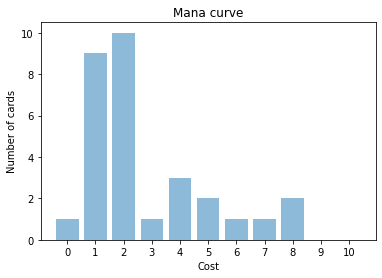

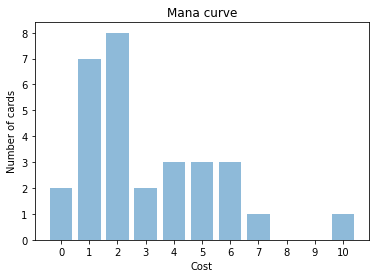

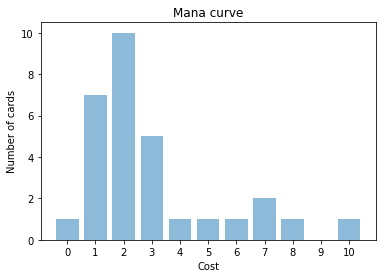

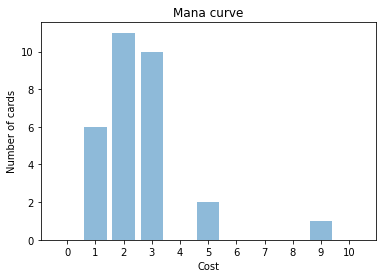

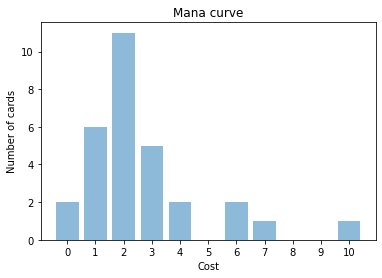

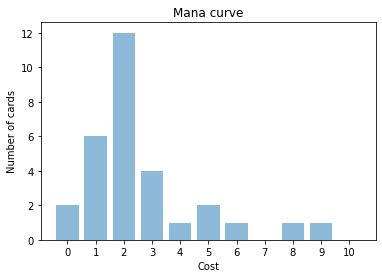

In [120]:

def calculate_mana_curve(jsonArray):
    mana_curve_array = []
    for deck in jsonArray:
        mana_curve = {0:0,1:0,2:0,3:0,4:0,5:0,6:0,7:0,8:0,9:0,10:0}
        for i in range(len(deck)):
            #print(deck[i]['cost'])
            if deck[i]['cost'] in mana_curve:
               # print(mana_curve)
                mana_curve[deck[i]['cost']] += 1
               # to_add = mana_curve[i] +1
            else:
                mana_curve[deck[i]['cost']] = 1
        mana_curve_array.append(mana_curve)
        print(mana_curve)
    return mana_curve_array
 
def draw_mana_curve(mana_curve_array):
    for mana_curve in mana_curve_array:
        performance = []
        for i in range(len(mana_curve)):
            performance.append(mana_curve[i])
            # print(len(deck[i]))
        y_pos = np.arange(len(mana_curve))
        plt.bar(y_pos, performance, align="center", alpha=0.5)
        plt.xticks(y_pos, [0,1,2,3,4,5,6,7,8,9,10])
        plt.ylabel('Number of cards')
        plt.xlabel('Cost')
        plt.title('Mana curve')
        plt.show()
#generated decks        
mana_curve_array = calculate_mana_curve(readable_array)
draw_mana_curve(mana_curve_array)

{0: 0, 1: 2, 2: 4, 3: 9, 4: 8, 5: 3, 6: 4, 7: 0, 8: 0, 9: 0, 10: 0}
{0: 2, 1: 0, 2: 4, 3: 10, 4: 4, 5: 4, 6: 3, 7: 1, 8: 0, 9: 2, 10: 0}
{0: 2, 1: 2, 2: 4, 3: 5, 4: 4, 5: 4, 6: 0, 7: 3, 8: 2, 9: 0, 10: 4}
{0: 0, 1: 5, 2: 10, 3: 7, 4: 4, 5: 2, 6: 0, 7: 2, 8: 0, 9: 0, 10: 0}
{0: 2, 1: 2, 2: 11, 3: 4, 4: 4, 5: 4, 6: 0, 7: 3, 8: 0, 9: 0, 10: 0}
{0: 0, 1: 7, 2: 7, 3: 4, 4: 3, 5: 4, 6: 3, 7: 1, 8: 0, 9: 0, 10: 1}


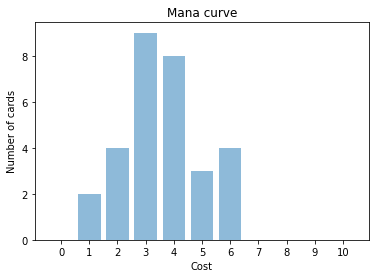

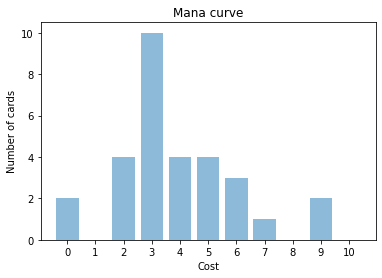

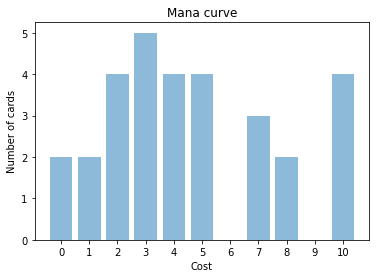

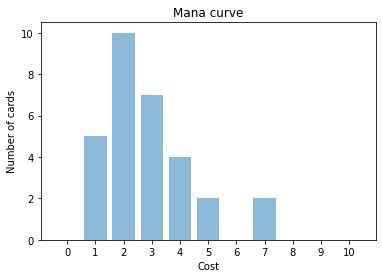

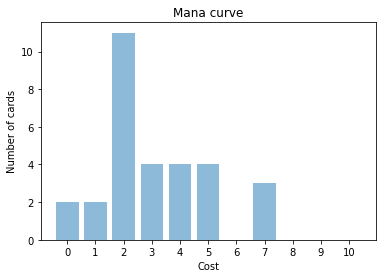

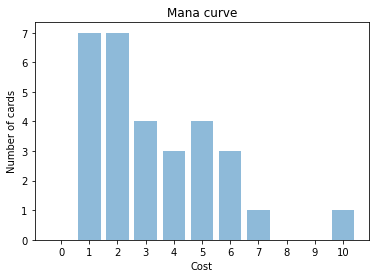

In [121]:
#real decks
read_decks_split = random.sample(new_deck_list, len(decks_type_split))
draw_mana_curve(calculate_mana_curve(read_decks_split))


In [122]:
def convert_to_simulator(deck):
    converted_deck = []
    for card in deck:
        converted_deck.append(card['cardId'])
    return converted_deck

def convert_array_to_simulator(decks):
    converted_decks = []
    for deck in decks:
        converted_deck = []
        for card in deck:
            converted_deck.append(card['cardId'])
        converted_decks.append(converted_deck)
    return converted_decks

def get_real_sample(class_):
    print("Sampling a",class_, "deck from dataset")
    deck_list = read_json_decks('data_'+class_+'.json')
    d = random.sample(deck_list,1)
    d = convert_to_simulator(d[0])
    return d, class_

enemy_deck, enemy_class = get_real_sample(random.choice(classes))
print(enemy_deck)

#fireplace_deck = ['YOP_015', 'YOP_013', 'YOP_013', 'BT_233', 'DRG_239', 'BT_722', 'CS2_104', 'DAL_759', 'CS2_104', 'DMF_189', 'ULD_309', 'BT_781', 'DRG_025', 'EX1_084', 'DMF_530', 'YOD_024', 'SCH_521', 'BT_140', 'SCH_317', 'DRG_020', 'DRG_022', 'EX1_507', 'EX1_020', 'YOP_005', 'BT_190', 'DMF_528', 'ULD_707', 'ULD_253', 'SCH_337', 'DAL_059']
fireplace_decks = convert_array_to_simulator(readable_array)
print(len(fireplace_decks))

Sampling a Hunter deck from dataset
['DS1_175', 'DS1_175', 'EX1_610', 'EX1_610', 'CS2_084', 'CS2_084', 'EX1_531', 'EX1_531', 'EX1_609', 'EX1_609', 'NEW1_031', 'NEW1_031', 'EX1_617', 'EX1_617', 'EX1_539', 'EX1_539', 'EX1_538', 'EX1_538', 'DS1_070', 'DS1_070', 'DS1_183', 'DS1_183', 'DS1_178', 'DS1_178', 'EX1_534', 'EX1_534', 'CS2_172', 'CS2_172', 'EX1_162', 'EX1_162']
6


In [123]:
#save current directory so we can navigate back after imports

import os

os.chdir('/home/hart/Documents/RGUProjects/Honours/')

curr_dir = os.getcwd()


In [124]:
#can't get it to run on separate file so I will leave it here
#need to change functions to accomodate opponents class and concat everything into a chart with percentages

import os
import sys
import importlib

importlib.reload(os)

os.chdir('/home/hart/Documents/RGUProjects/Honours/fireplace/tests')

import full_game
import utils_fireplace

importlib.reload(full_game)
importlib.reload(utils_fireplace)


def run_sim(file, args, num):
    results = []
    for i in range(num):
        script_descriptor = open(file)
        a_script = script_descriptor.read()
        sys.argv = args
        exec(a_script)
        result = open("results.txt", 'r')
        line = result.readline()
        print(line)
        line = line.strip('\n')
        results.append(line)
    print(results)
    return results

def run_sim_with_exec(file, args, num, enemy_class):
    results = []
    print("Running Generated deck against a", enemy_class, "\n", enemy_deck)
    for i in range(num):
        script_descriptor = open(file)
        a_script = script_descriptor.read()
        sys.argv = args
        exec(a_script)        
        result = open("results.txt", 'r')
        line = result.readline()
        print(line)
        line = line.strip('\n')
        results.append(line)
    return results

import time

def sim_evaluation(classes, fireplace_deck, name, choice):
    start_time = time.time()
    results = []
    print(len(fireplace_decks))
    for class_ in classes:
        class_result = []
        for fireplace_deck in fireplace_decks:
            os.chdir(curr_dir)
            enemy_deck, enemy_class = get_real_sample(class_)
            os.chdir(curr_dir+'/fireplace/tests')
            try:
                class_result.append(run_sim_with_exec("full_game.py", [choice, fireplace_deck, name, enemy_deck, enemy_class], 10, enemy_class)) #random.choice(classes)
            except:
                print("Error")
        results.append(class_result)
    print("--- %s seconds ---" % (time.time() - start_time))
    os.chdir(curr_dir)
    return results


#os.chdir('/home/hart/Documents/RGUProjects/Honours/')

#os.chdir('/home/hart/Documents/RGUProjects/Honours/')



In [125]:
import sys
original = sys.stdout 

In [126]:
import logging
import fireplace.logging
fireplace.logging.get_logger("fireplace", logging.CRITICAL)
sys.stdout = open('file', 'w')

final_results = []
try:
    results = sim_evaluation(classes, fireplace_decks, "Jamie", choice);
    for result in results:
        final_results.append(result)
except: 
    print("problem")

[['PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.WON', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST'], ['PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.WON', 'PlayState.LOST'], ['PlayState.WON', 'PlayState.LOST', 'PlayState.WON', 'PlayState.WON', 'PlayState.WON', 'PlayState.WON', 'PlayState.WON', 'PlayState.LOST', 'PlayState.WON', 'PlayState.WON'], ['PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.WON', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.WON'], ['PlayState.LOST', 'PlayState.LOST', 'PlayState.WON', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.WON', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST'], ['PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.LOST', 'PlayState.L

In [127]:
sys.stdout = original
print(results[0])
i=0
#Try against random decks and try creating random decks
best = []
all_scores = []
for class_result in final_results:
    best_score = 0
    best_result = []
    print("Class Result for ", classes[i])
    for result in class_result:
        win = 0
        loss = 0
        for score in result:
            if score == "PlayState.WON":
                win+=1
            else:
                loss += 1
        print("Number of Wins:", win)
        print("Number of Losses:", loss)
        print("Winrate:", win/(win+loss))
        
        if best_score < (win/(win+loss)):
            best_score = win/(win+loss)
            best_result = fireplace_decks[class_result.index(result)]
                          
    best.append([best_result, best_score, classes[i]])
    i+=1
print(best)

In [128]:
deck = {}
for class_result in final_results:      
    for i in range(len(class_result)):
        if(i in deck):
            to_add = deck[i]
        else:
            deck[i] = []
            to_add = deck[i]
        #print(class_result[i])
        win = 0
        loss = 0
        curr_deck = []
        for k in range(len(class_result[i])): #every result of deck
            if class_result[i][k] == "PlayState.WON":
                win += 1
            else:
                loss += 1  
        print("Deck", i, ":", win/(win+loss))
        curr_deck = win/(win+loss)
        to_add.append(curr_deck)
        #to_add = deck[i]
        deck[i] = to_add
        
print(deck)

Deck 0 : 0.1
Deck 1 : 0.1
Deck 2 : 0.8
Deck 3 : 0.2
Deck 4 : 0.2
Deck 5 : 0.0
Deck 0 : 0.8
Deck 1 : 0.9
Deck 2 : 0.5
Deck 3 : 0.1
Deck 4 : 1.0
Deck 5 : 0.2
Deck 0 : 0.2
Deck 1 : 0.4
Deck 2 : 0.0
Deck 3 : 0.1
Deck 0 : 1.0
Deck 1 : 0.0
Deck 2 : 0.6
Deck 3 : 0.7
Deck 4 : 0.8
Deck 5 : 0.7
Deck 0 : 0.1
Deck 1 : 0.8
Deck 2 : 0.7
Deck 3 : 0.8
Deck 4 : 0.1
Deck 0 : 0.5
Deck 1 : 0.0
Deck 2 : 0.9
Deck 3 : 1.0
Deck 4 : 0.7
Deck 5 : 0.0
Deck 0 : 0.3
Deck 1 : 0.6
Deck 2 : 0.5
Deck 3 : 0.9
Deck 4 : 0.8
Deck 5 : 0.8
Deck 0 : 0.8
Deck 1 : 0.1
Deck 2 : 0.3
Deck 3 : 0.0
Deck 4 : 0.2
Deck 5 : 0.0
Deck 0 : 0.1
Deck 1 : 0.0
Deck 2 : 0.2
Deck 3 : 0.2
Deck 4 : 0.1
Deck 5 : 0.0
Deck 0 : 0.3
Deck 1 : 0.1
Deck 2 : 0.4
Deck 3 : 0.3
{0: [0.1, 0.8, 0.2, 1.0, 0.1, 0.5, 0.3, 0.8, 0.1, 0.3], 1: [0.1, 0.9, 0.4, 0.0, 0.8, 0.0, 0.6, 0.1, 0.0, 0.1], 2: [0.8, 0.5, 0.0, 0.6, 0.7, 0.9, 0.5, 0.3, 0.2, 0.4], 3: [0.2, 0.1, 0.1, 0.7, 0.8, 1.0, 0.9, 0.0, 0.2, 0.3], 4: [0.2, 1.0, 0.8, 0.1, 0.7, 0.8, 0.2, 0.1], 5: [0.0, 0.2, 0.7, 

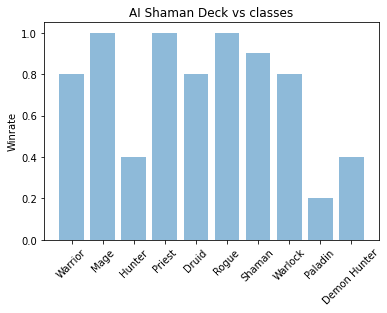

In [129]:
import numpy as np
import matplotlib.pyplot as plt

performance = []
#number of decks of each class
for result in best:
    performance.append(result[1])

y_pos = np.arange(len(best))
plt.bar(y_pos, performance, align="center", alpha=0.5)
plt.xticks(y_pos, classes, rotation = 45)
plt.ylabel('Winrate')
plt.title('AI '+choice+' Deck vs classes')
plt.show()

10


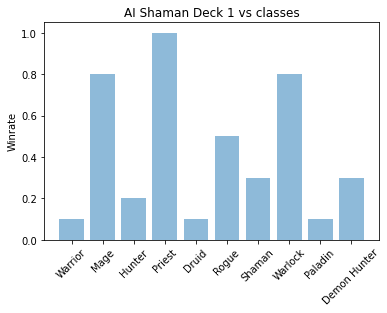

10


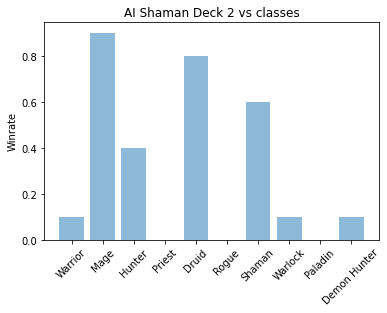

10


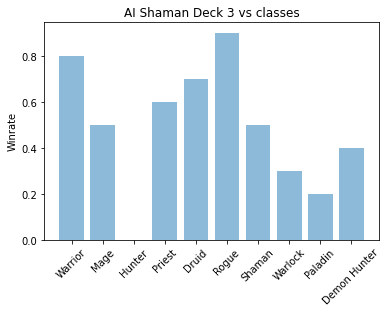

10


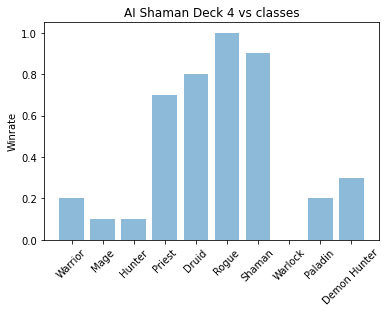

8
7


In [130]:
import numpy as np
import matplotlib.pyplot as plt

performance = []
#number of decks of each class
for i in range(len(deck)):
    performance = []
    for result in deck[i]:
        performance.append(result)
    print(len(deck[i]))
    if(len(deck[i]) == 10):
        y_pos = np.arange(len(deck[i]))
        plt.bar(y_pos, performance, align="center", alpha=0.5)
        plt.xticks(y_pos, classes, rotation = 45)
        plt.ylabel('Winrate')
        plt.title('AI '+choice+' Deck '+ str(i+1) +' vs classes')
        plt.show()
    
    

0.42000000000000004
0.30000000000000004
0.49000000000000005
0.43
0.4875
0.24285714285714285
[0 1 2 3]


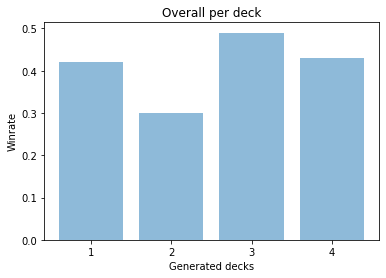

In [132]:

#overall win rate
#random
performance = []
for i in range(len(deck)):
    number = 0
    for result in deck[i]:
        number += result
    print(number/len(deck[i]))
    if len(deck[i]) == 10:
        performance.append(number/len(deck[i]))

y_pos = np.arange(len(performance))
print(y_pos)
plt.bar(y_pos+1, performance, align="center", alpha=0.5)
plt.xticks(y_pos+1)
plt.ylabel('Winrate')
plt.xlabel('Generated decks')
plt.title('Overall per deck')
plt.show()
    

In [ ]:
#creature/spell/weapon percentage in a deck